In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd
from pandas_profiling import ProfileReport
from sklearn import preprocessing
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
pd.pandas.set_option('display.max_columns',None)

# importing dataset

In [2]:
dataset=pd.read_csv('data.csv')

In [3]:
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,2
1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,1
2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,2
3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,1
4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,1


In [4]:
print(dataset.shape)

(270, 14)


In [5]:
report = ProfileReport(dataset,title='Pandas profiling Report', explorative= True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
dataset.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270 entries, 0 to 269
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       270 non-null    int64  
 1   sex       270 non-null    int64  
 2   cp        270 non-null    int64  
 3   trestbps  270 non-null    int64  
 4   chol      270 non-null    int64  
 5   fbs       270 non-null    int64  
 6   restecg   270 non-null    int64  
 7   thalach   270 non-null    int64  
 8   exang     270 non-null    int64  
 9   oldpeak   270 non-null    float64
 10  slope     270 non-null    int64  
 11  ca        270 non-null    int64  
 12  thal      270 non-null    int64  
 13  target    270 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 29.7 KB


In [7]:
dataset.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.00000,270.000000,270.000000,270.000000,270.000000
mean,54.433333,0.677778,3.174074,131.344444,249.659259,0.148148,1.022222,149.677778,0.329630,1.05000,1.585185,0.670370,4.696296,1.444444
std,9.109067,0.468195,0.950090,17.861608,51.686237,0.355906,0.997891,23.165717,0.470952,1.14521,0.614390,0.943896,1.940659,0.497827
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.00000,1.000000,0.000000,3.000000,1.000000
25%,48.000000,0.000000,3.000000,120.000000,213.000000,0.000000,0.000000,133.000000,0.000000,0.00000,1.000000,0.000000,3.000000,1.000000
50%,55.000000,1.000000,3.000000,130.000000,245.000000,0.000000,2.000000,153.500000,0.000000,0.80000,2.000000,0.000000,3.000000,1.000000
75%,61.000000,1.000000,4.000000,140.000000,280.000000,0.000000,2.000000,166.000000,1.000000,1.60000,2.000000,1.000000,7.000000,2.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.20000,3.000000,3.000000,7.000000,2.000000


# Exploratory data analysis 

In [8]:
dataset['target'].value_counts()

1    150
2    120
Name: target, dtype: int64

In [9]:
# Percentage of patients have and do not have heart disease
dataset['target'].value_counts()/dataset.shape[0]*100

1    55.555556
2    44.444444
Name: target, dtype: float64

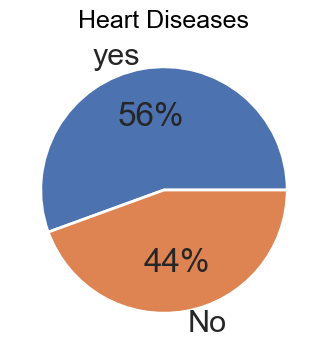

In [10]:
# Create a plot to display the percentage of the positive and negative heart disease 
labels = ['yes', 'No']
values = dataset['target'].value_counts().values
sns.set_theme(context='poster')
plt.figure(figsize=(4,4))
plt.title('Heart Diseases', color="Black",fontsize=18)

plt.pie(values, labels=labels, autopct='%1.0f%%')
#plt.title('People who got Heart Disease')
plt.show()

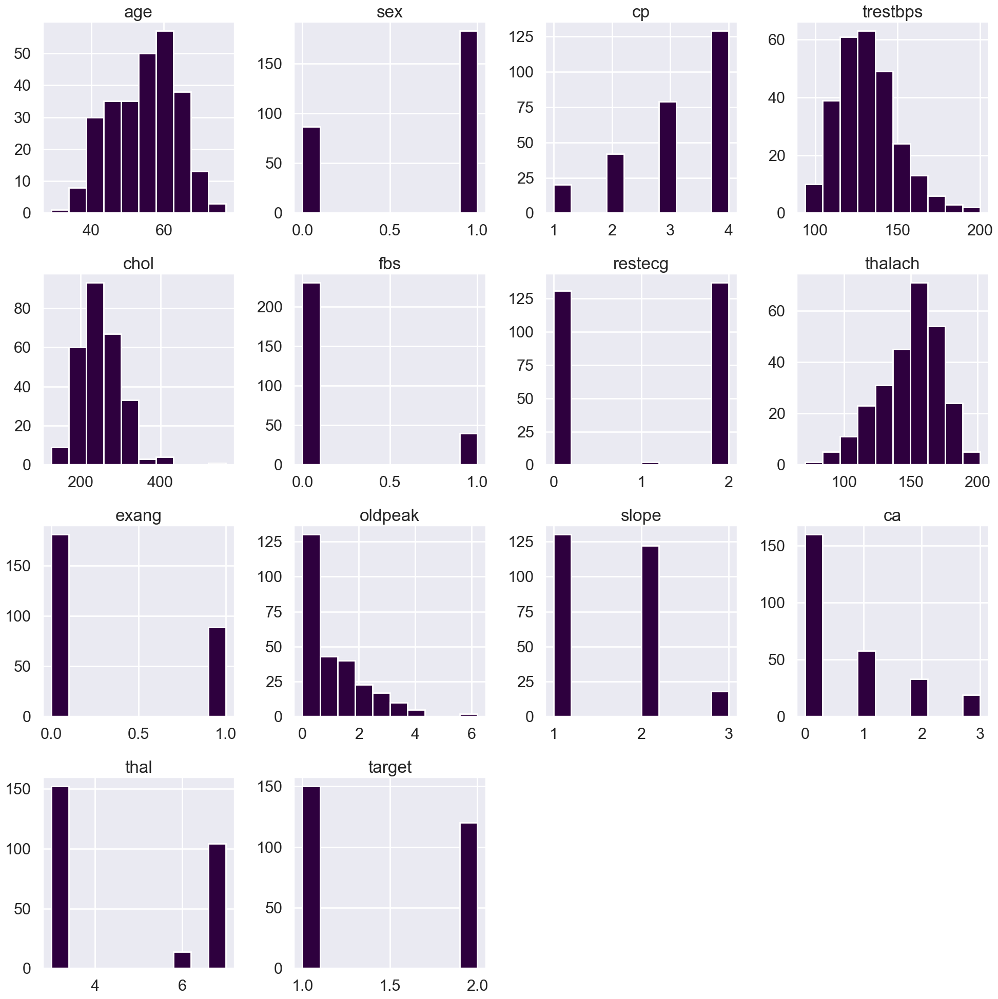

In [11]:
dataset.hist(figsize = (20,20),color='#2e003e')
plt.tight_layout()
plt.show()

In [12]:
numerical_with_nan=[feature for feature in dataset.columns if dataset[feature].isnull().sum()>1 and dataset[feature].dtypes!='O']

## We will print the numerical nan variables and percentage of missing values

for feature in numerical_with_nan:
    print("{}: {}% missing value".format(feature,np.around(dataset[feature].isnull().mean(),4)))

In [13]:
# count the number of NaN values in each column
print(dataset.isnull().sum())

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64


thus there is no null value 

In [14]:
# list of numerical variables
numerical_features = [feature for feature in dataset.columns if dataset[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
dataset[numerical_features].head()

Number of numerical variables:  14


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,2
1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,1
2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,2
3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,1
4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,1


In [15]:
discrete_feature=[feature for feature in numerical_features if len(dataset[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 9


In [16]:
discrete_feature

['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'ca', 'thal', 'target']

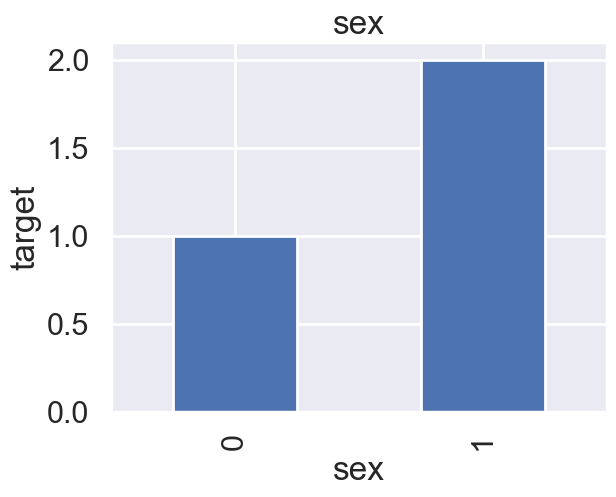

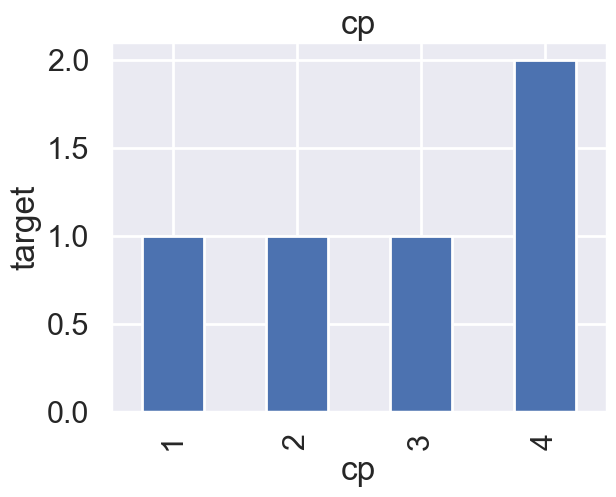

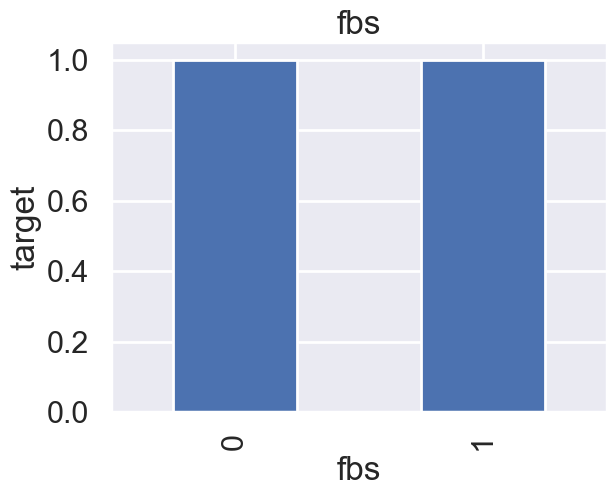

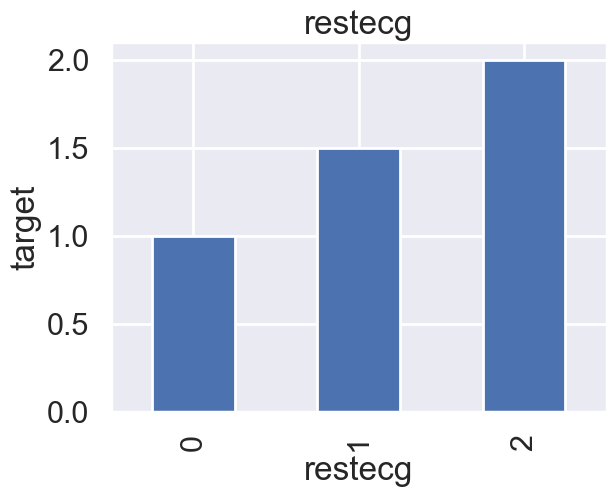

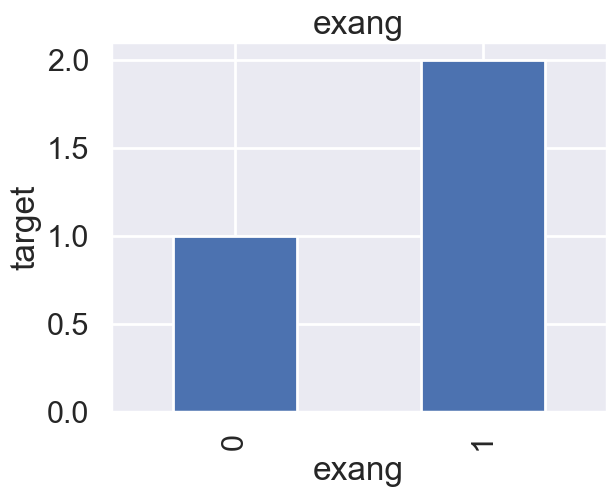

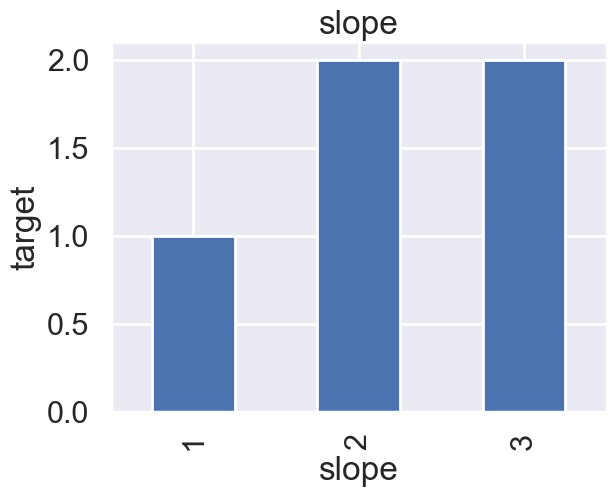

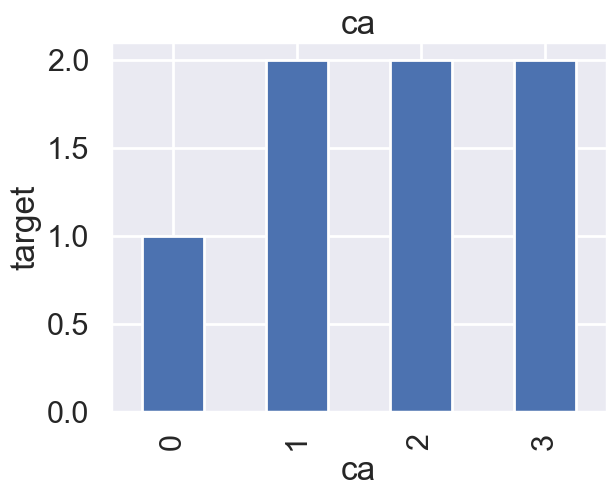

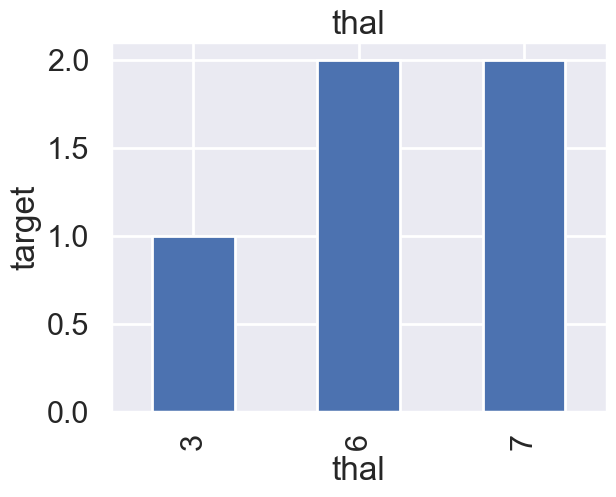

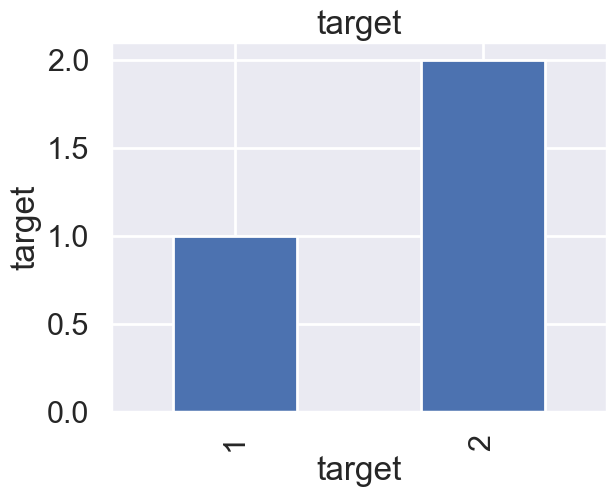

In [17]:
for feature in discrete_feature:
    data=dataset.copy()
    data.groupby(feature)['target'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('target')
    plt.title(feature)
    plt.show()

<AxesSubplot:>

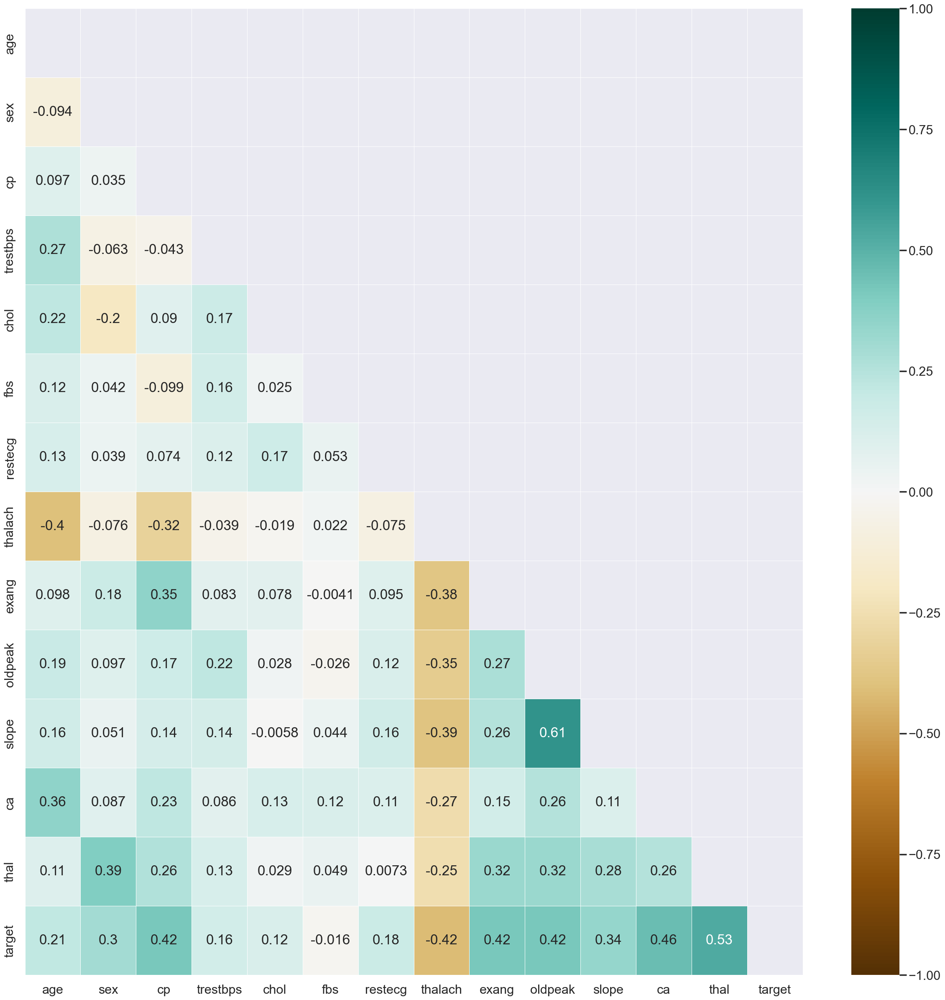

In [18]:
corr = dataset.corr()
plt.figure(figsize=(30,30))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

<AxesSubplot:>

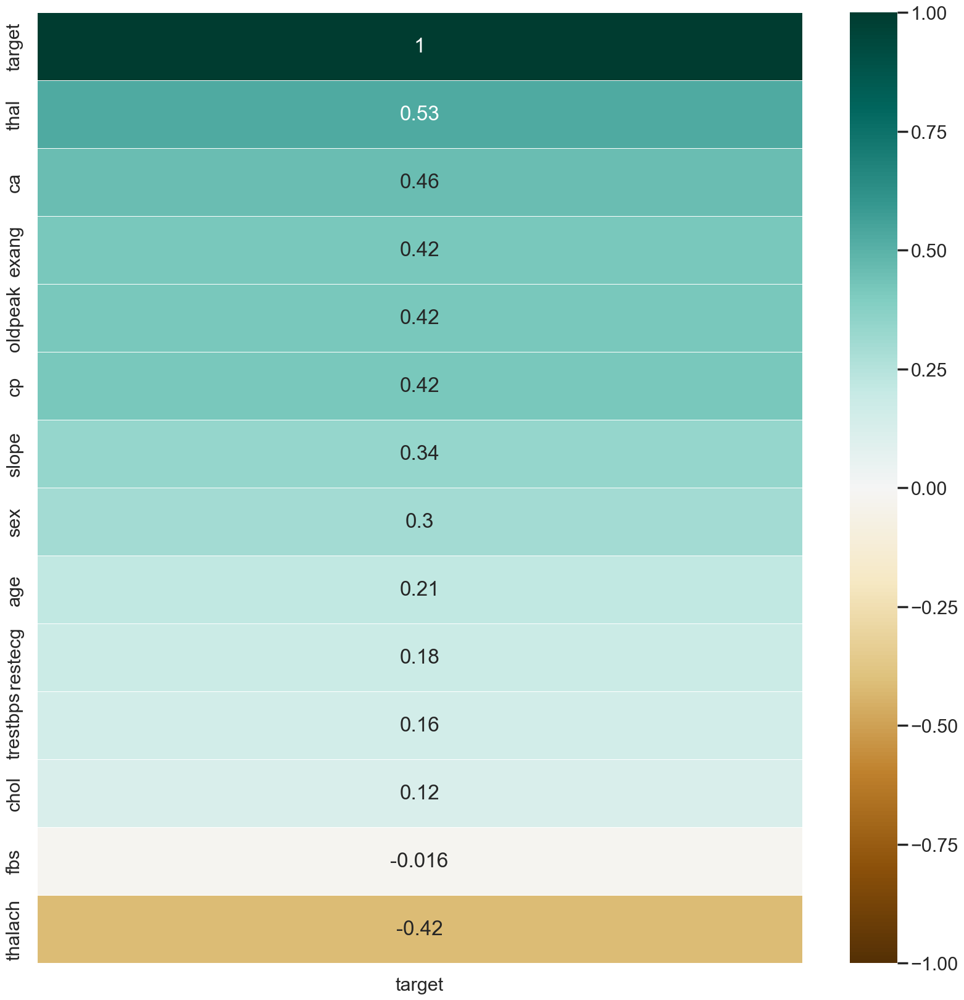

In [19]:
#Correlation between all features with heart disease.
plt.figure(figsize=(20,20))

sns.heatmap(dataset.corr()[['target']].sort_values(by='target', ascending=False),cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

In [20]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("Continuous feature Count {}".format(len(continuous_feature)))
continuous_feature

Continuous feature Count 5


['age', 'trestbps', 'chol', 'thalach', 'oldpeak']

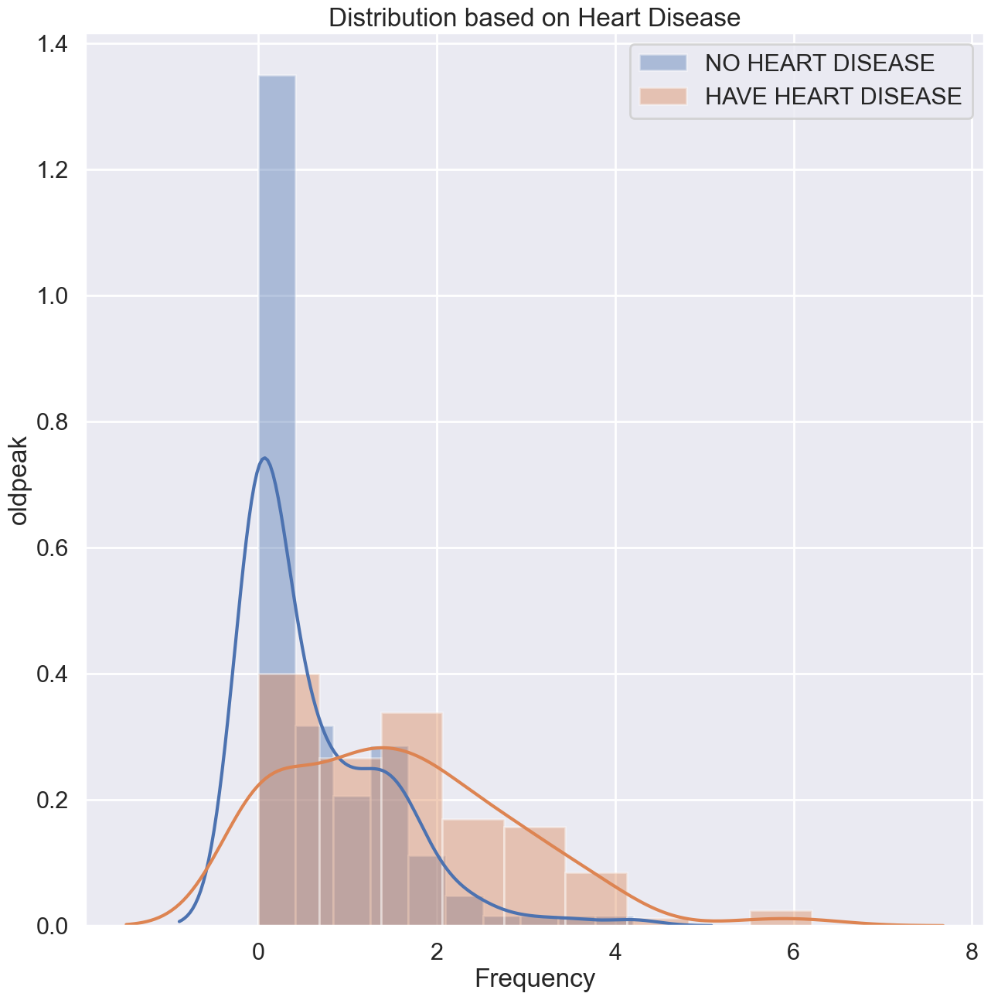

In [26]:
# Display age distribution based on heart disease
plt.figure(figsize=(15,15))
sns.distplot(dataset[dataset['target'] == 1]['oldpeak'], label='NO HEART DISEASE')
sns.distplot(dataset[dataset['target'] == 2]['oldpeak'], label = 'HAVE HEART DISEASE')
plt.xlabel('Frequency')
plt.ylabel('oldpeak')
plt.title('Distribution based on Heart Disease')
plt.legend()
plt.show()

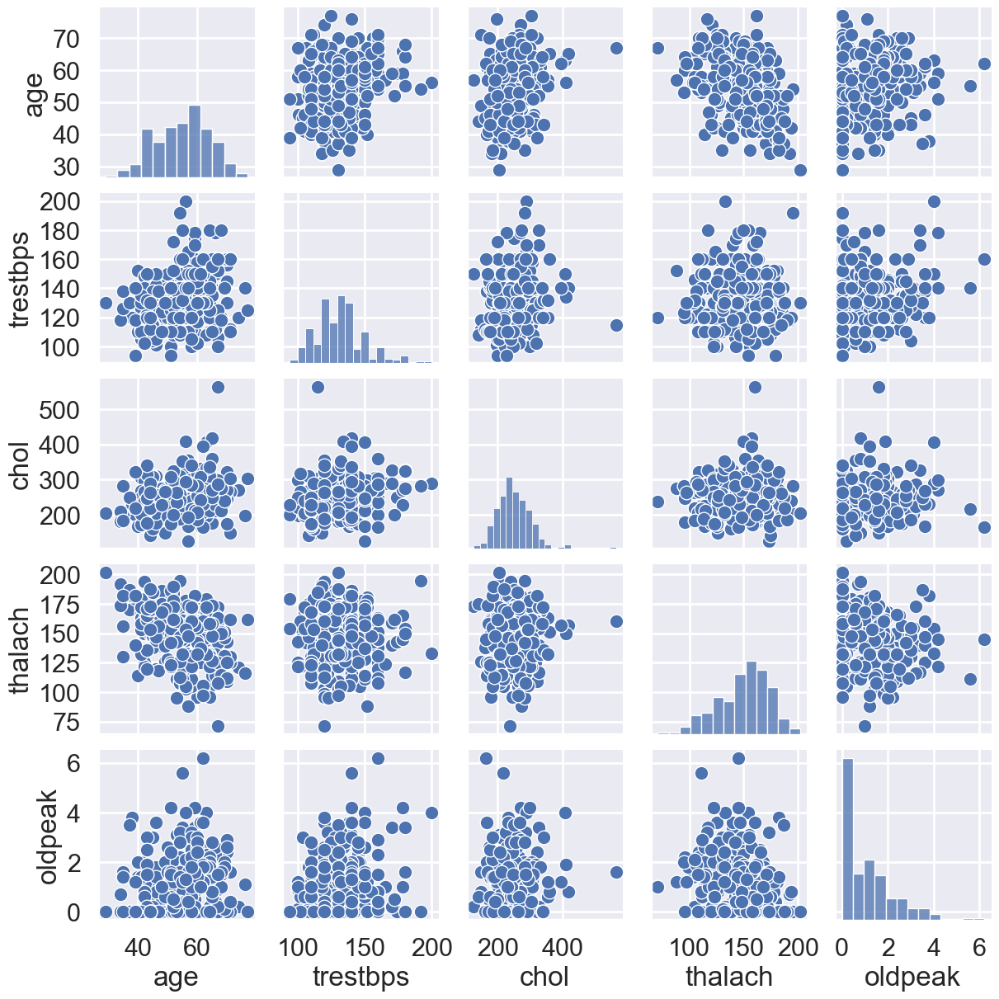

In [24]:
continuous = dataset[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']]
sns.pairplot(continuous)
sns.set(rc={'figure.figsize':(30,30)})

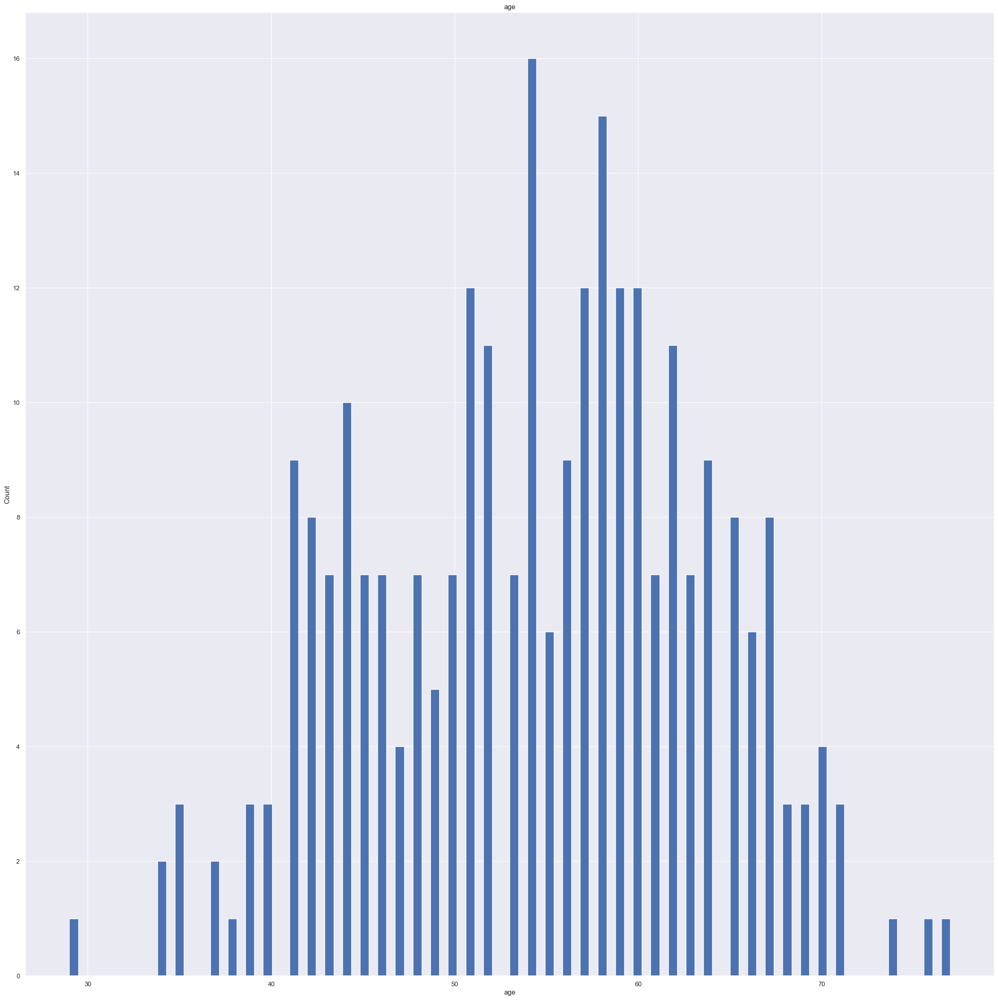

<Figure size 10x10 with 0 Axes>

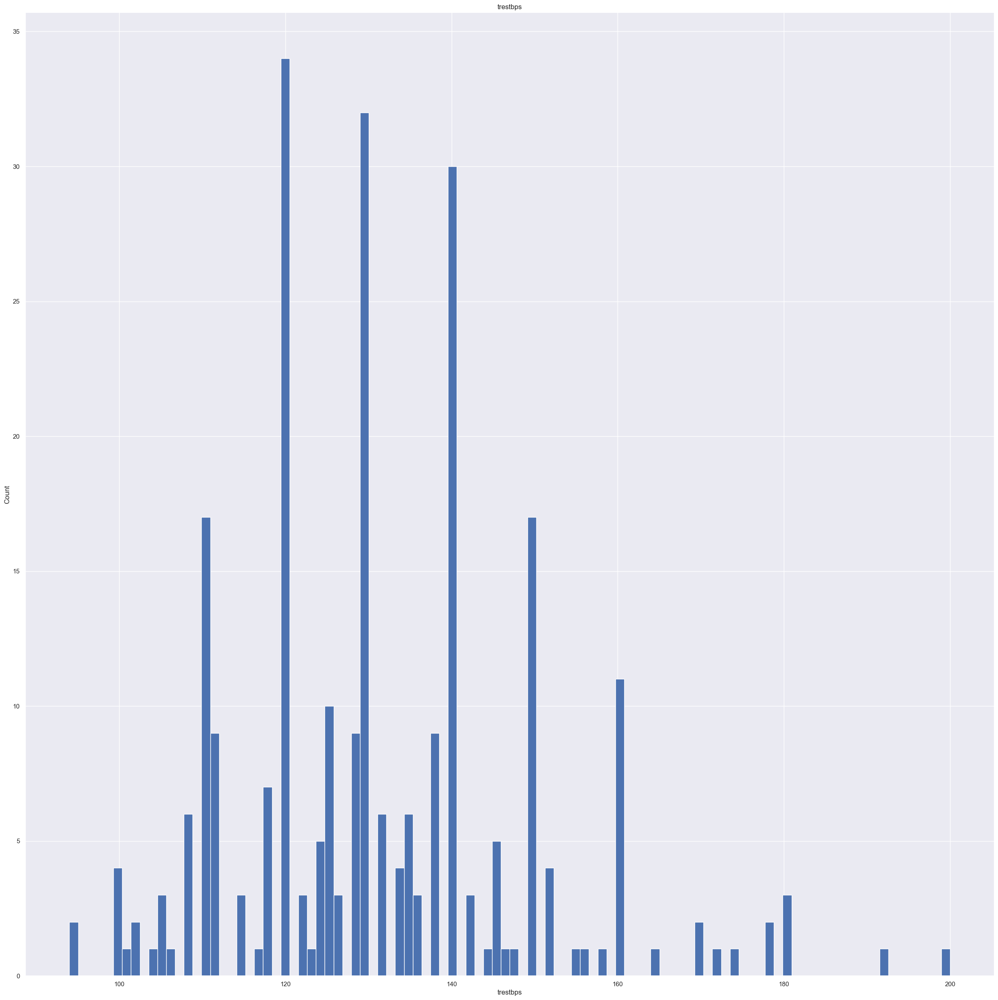

<Figure size 10x10 with 0 Axes>

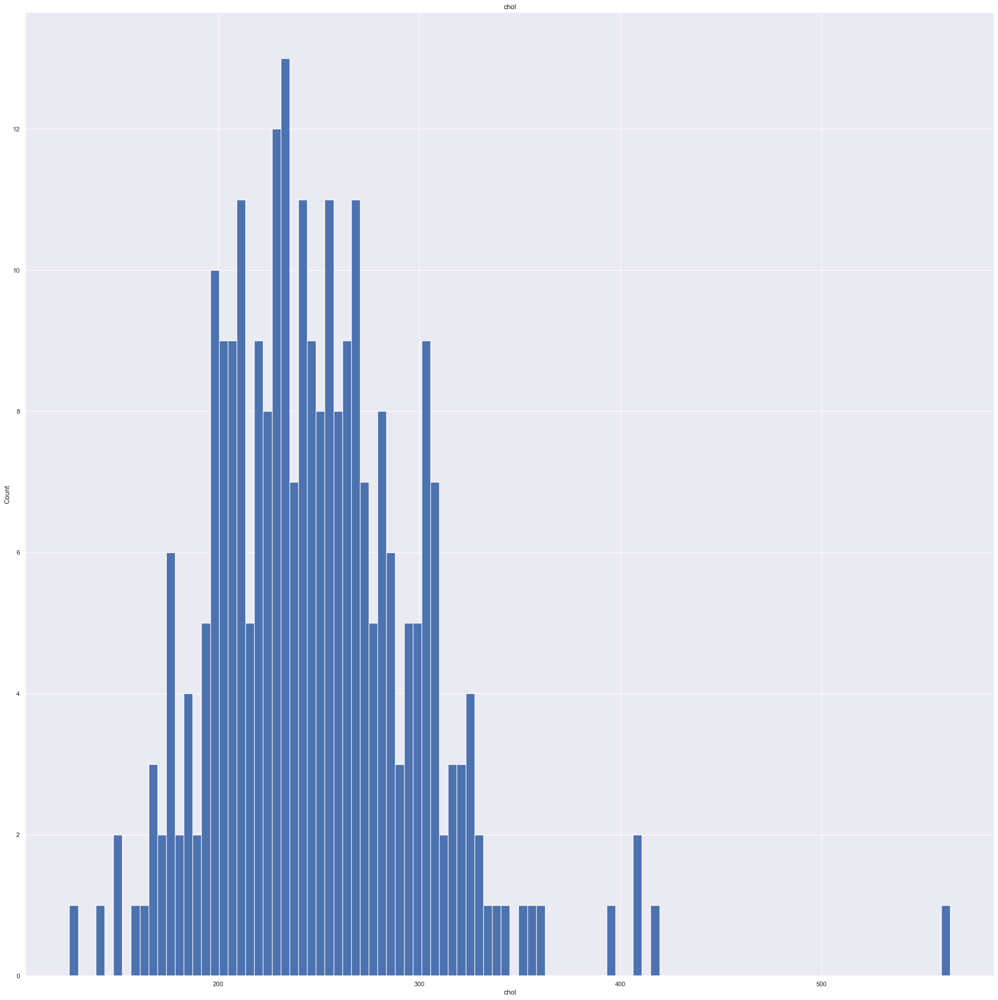

<Figure size 10x10 with 0 Axes>

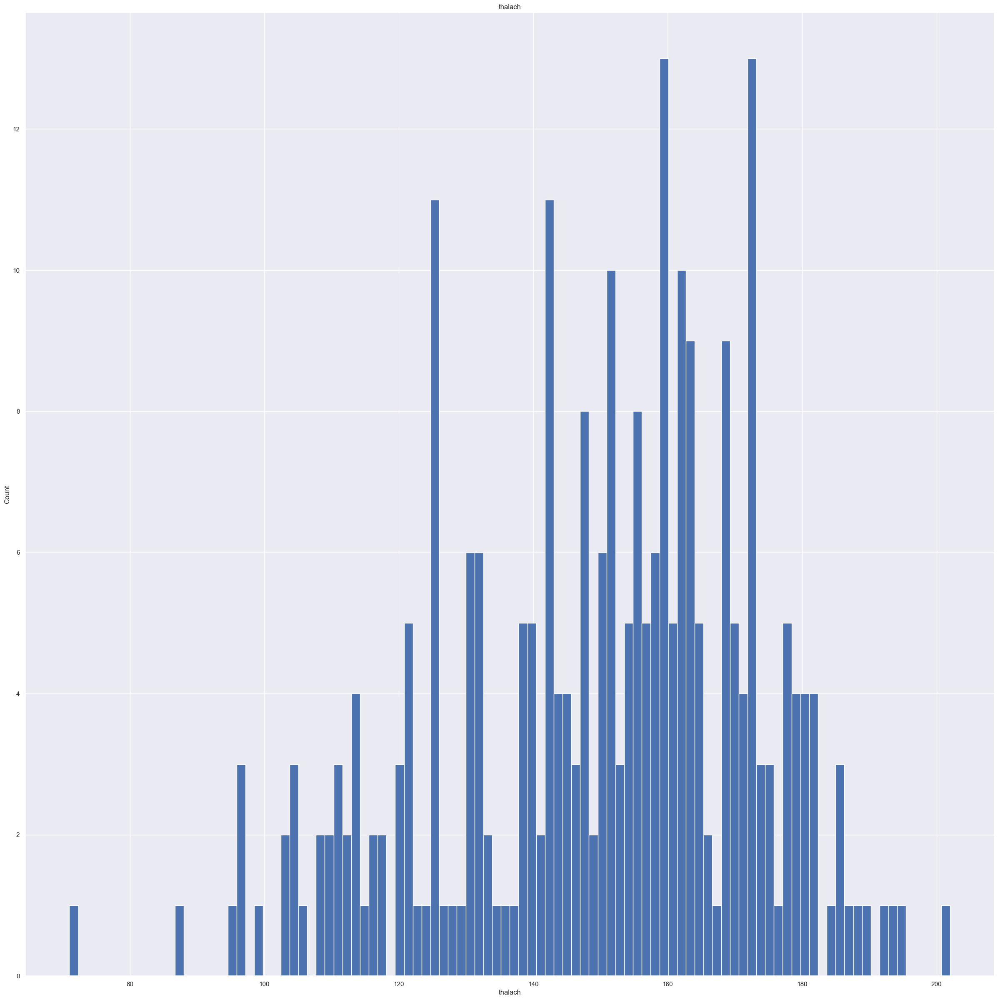

<Figure size 10x10 with 0 Axes>

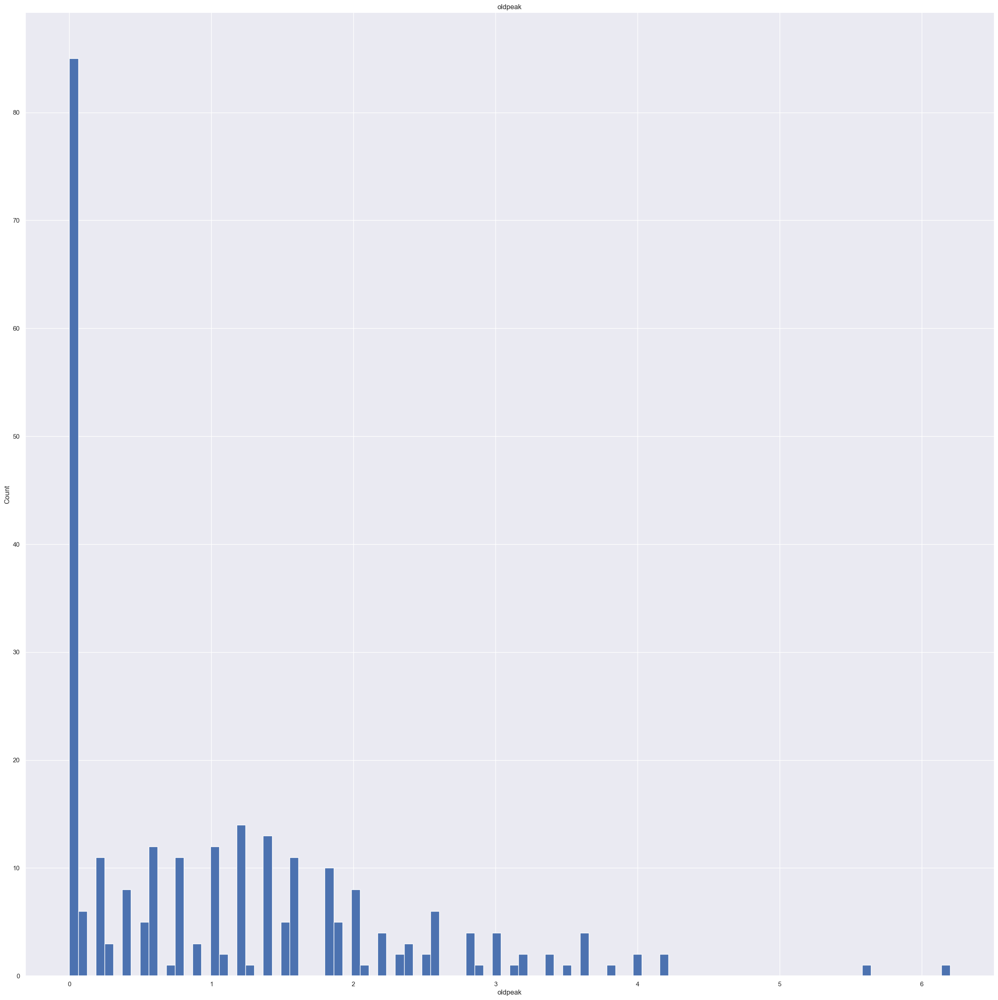

<Figure size 10x10 with 0 Axes>

In [25]:
## Lets analyse the continuous values by creating histograms to understand the distribution
for feature in continuous_feature:
    data=dataset.copy()
    data[feature].hist(bins=100)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.figure(figsize=(0.1,0.1))
    plt.show()

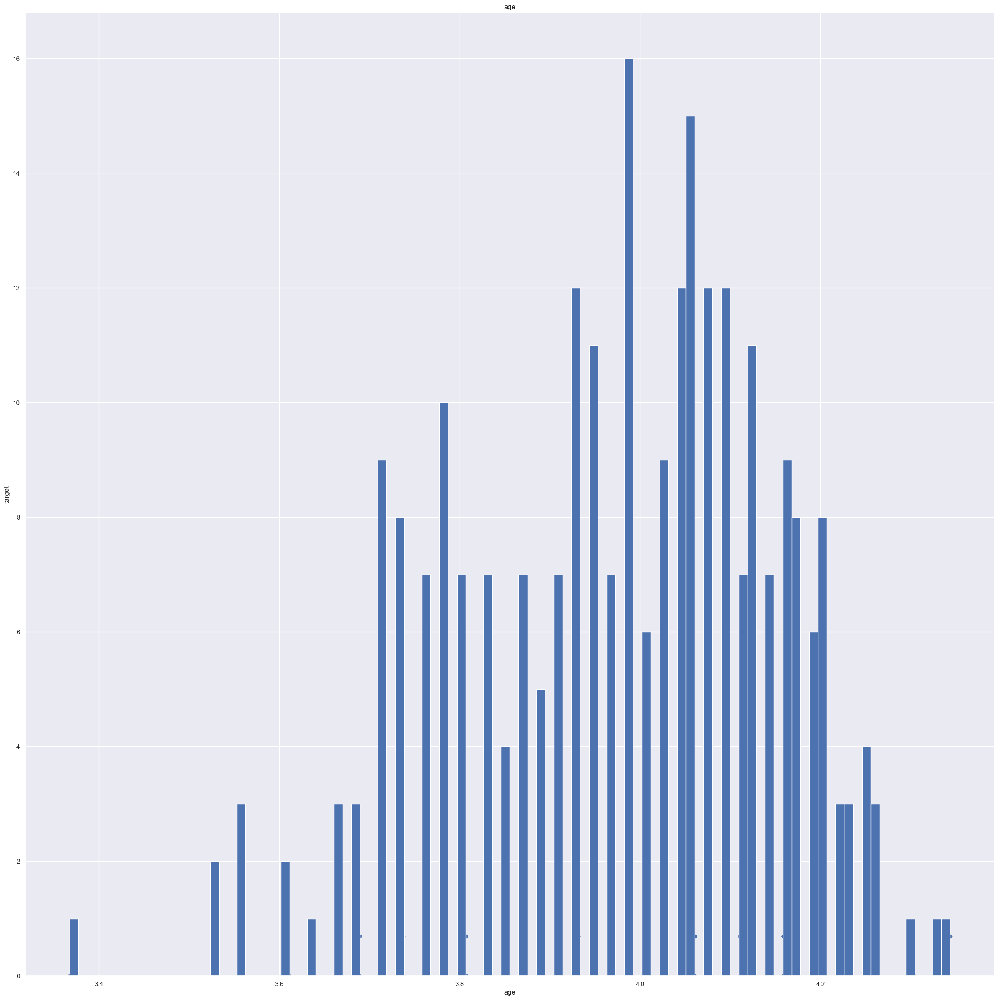

<Figure size 100x100 with 0 Axes>

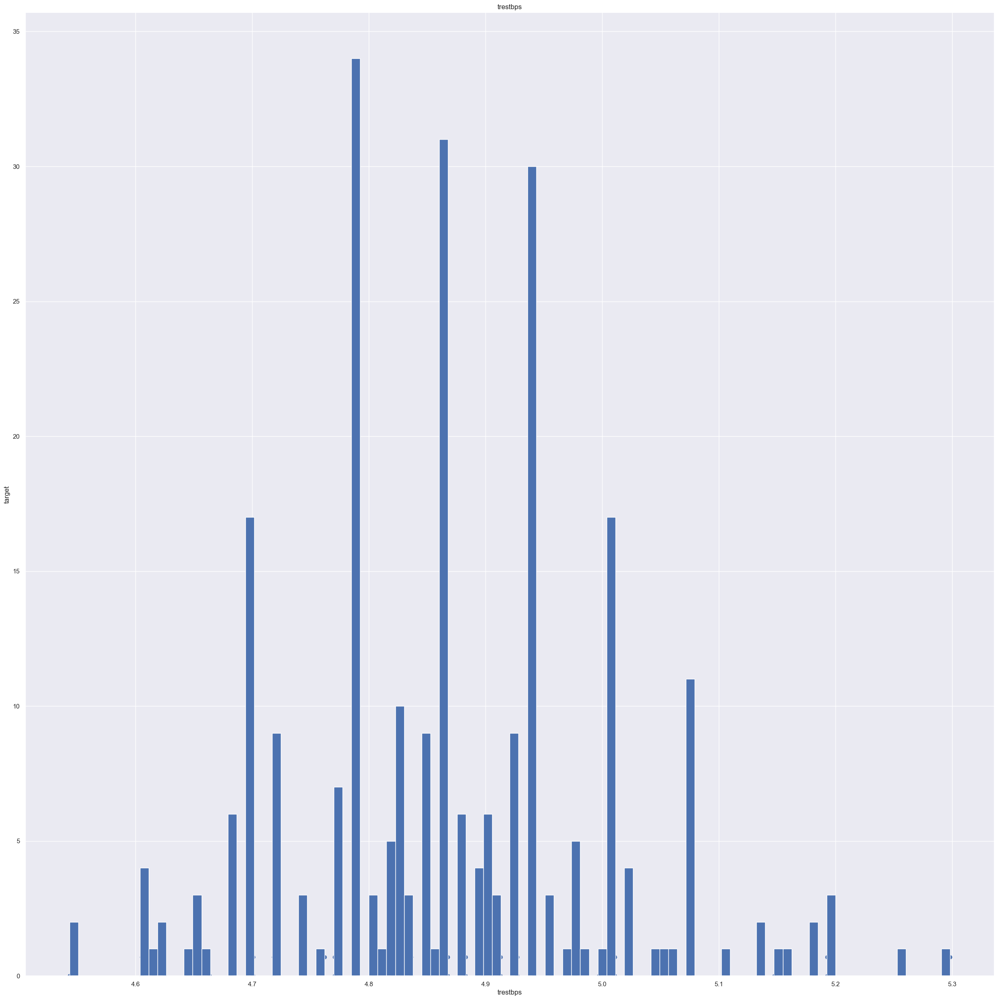

<Figure size 100x100 with 0 Axes>

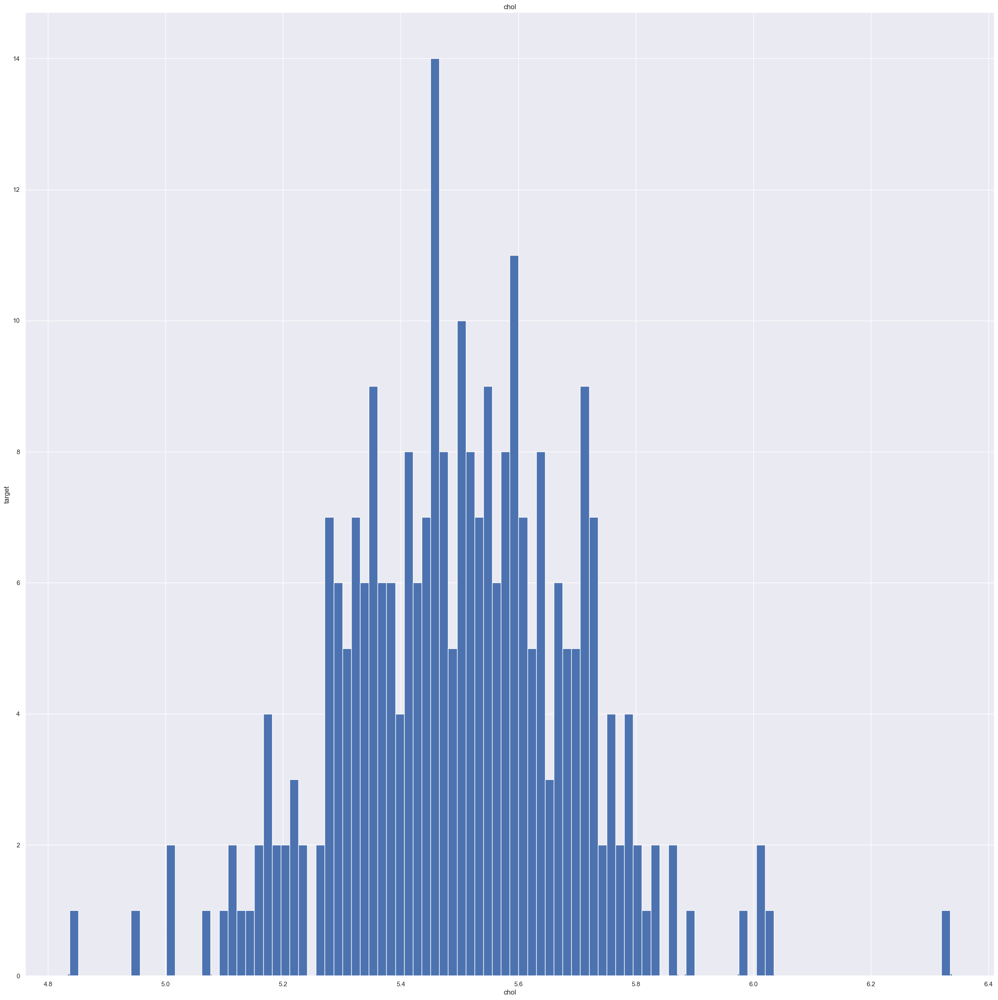

<Figure size 100x100 with 0 Axes>

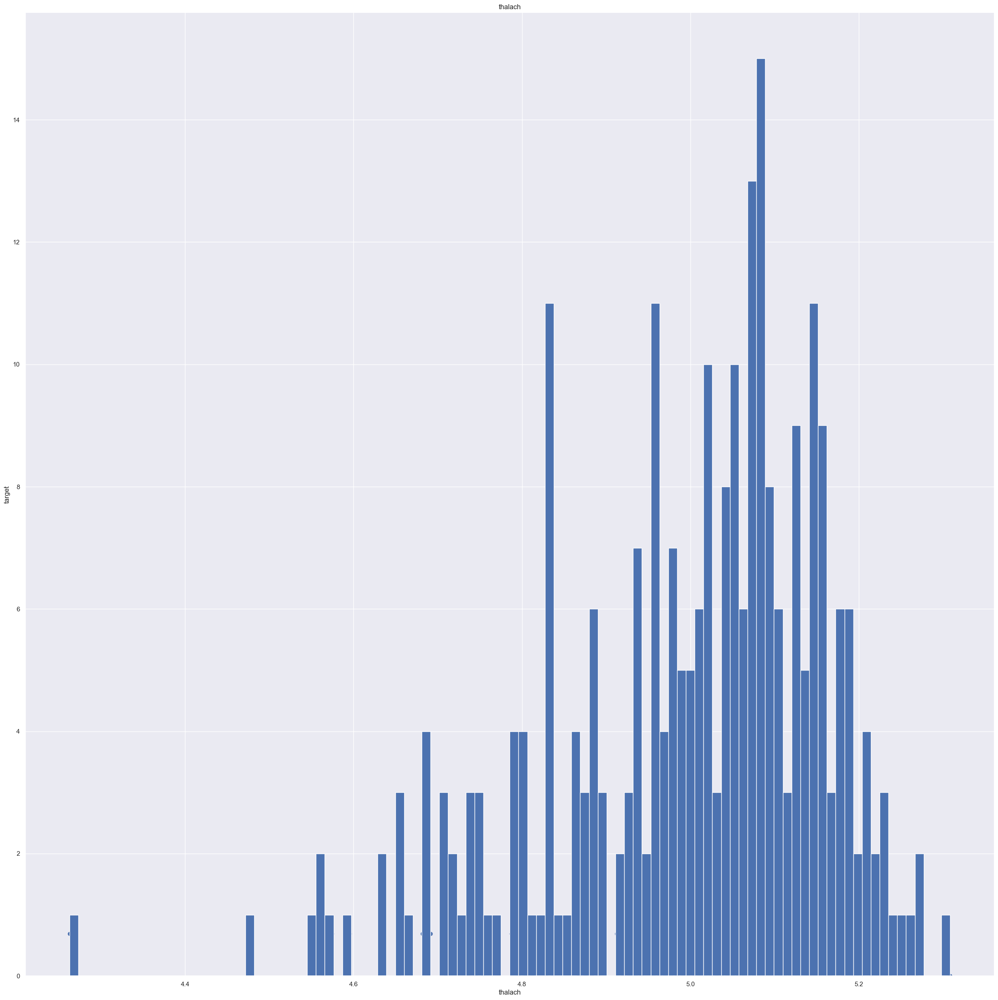

<Figure size 100x100 with 0 Axes>

In [26]:
## We will be using logarithmic transformation

for feature in continuous_feature:
    data=dataset.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data['target']=np.log(data['target'])
        plt.scatter(data[feature],data['target'])
        plt.xlabel(feature)
        data[feature].hist(bins=100)
        plt.ylabel('target')
        plt.title(feature)
        plt.figure(figsize=(1,1))
        plt.show()

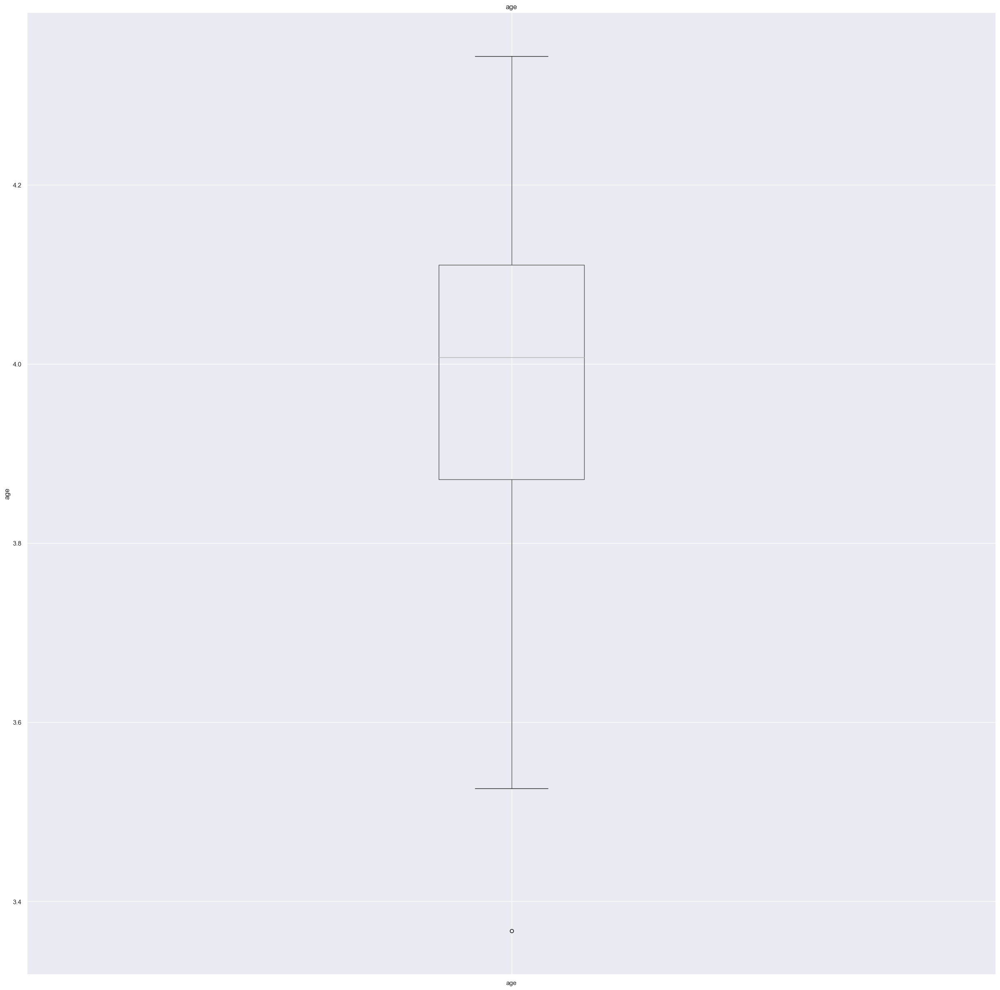

<Figure size 10x10 with 0 Axes>

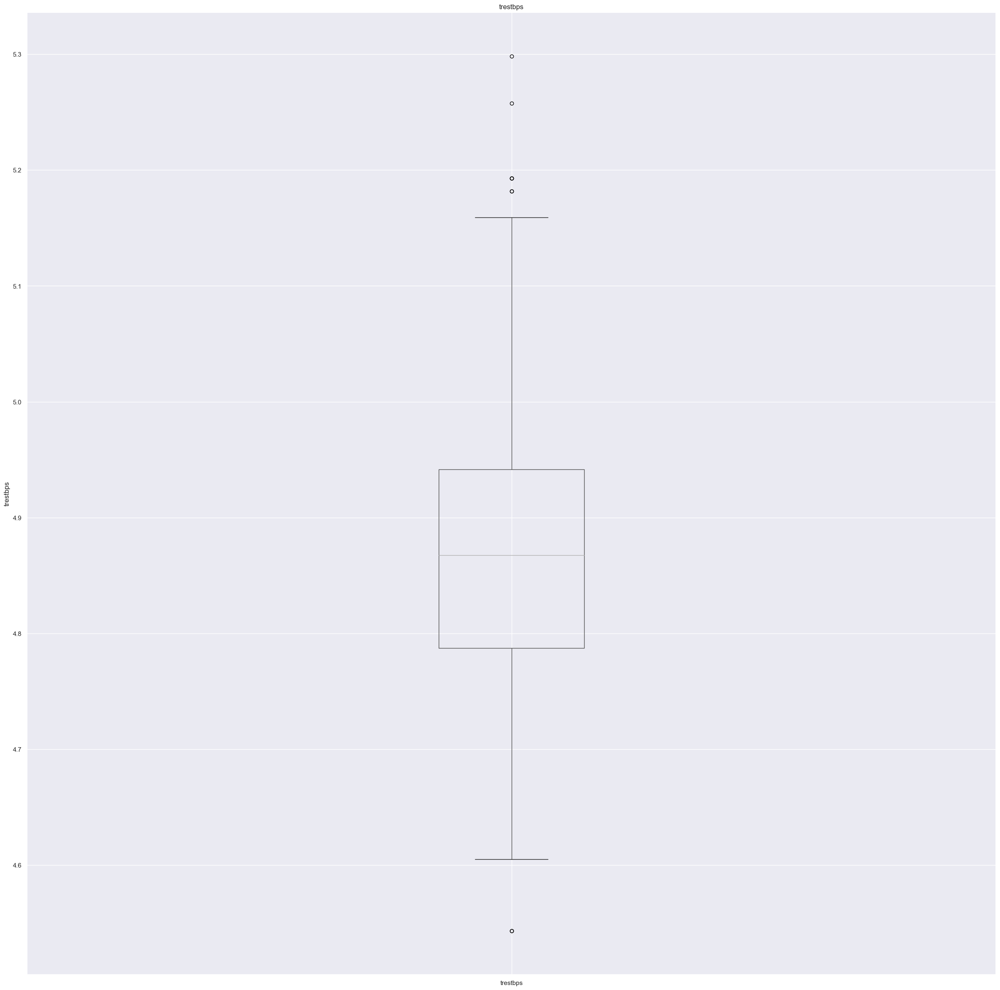

<Figure size 10x10 with 0 Axes>

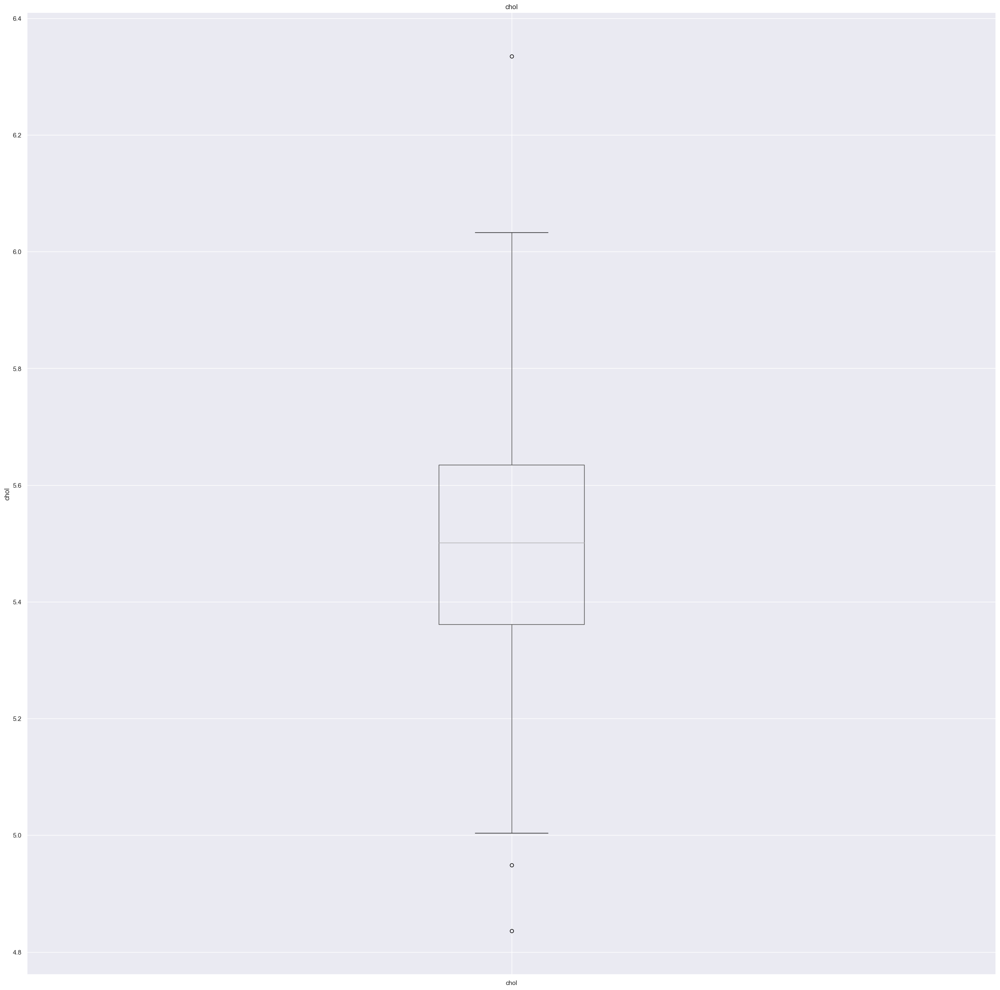

<Figure size 10x10 with 0 Axes>

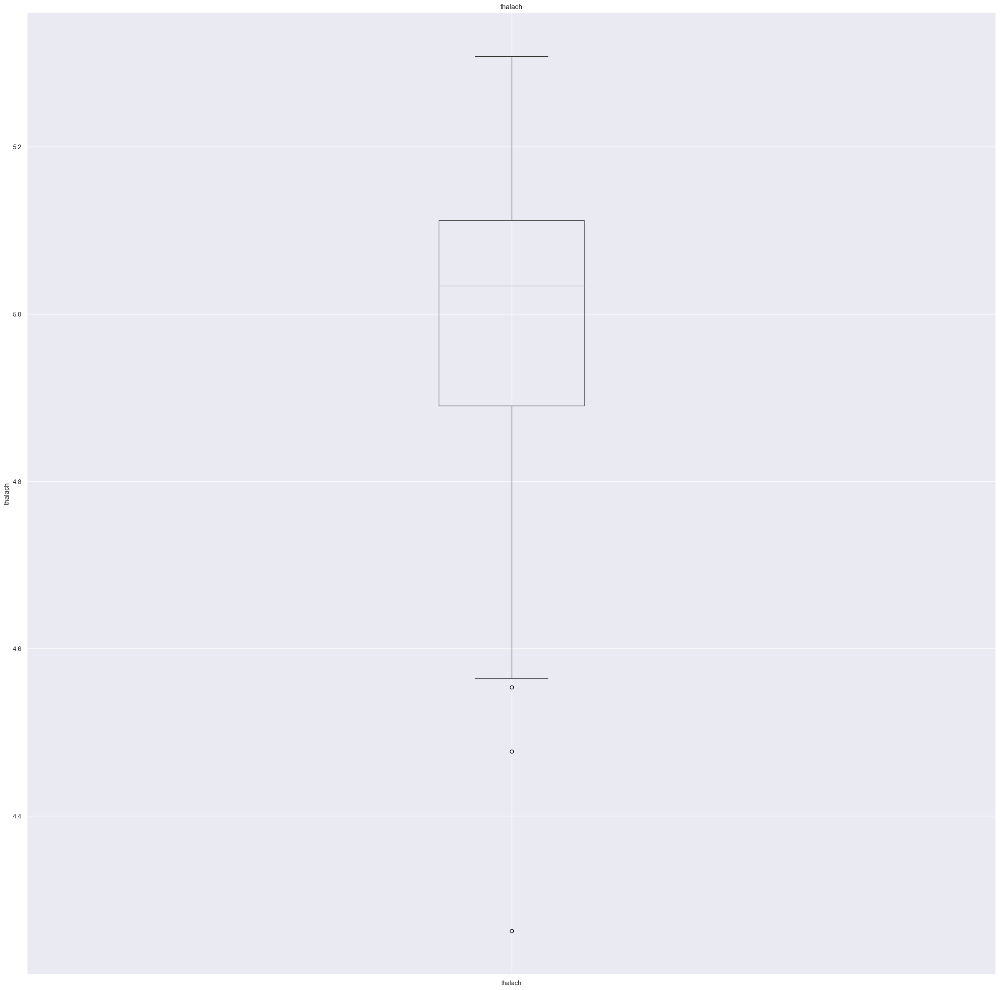

<Figure size 10x10 with 0 Axes>

In [27]:
#outline

for feature in continuous_feature:
    data=dataset.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.figure(figsize=(0.1,0.1))
        plt.show()

In [28]:
# Categorical Variables
categorical_features=[feature for feature in dataset.columns if data[feature].dtypes=='O']
categorical_features

[]

it has no categorical features

# DATA SPLITTING

In [29]:
from sklearn.model_selection import train_test_split, GridSearchCV
X = dataset.drop('target', axis = 1)
y = dataset['target']

xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.25, stratify = y, random_state = 0)

# Data balancing

# 1.Smote Technique

In [30]:
smt = SMOTE(random_state = 0)
xtrain_res, ytrain_res = smt.fit_resample(xtrain, ytrain)

print(f'Distribution BEFORE balancing:\n{ytrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{ytrain_res.value_counts()}')

Distribution BEFORE balancing:
1    112
2     90
Name: target, dtype: int64

Distribution AFTER balancing:
1    112
2    112
Name: target, dtype: int64


# 2.Random oversampling

In [31]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state = 42)
  
X_res, y_res = ros.fit_resample(xtrain, ytrain)
   
X_res = pd.DataFrame(X_res)
Y_res = pd.DataFrame(y_res)
   
   
print(f'Distribution BEFORE balancing:\n{ytrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{Y_res.value_counts()}')
print(f'Distribution BEFORE balancing:\n{xtrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{X_res.value_counts()}')

Distribution BEFORE balancing:
1    112
2     90
Name: target, dtype: int64

Distribution AFTER balancing:
target
1         112
2         112
dtype: int64
Distribution BEFORE balancing:
age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  ca  thal
34   0    2   118       210   0    0        192      0      0.7      1      0   3       1
59   1    4   140       177   0    0        162      1      0.0      1      1   7       1
58   1    4   100       234   0    0        156      0      0.1      1      1   7       1
              125       300   0    2        171      0      0.0      1      2   7       1
              128       259   0    2        130      1      3.0      2      2   7       1
                                                                                       ..
51   1    3   100       222   0    0        143      1      1.2      2      0   3       1
              110       175   0    0        123      0      0.6      1      0   3       1
         

In [32]:
continuous_feature

['age', 'trestbps', 'chol', 'thalach', 'oldpeak']

# FEATURE SCALING

In [33]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
mms = MinMaxScaler() # Normalization
ss = StandardScaler() # Standardization

dataset['oldpeak'] = mms.fit_transform(dataset[['oldpeak']])
dataset['oldpeak'] = ss.fit_transform(dataset[['oldpeak']])
dataset['age'] = ss.fit_transform(dataset[['age']])
dataset['age'] = mms.fit_transform(dataset[['age']])
dataset['trestbps'] = ss.fit_transform(dataset[['trestbps']])
dataset['trestbps'] = mms.fit_transform(dataset[['trestbps']])
dataset['chol'] = ss.fit_transform(dataset[['chol']])
dataset['chol'] = mms.fit_transform(dataset[['chol']])
dataset['thalach'] = ss.fit_transform(dataset[['thalach']])
dataset['thalach'] = mms.fit_transform(dataset[['thalach']])
dataset['cp'] = ss.fit_transform(dataset[['cp']])
dataset['cp'] = mms.fit_transform(dataset[['cp']])
dataset['restecg'] = ss.fit_transform(dataset[['restecg']])
dataset['restecg'] = mms.fit_transform(dataset[['restecg']])
dataset['ca'] = ss.fit_transform(dataset[['ca']])
dataset['ca'] = mms.fit_transform(dataset[['ca']])
dataset['thal'] = ss.fit_transform(dataset[['thal']])
dataset['thal'] = mms.fit_transform(dataset[['thal']])
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,0.854167,1,1.000000,0.339623,0.447489,0,1.0,0.290076,0,1.181012,2,1.000000,0.0,2
1,0.791667,0,0.666667,0.198113,1.000000,0,1.0,0.679389,0,0.481153,2,0.000000,1.0,1
2,0.583333,1,0.333333,0.283019,0.308219,0,0.0,0.534351,0,-0.656118,1,0.000000,1.0,2
3,0.729167,1,1.000000,0.320755,0.312785,0,0.0,0.259542,1,-0.743600,2,0.333333,1.0,1
4,0.937500,0,0.333333,0.245283,0.326484,0,1.0,0.381679,1,-0.743600,1,0.333333,0.0,1


In [34]:
scaling_feature=[feature for feature in dataset.columns if feature not in ['target']]
len(scaling_feature)

13

In [35]:
mask = ~np.isfinite(dataset)

# count the number of infinite or NaN values in each column
column_sum = mask.sum(axis=0)

# print the column(s) with infinite or NaN values and the number of occurrences
print(column_sum[column_sum > 0]) 

Series([], dtype: int64)


# VARIANCE THRESHOLD

In [36]:
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0)
var_thres.fit(xtrain)

VarianceThreshold(threshold=0)

In [37]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [38]:
sum(var_thres.get_support())

13

# PEARSONS COEFFICIENT

In [39]:
# feature selection using pearsons coefficient
xtrain.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
age,1.000000,-0.143725,0.092859,0.252568,0.228594,0.123441,0.154320,-0.370681,0.049557,0.208187,0.133000,0.399284,0.110943
sex,-0.143725,1.000000,0.068144,-0.082625,-0.190808,0.087240,0.010567,-0.050432,0.205970,0.042793,0.014332,0.054138,0.394136
cp,0.092859,0.068144,1.000000,-0.062529,0.061687,-0.062914,0.114362,-0.327709,0.369210,0.222725,0.181143,0.258460,0.281525
trestbps,0.252568,-0.082625,-0.062529,1.000000,0.165175,0.146888,0.152146,-0.008200,0.076681,0.206872,0.123525,0.058766,0.158027
chol,0.228594,-0.190808,0.061687,0.165175,1.000000,0.010077,0.158256,-0.028468,0.043811,0.070527,-0.009441,0.124913,0.036542
fbs,0.123441,0.087240,-0.062914,0.146888,0.010077,1.000000,0.055962,0.037975,-0.028104,-0.024588,0.071737,0.162330,0.055651
restecg,0.154320,0.010567,0.114362,0.152146,0.158256,0.055962,1.000000,-0.125015,0.126805,0.170892,0.217175,0.101670,0.017867
thalach,-0.370681,-0.050432,-0.327709,-0.008200,-0.028468,0.037975,-0.125015,1.000000,-0.383659,-0.390312,-0.400313,-0.245980,-0.251029
exang,0.049557,0.205970,0.369210,0.076681,0.043811,-0.028104,0.126805,-0.383659,1.000000,0.299076,0.268119,0.092880,0.355681
oldpeak,0.208187,0.042793,0.222725,0.206872,0.070527,-0.024588,0.170892,-0.390312,0.299076,1.000000,0.602221,0.343633,0.347170


In [40]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [41]:
corr_features = correlation(xtrain, 0.7)
len(set(corr_features))
corr_features

set()

# MUTUAL INFORMATION FEATURE SELECTION

In [42]:
from sklearn.feature_selection import mutual_info_classif

In [43]:
mutual_info=mutual_info_classif(X,y)

In [44]:
mutual_data=pd.Series(mutual_info,index=X.columns)
mutual_data.sort_values(ascending=False)

thal        0.158780
cp          0.096667
ca          0.073630
oldpeak     0.071154
chol        0.069146
exang       0.066082
thalach     0.064749
slope       0.058466
age         0.028827
sex         0.024805
restecg     0.002161
trestbps    0.000000
fbs         0.000000
dtype: float64

<Figure size 1000x1000 with 0 Axes>

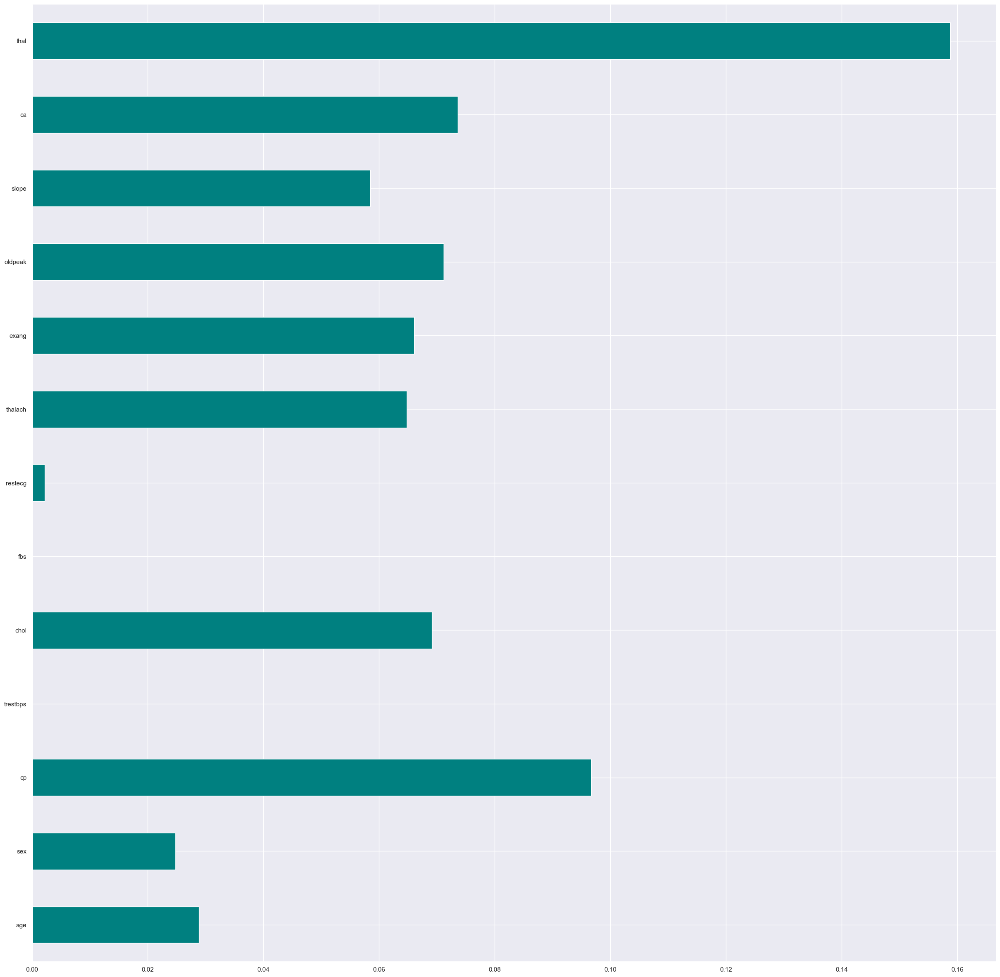

<Figure size 1000x1000 with 0 Axes>

In [45]:
from matplotlib.pyplot import figure
mutual_data.plot(kind='barh',color='teal')
figure(figsize=(10, 10) )

In [46]:
pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


# FORWARD FEATURE SELECTION

In [45]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import ExtraTreesClassifier

In [46]:
forward_feature_selection= SequentialFeatureSelector(ExtraTreesClassifier(n_jobs=-1), k_features=(1,7), forward=True,floating=False, verbose=2,scoring='accuracy',cv=5).fit(xtrain,ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  13 out of  13 | elapsed:   20.7s finished

[2023-07-11 07:41:34] Features: 1/7 -- score: 0.7823170731707316[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:   16.9s finished

[2023-07-11 07:41:51] Features: 2/7 -- score: 0.796951219512195[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:   15.6s finished

[2023-07-11 07:42:06] Features: 3/7 -- score: 0.8215853658536586[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 o

In [47]:
forward_feature_selection.k_feature_names_

('sex', 'cp', 'oldpeak', 'ca', 'thal')

In [48]:
forward_feature_selection.k_score_

0.8564634146341463

In [49]:
pd.DataFrame.from_dict(forward_feature_selection.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(12,)","[0.7073170731707317, 0.8292682926829268, 0.775...",0.782317,"(thal,)",0.097052,0.075509,0.037755
2,"(11, 12)","[0.7560975609756098, 0.8536585365853658, 0.775...",0.796951,"(ca, thal)",0.091581,0.071253,0.035627
3,"(2, 11, 12)","[0.8048780487804879, 0.8780487804878049, 0.85,...",0.821585,"(cp, ca, thal)",0.069002,0.053686,0.026843
4,"(1, 2, 11, 12)","[0.8048780487804879, 0.8780487804878049, 0.85,...",0.841585,"(sex, cp, ca, thal)",0.059162,0.04603,0.023015
5,"(1, 2, 9, 11, 12)","[0.7804878048780488, 0.926829268292683, 0.875,...",0.856463,"(sex, cp, oldpeak, ca, thal)",0.073049,0.056835,0.028417
6,"(1, 2, 6, 9, 11, 12)","[0.8048780487804879, 0.8780487804878049, 0.875...",0.846585,"(sex, cp, restecg, oldpeak, ca, thal)",0.046393,0.036096,0.018048
7,"(1, 2, 5, 6, 9, 11, 12)","[0.7560975609756098, 0.9024390243902439, 0.85,...",0.836707,"(sex, cp, fbs, restecg, oldpeak, ca, thal)",0.078831,0.061334,0.030667


In [47]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve

# Model creation without feature selection

In [48]:
def model(classifier):
    
    classifier.fit(xtrain,ytrain)
    prediction = classifier.predict(xtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(ytest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,xtrain,ytrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(ytest,prediction)))
    print("Error Rate: ",'{0:.2%}'.format(1-accuracy_score(ytest,prediction)))
    plot_roc_curve(classifier, xtest,ytest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(ytest,classifier.predict(xtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(ytest,classifier.predict(xtest)))



# 1. Logistic regression

In [49]:
from sklearn.linear_model import LogisticRegression
from scipy.stats import loguniform
from sklearn.linear_model import Ridge
from sklearn.model_selection import RepeatedKFold
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

In [53]:
# normal logistic regression
classifier_lr = LogisticRegression(random_state = 0,C=10,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [54]:
# Classification for GridSearchCV
classifier=LogisticRegression()

In [55]:
from sklearn.model_selection import GridSearchCV
parameter={'penalty':['l1','l2','elasticnet'],'C':[1,2,3,4,5,6,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [56]:
classifier_regressor=GridSearchCV(classifier_lr,param_grid=parameter,scoring='accuracy',cv=cv)

In [57]:
classifier_regressor.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=10, class_weight='balanced',
                                          random_state=0, solver='newton-cg'),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [67]:
print(classifier_regressor.best_params_)

{'C': 2, 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs'}


In [68]:
print(classifier_regressor.best_score_)

0.8551587301587301


In [69]:
##prediction
y_pred=classifier_regressor.predict(xtest)

In [70]:
## accuracy score
from sklearn.metrics import accuracy_score,classification_report

In [71]:
score=accuracy_score(y_pred,ytest)
print(score)

0.7941176470588235


In [72]:
# imbalanced and via grid search
print(classification_report(y_pred,ytest))

              precision    recall  f1-score   support

           1       0.82      0.82      0.82        38
           2       0.77      0.77      0.77        30

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.79      0.79      0.79        68



Accuracy :  80.88%
Cross Validation Score :  91.39%
ROC_AUC Score :  80.09%
Error Rate:  19.12%


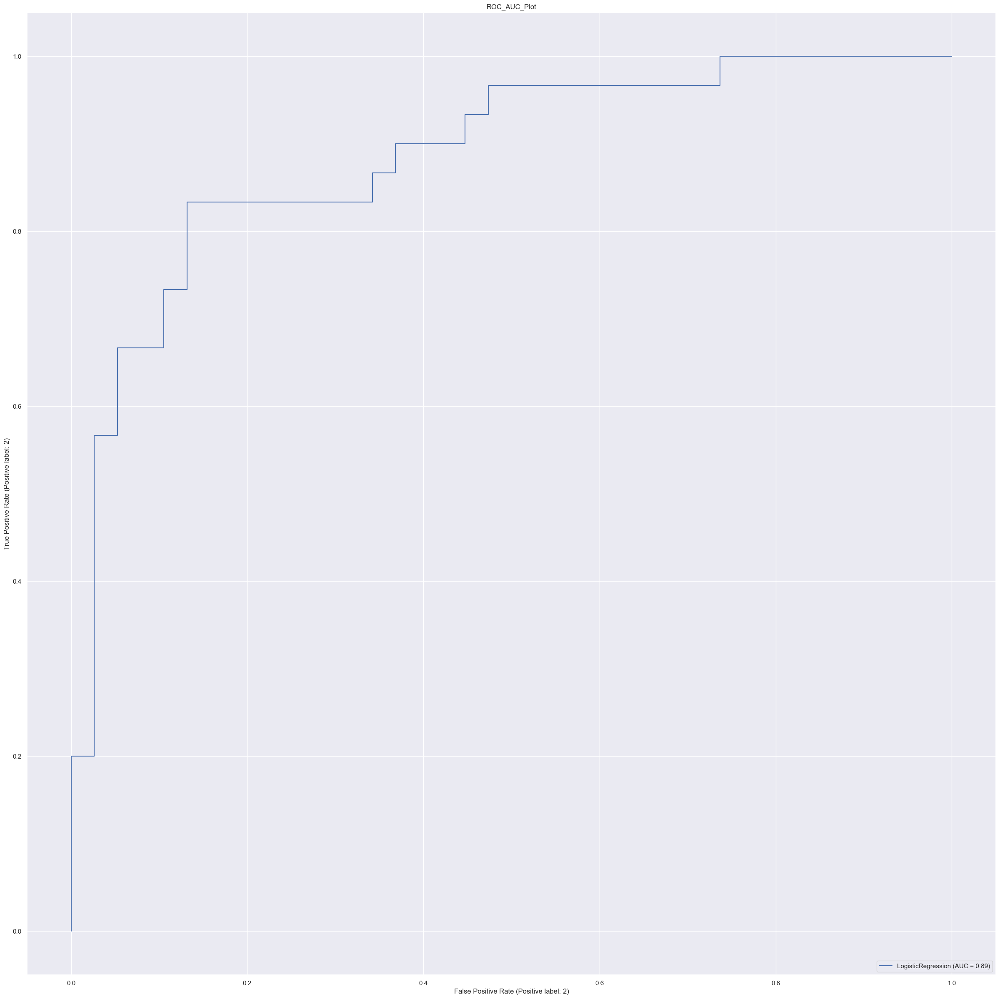

In [131]:
#not balanced and without grid search hyperparameters
model(classifier)

Accuracy :  82.35%
Cross Validation Score :  90.81%
ROC_AUC Score :  81.75%
Error Rate:  17.65%


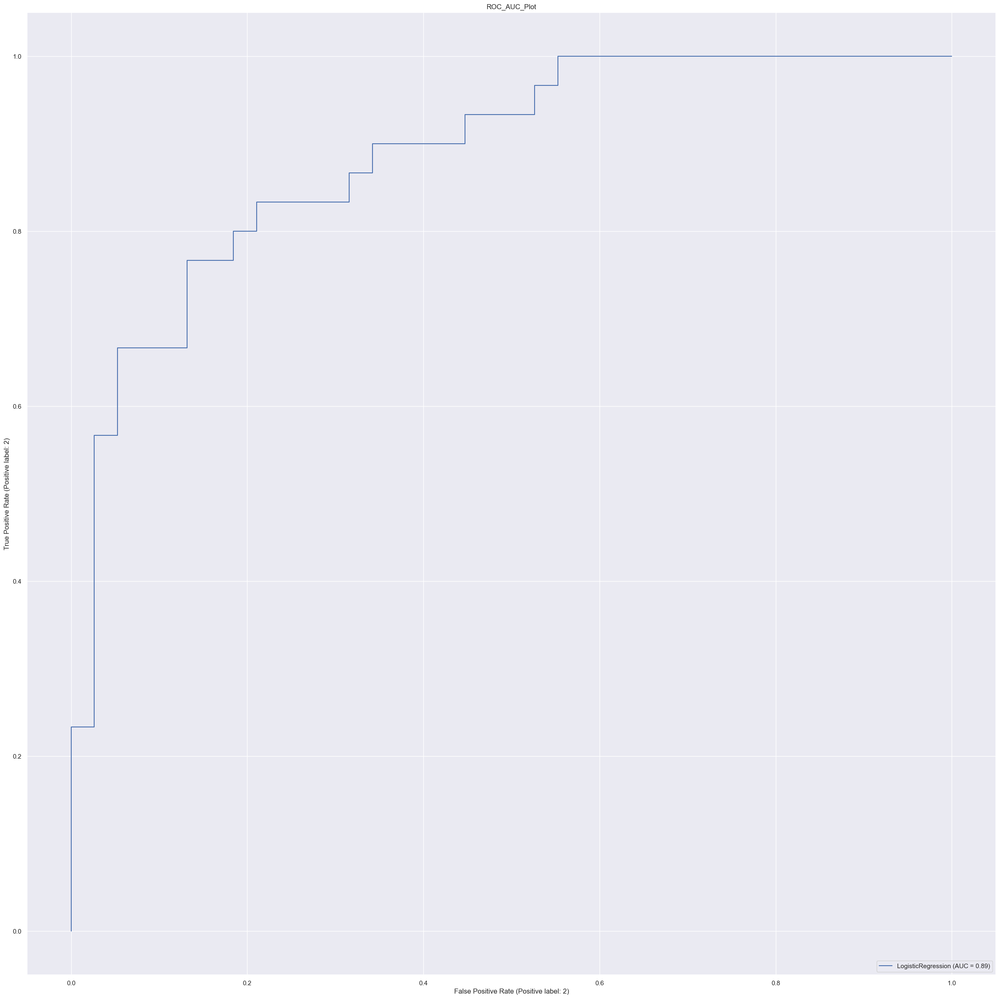

In [132]:
# balanced but without GridSearchCV hyperparameters
model(classifier_lr)

              precision    recall  f1-score   support

           1       0.82      0.87      0.85        38
           2       0.82      0.77      0.79        30

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68



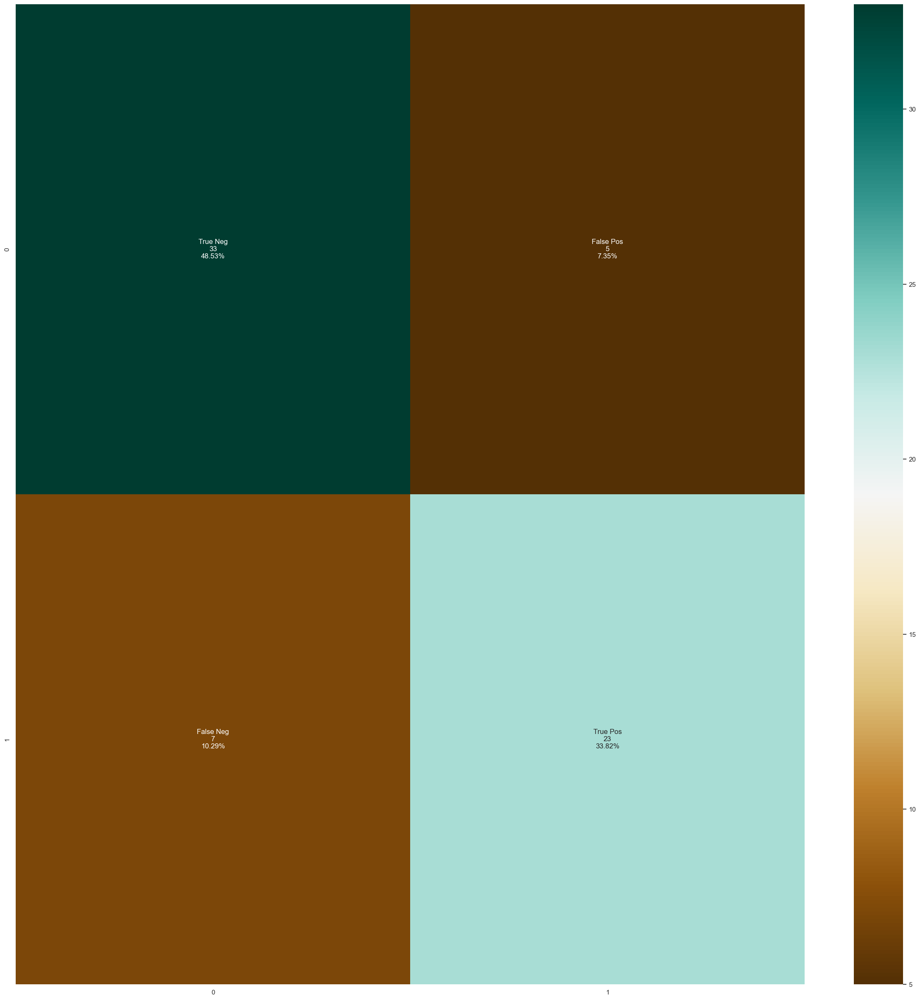

In [133]:
#Report generated after classifier without gridsearchcv 
model_evaluation(classifier_lr)

# 2.Decision Tree Classifier

In [50]:
from sklearn.tree import DecisionTreeClassifier

In [162]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1,max_depth = 10,min_samples_leaf = 1, class_weight='balanced')

In [164]:
classifier1=DecisionTreeClassifier(random_state = 1,max_depth = 10,min_samples_leaf = 1)

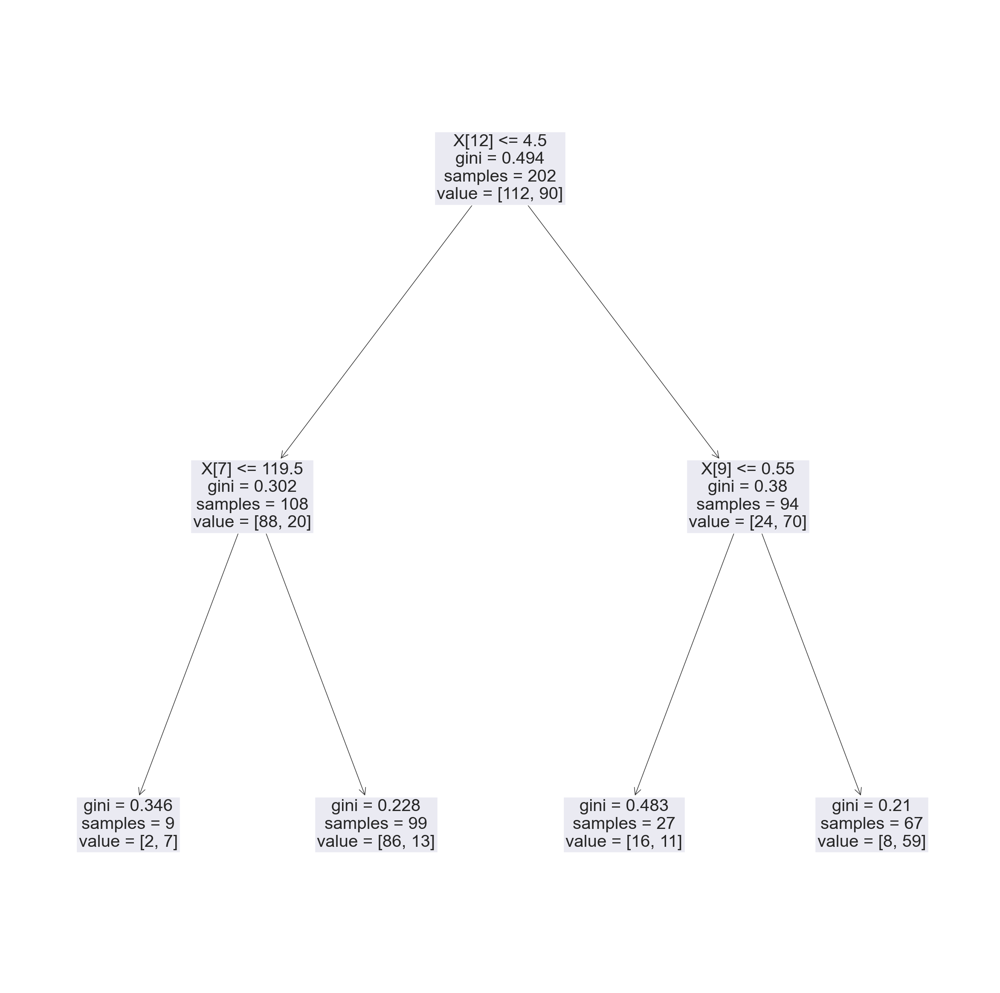

<Figure size 10000x10000 with 0 Axes>

<Figure size 10000x10000 with 0 Axes>

In [165]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(xtrain,ytrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=29)
plt.show()
plt.figure(figsize=(100,100))

In [166]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [167]:
classifier_decisiontree=GridSearchCV(classifier1,param_grid=parameter1,scoring='accuracy',cv=cv)

In [168]:
classifier_decisiontree.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(max_depth=10, random_state=1),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [169]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 4, 'max_features': 'auto', 'splitter': 'random'}


In [170]:
print(classifier_decisiontree.best_score_)

0.8175396825396825


In [171]:
##prediction
y_pred1=classifier_decisiontree.predict(xtest)

In [172]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8529411764705882
error rate is 0.1470588235294118


In [173]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           1       0.95      0.82      0.88        44
           2       0.73      0.92      0.81        24

    accuracy                           0.85        68
   macro avg       0.84      0.87      0.85        68
weighted avg       0.87      0.85      0.86        68



Accuracy :  75.00%
Cross Validation Score :  75.71%
ROC_AUC Score :  74.47%
Error Rate:  25.00%


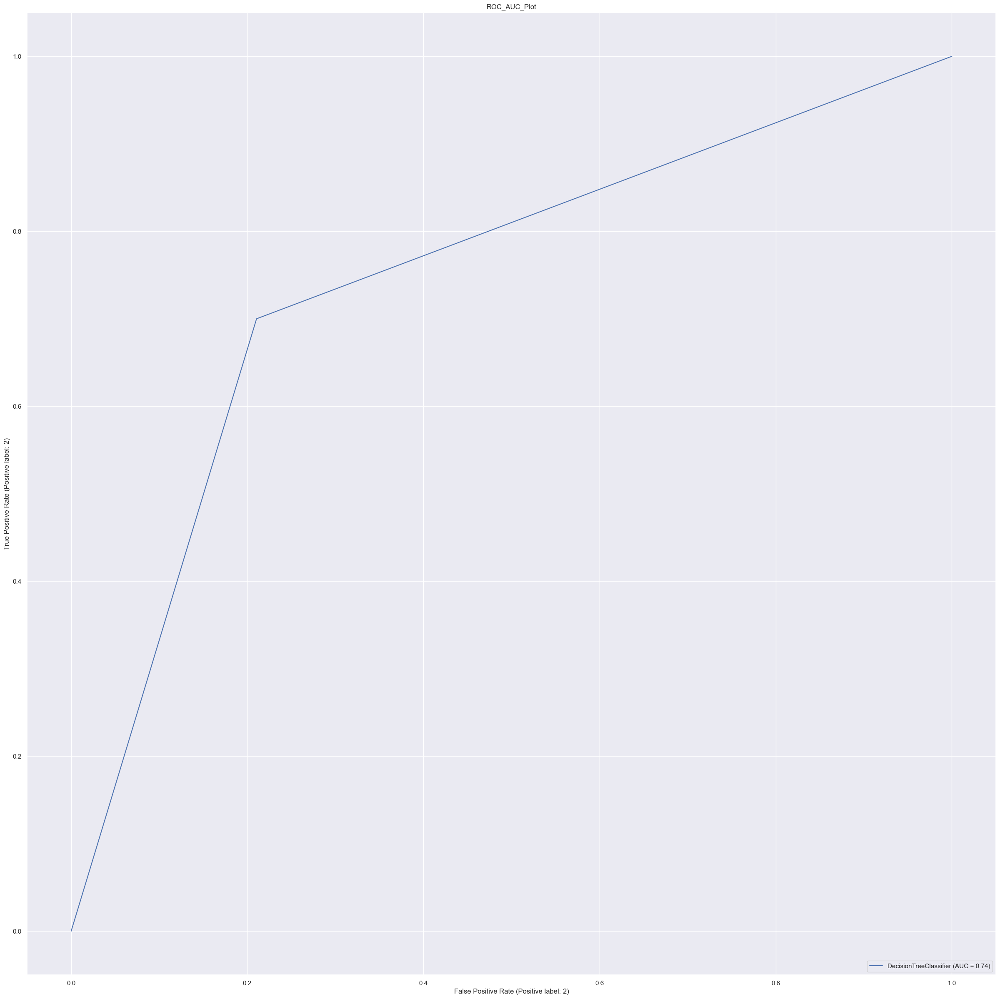

In [174]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  70.59%
Cross Validation Score :  75.60%
ROC_AUC Score :  69.12%
Error Rate:  29.41%


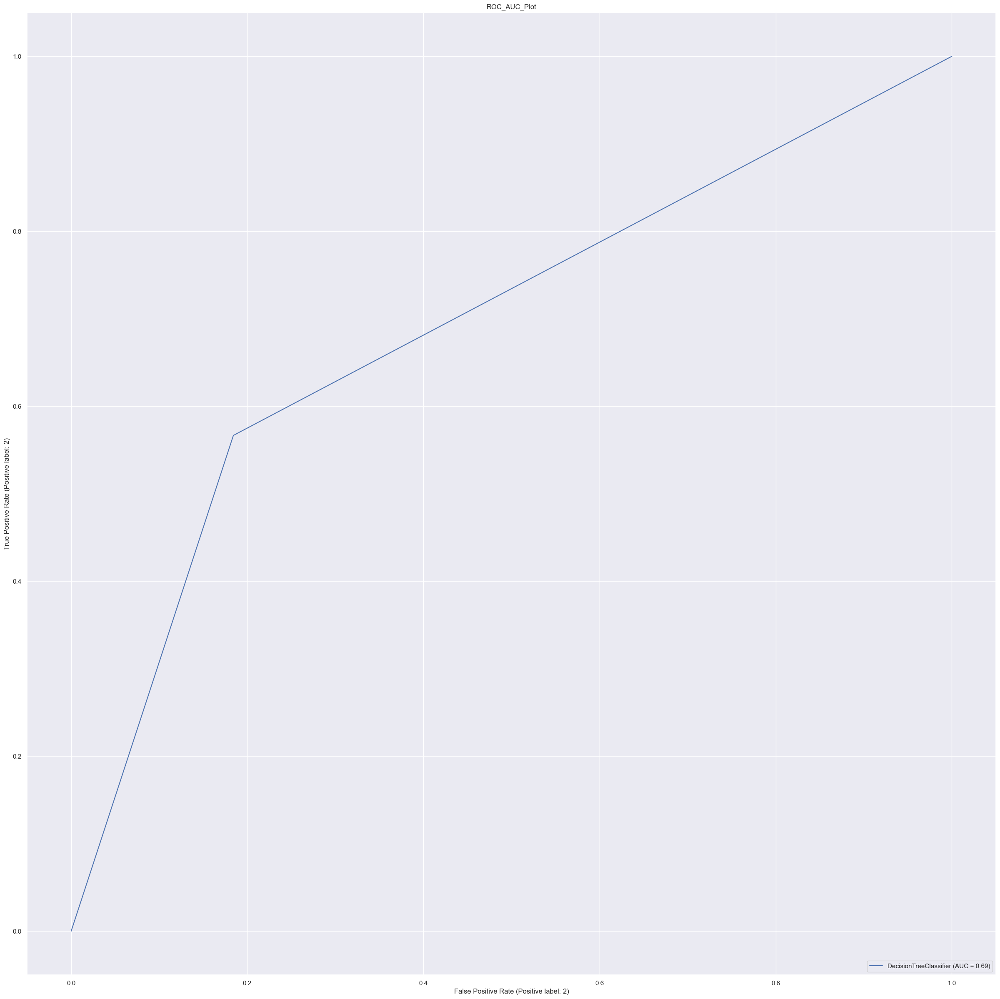

In [177]:
#not balanced and without grid search hyperparameters
model(classifier1)

              precision    recall  f1-score   support

           1       0.82      0.95      0.88        38
           2       0.92      0.73      0.81        30

    accuracy                           0.85        68
   macro avg       0.87      0.84      0.85        68
weighted avg       0.86      0.85      0.85        68



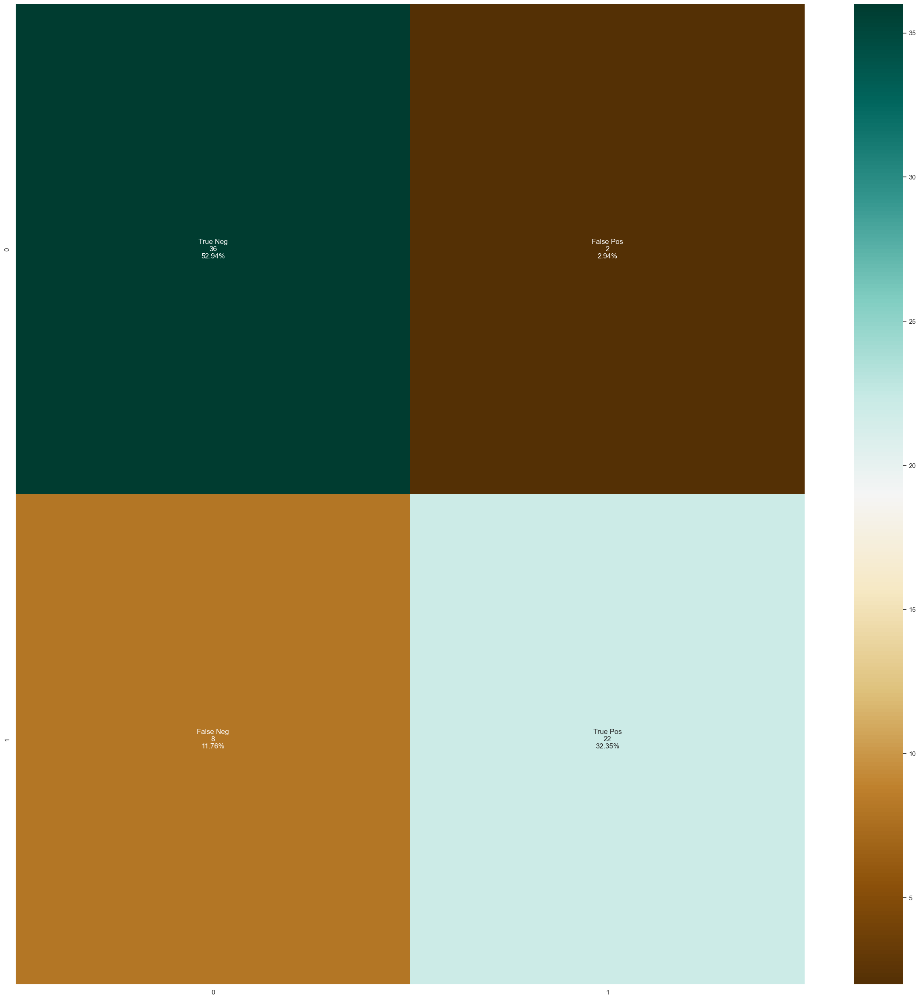

In [178]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

              precision    recall  f1-score   support

           1       0.70      0.82      0.76        38
           2       0.71      0.57      0.63        30

    accuracy                           0.71        68
   macro avg       0.71      0.69      0.69        68
weighted avg       0.71      0.71      0.70        68



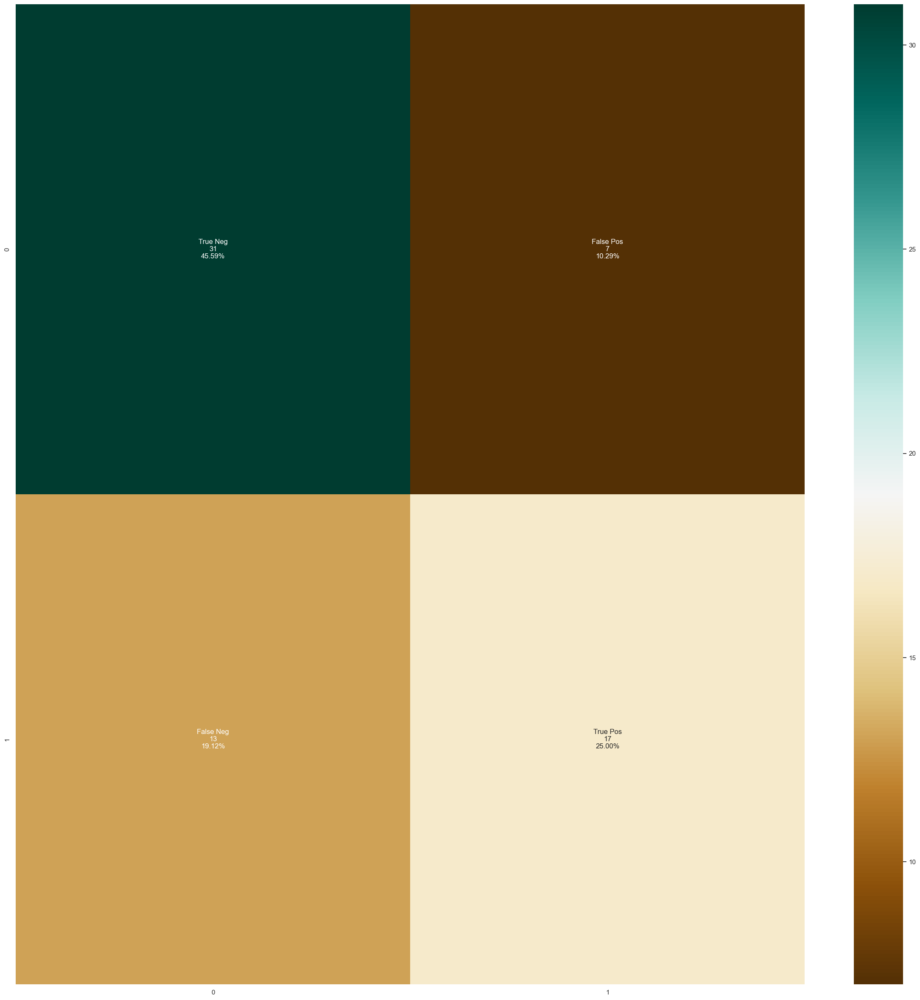

In [179]:
# not balanced and without grid searchtree 
model_evaluation(classifier1)

              precision    recall  f1-score   support

           1       0.77      0.79      0.78        38
           2       0.72      0.70      0.71        30

    accuracy                           0.75        68
   macro avg       0.75      0.74      0.75        68
weighted avg       0.75      0.75      0.75        68



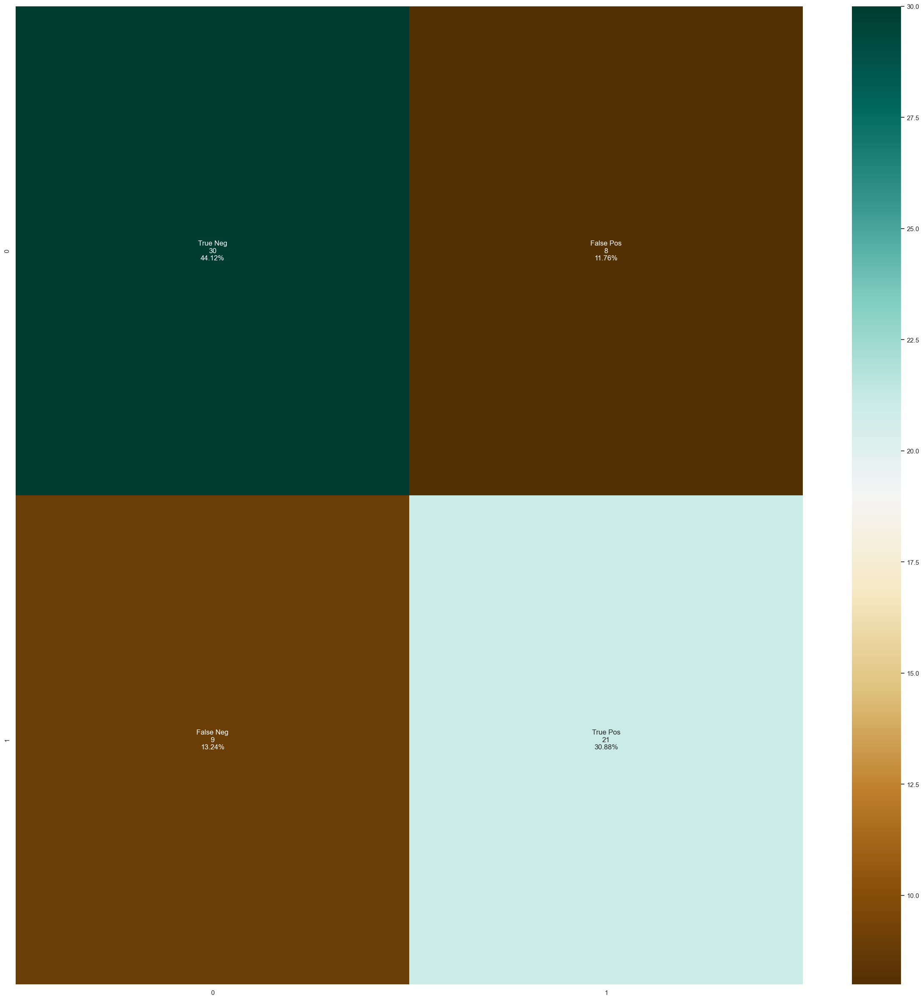

In [180]:
# balanced but not gridsearch applied
model_evaluation(classifier_dtbalanced)

# 3.Support Vector Classifier

In [51]:
from sklearn.svm import SVC

In [52]:
classifier_svc = SVC(kernel = 'linear',C = 100,gamma=100,degree=100)

In [53]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 100,class_weight='balanced')

In [54]:
parameter2 ={'C':[1, 10, 100],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [55]:
classifier_supervector=GridSearchCV(classifier_svc,param_grid=parameter2,scoring='accuracy',cv=cv)

In [56]:
classifier_supervector.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=100, degree=100, gamma=100, kernel='linear'),
             param_grid={'C': [1, 10, 100], 'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [57]:
print(classifier_supervector.best_params_)

{'C': 10, 'gamma': 0.001, 'kernel': 'linear'}


In [58]:
##prediction
y_pred2=classifier_supervector.predict(xtest)

In [59]:
print(classifier_supervector.best_score_)

0.8519047619047618


In [60]:
score=accuracy_score(y_pred2,ytest)
error=1-accuracy_score(y_pred2,ytest)
print(score)
print(error)

0.7794117647058824
0.22058823529411764


In [61]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           1       0.87      0.77      0.81        43
           2       0.67      0.80      0.73        25

    accuracy                           0.78        68
   macro avg       0.77      0.78      0.77        68
weighted avg       0.79      0.78      0.78        68



Accuracy :  80.88%
Cross Validation Score :  91.21%
ROC_AUC Score :  80.09%
Error Rate:  19.12%


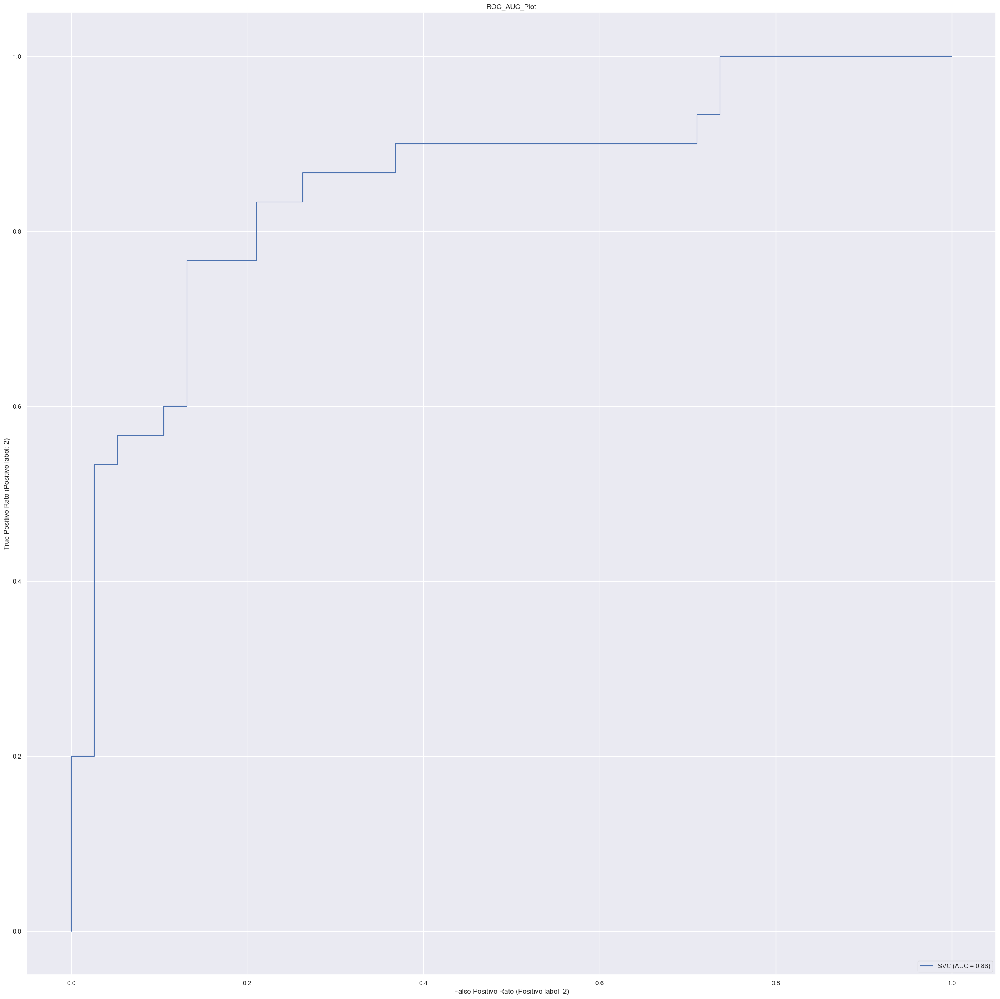

In [215]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

In [211]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

Accuracy :  77.94%


KeyboardInterrupt: 

In [212]:
model_evaluation(classifier_svcbalanced)

NotFittedError: This SVC instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

              precision    recall  f1-score   support

           1       0.77      0.87      0.81        38
           2       0.80      0.67      0.73        30

    accuracy                           0.78        68
   macro avg       0.78      0.77      0.77        68
weighted avg       0.78      0.78      0.78        68



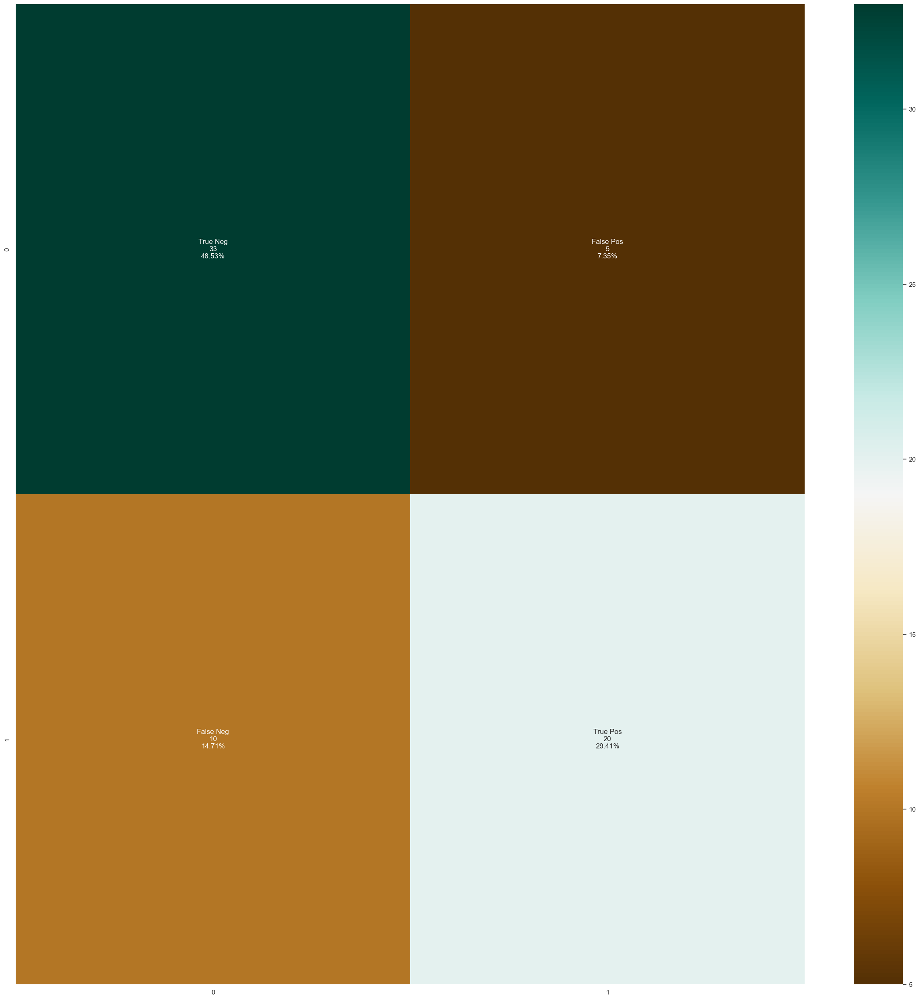

In [202]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           1       0.79      0.87      0.82        38
           2       0.81      0.70      0.75        30

    accuracy                           0.79        68
   macro avg       0.80      0.78      0.79        68
weighted avg       0.80      0.79      0.79        68



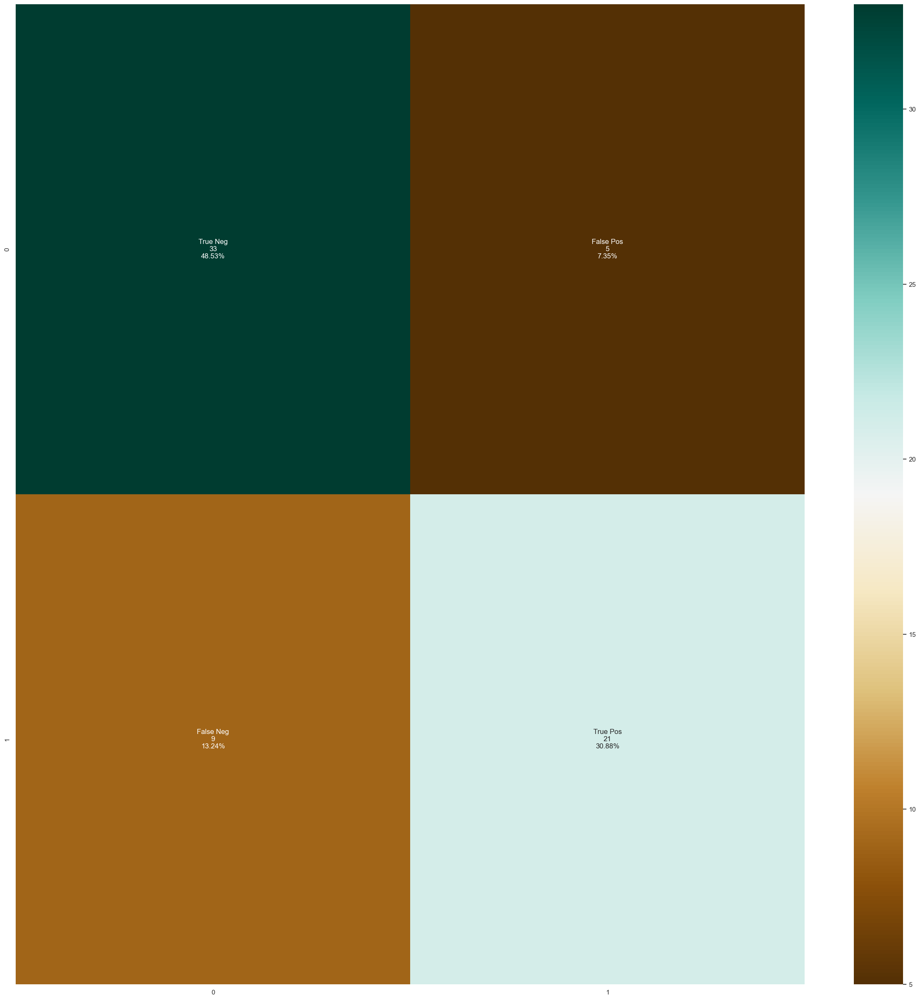

In [210]:
model_evaluation(classifier_supervector)

# 4.Random Forest Classifier

In [63]:
from sklearn.ensemble import RandomForestClassifier

In [64]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

In [65]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,random_state = 0,class_weight='balanced')

In [66]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[5,10]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [67]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [68]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(xtrain,ytrain)

RandomForestClassifier(max_depth=2)

In [69]:
classifier_randomsearch=GridSearchCV(classifier_rfbalanced,param_grid,scoring='accuracy',cv=cv)

In [72]:
classifier_randomsearch.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [5, 10],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [73]:
print(classifier_randomsearch.best_params_)

{'bootstrap': True, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2}


In [74]:
##prediction
y_pred2=classifier_randomsearch.predict(xtest)

In [75]:
print(classifier_randomsearch.best_score_)

0.8354761904761906


In [76]:
score=accuracy_score(y_pred2,ytest)
print(score)

0.7647058823529411


In [77]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           1       0.84      0.76      0.80        42
           2       0.67      0.77      0.71        26

    accuracy                           0.76        68
   macro avg       0.75      0.77      0.76        68
weighted avg       0.78      0.76      0.77        68



Accuracy :  76.47%
Cross Validation Score :  91.29%
ROC_AUC Score :  75.09%
Error Rate:  23.53%


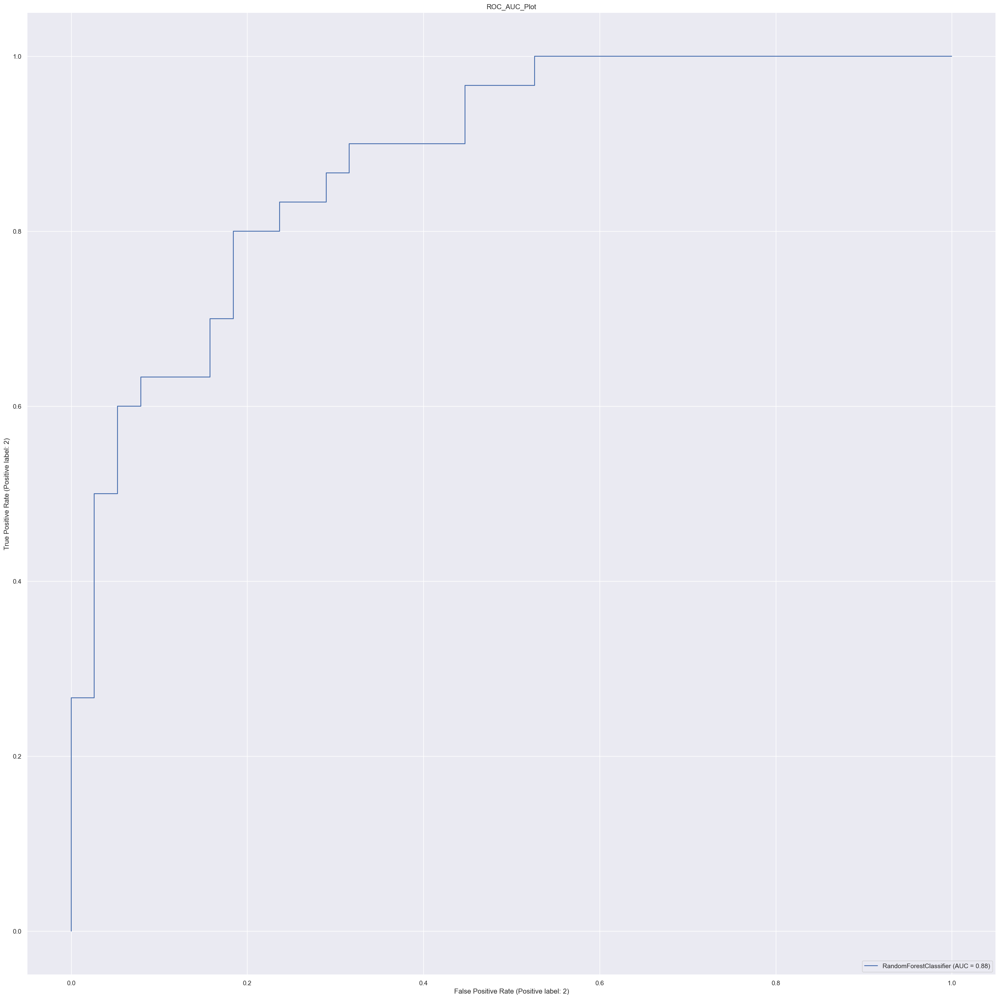

In [70]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  79.41%
Cross Validation Score :  91.06%
ROC_AUC Score :  77.72%
Error Rate:  20.59%


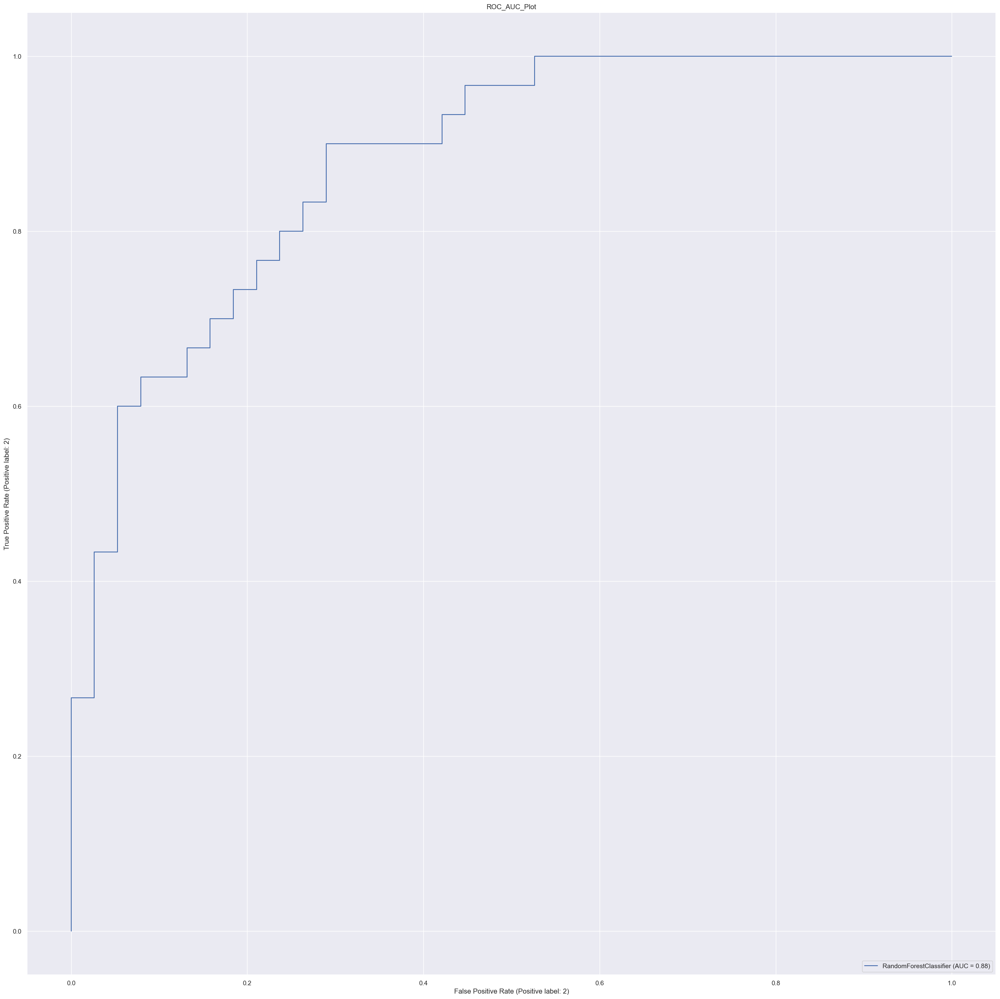

In [78]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           1       0.76      0.84      0.80        38
           2       0.77      0.67      0.71        30

    accuracy                           0.76        68
   macro avg       0.77      0.75      0.76        68
weighted avg       0.77      0.76      0.76        68



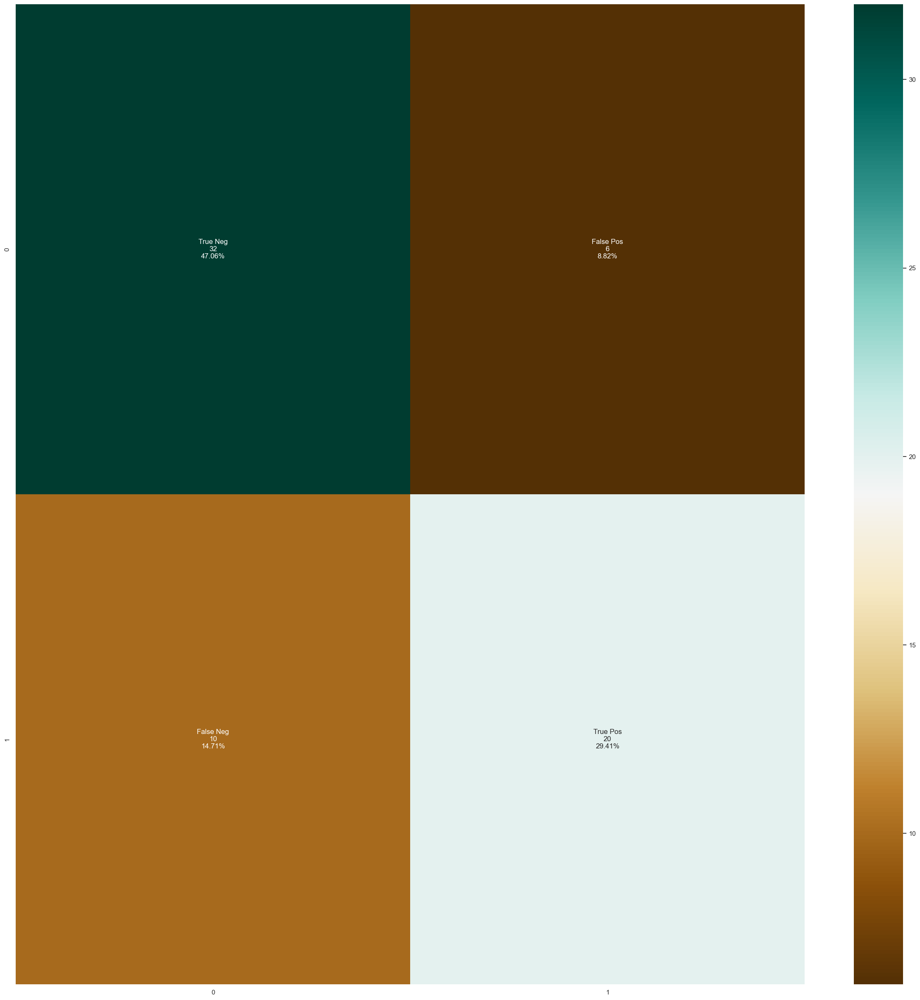

In [248]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           1       0.76      0.82      0.78        38
           2       0.74      0.67      0.70        30

    accuracy                           0.75        68
   macro avg       0.75      0.74      0.74        68
weighted avg       0.75      0.75      0.75        68



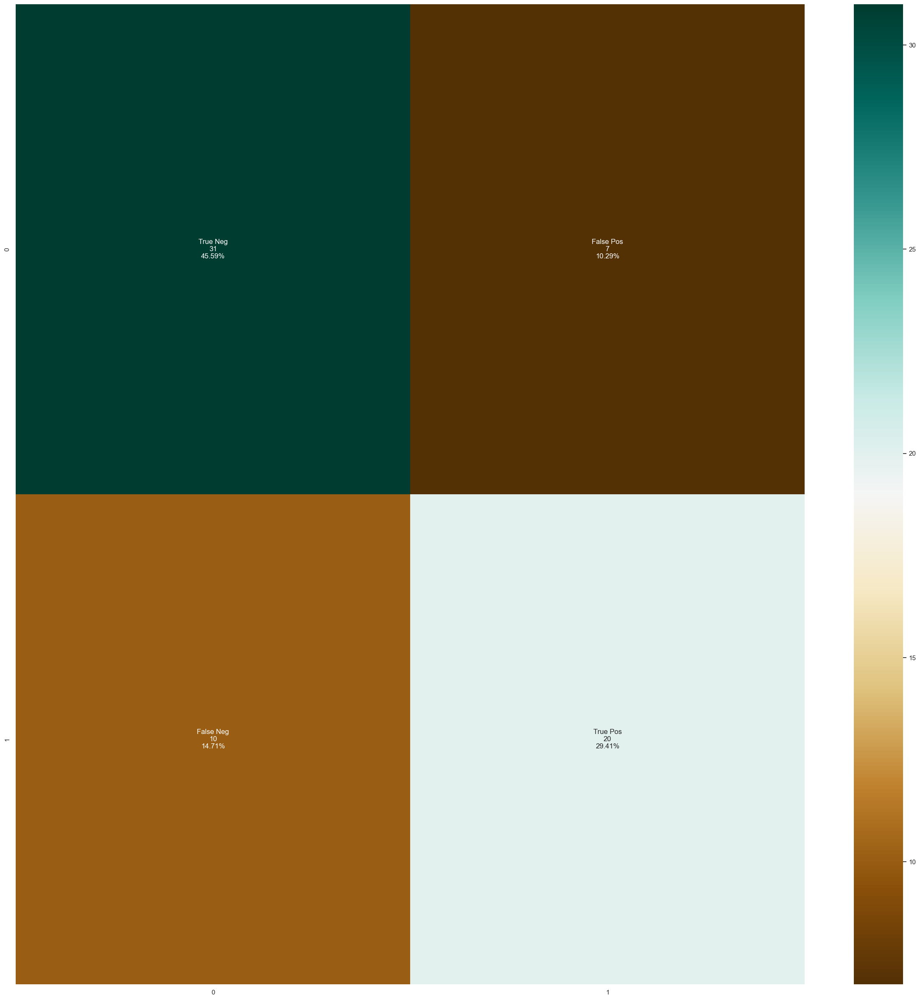

In [249]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           1       0.76      0.82      0.78        38
           2       0.74      0.67      0.70        30

    accuracy                           0.75        68
   macro avg       0.75      0.74      0.74        68
weighted avg       0.75      0.75      0.75        68



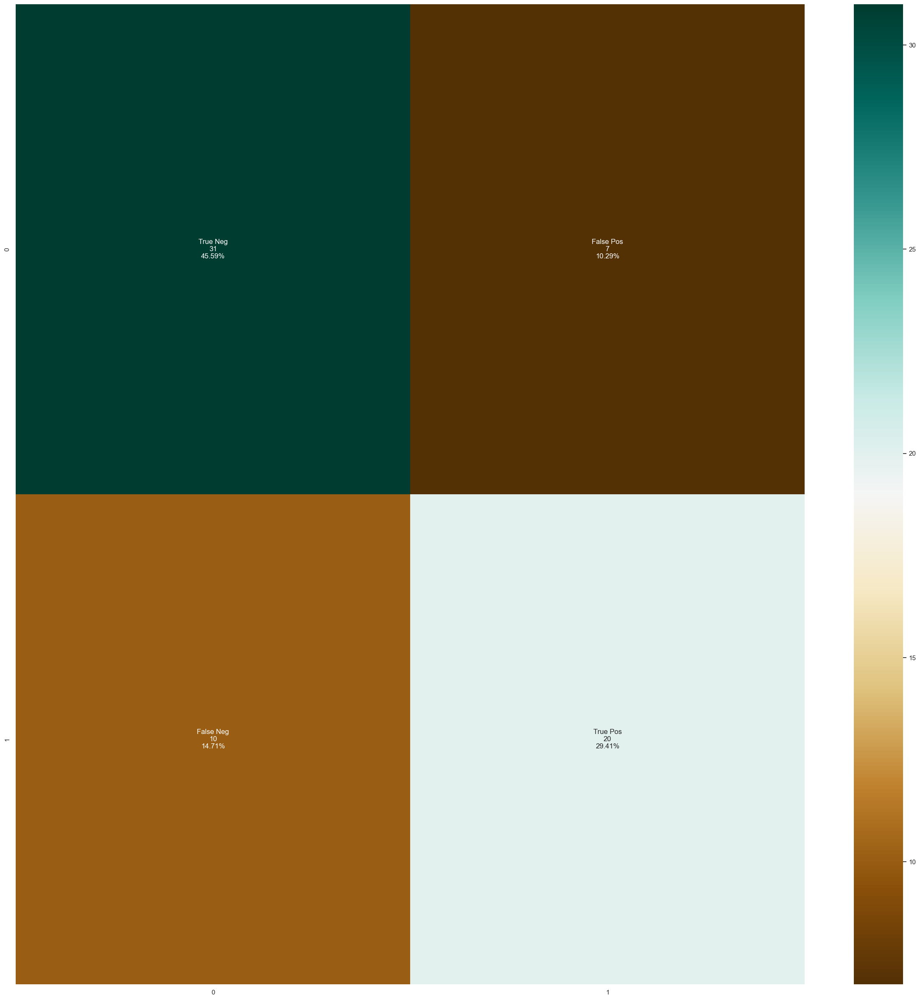

In [250]:
model_evaluation(classifier_randomsearch)

[Text(0.5, 0.8333333333333334, 'X[9] <= 1.55\ngini = 0.472\nsamples = 128\nvalue = [125, 77]'),
 Text(0.25, 0.5, 'X[10] <= 1.5\ngini = 0.365\nsamples = 97\nvalue = [117, 37]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.294\nsamples = 66\nvalue = [87, 19]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.469\nsamples = 31\nvalue = [30, 18]'),
 Text(0.75, 0.5, 'X[10] <= 1.5\ngini = 0.278\nsamples = 31\nvalue = [8, 40]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.49\nsamples = 6\nvalue = [4, 3]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.176\nsamples = 25\nvalue = [4, 37]')]

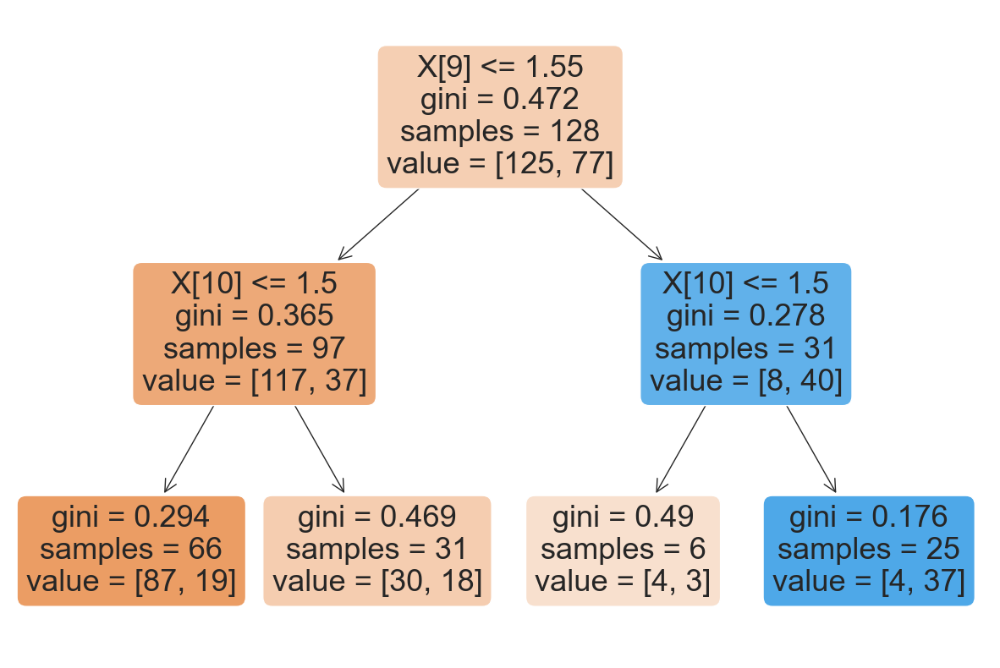

In [79]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

# 5.Naive Bayes

In [80]:
from sklearn.naive_bayes import GaussianNB

In [81]:
classifier_NB = GaussianNB()

Accuracy :  83.82%
Cross Validation Score :  89.29%
ROC_AUC Score :  83.42%
Error Rate:  16.18%


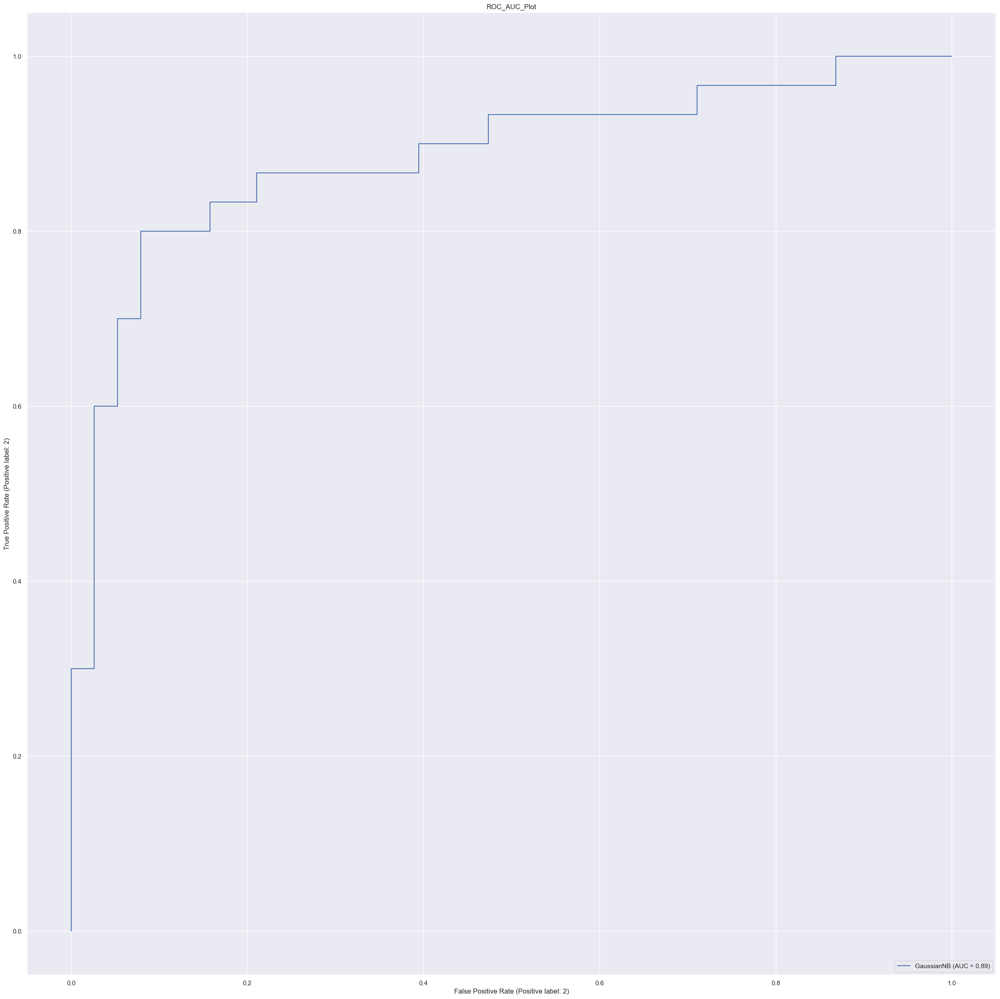

In [82]:
model(classifier_NB)

              precision    recall  f1-score   support

           1       0.85      0.87      0.86        38
           2       0.83      0.80      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.84        68
weighted avg       0.84      0.84      0.84        68



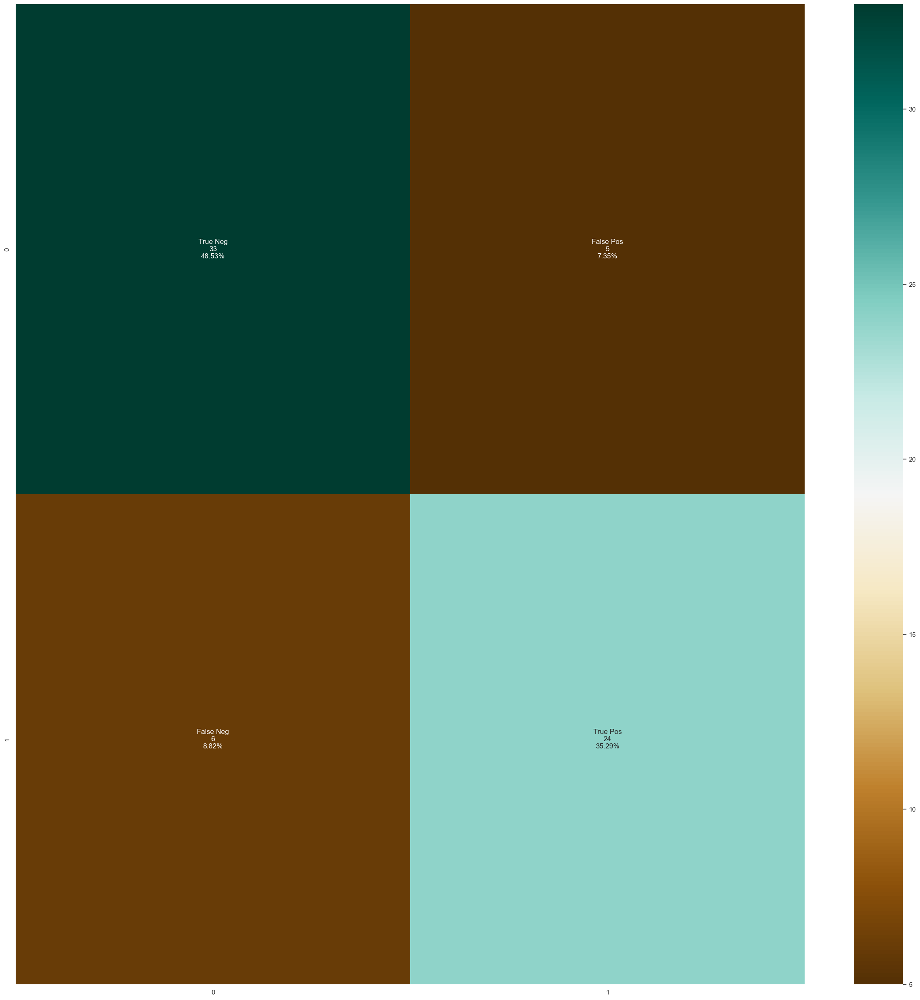

In [83]:
model_evaluation(classifier_NB)

# 6.AdaBoost Classifier
# 7.Gradient Classifier

In [84]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

In [122]:
gb = GradientBoostingClassifier(random_state = 1,min_samples_leaf=50,min_samples_split=10)
ab=AdaBoostClassifier()

In [86]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [87]:
parameters={'learning_rate': [0.1,0.9],
            'subsample':[0.1,0.9],
            'n_estimators':[1,100],
            'max_depth':[3,10],
            'min_samples_split':[50,140],
            'min_samples_leaf':[50,140]
           }

In [88]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [124]:
classifier_Gb.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(random_state=1),
             param_grid={'learning_rate': [0.1, 0.9], 'max_depth': [3, 10],
                         'min_samples_leaf': [50, 140],
                         'min_samples_split': [50, 140],
                         'n_estimators': [1, 100], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [125]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 50, 'min_samples_split': 140, 'n_estimators': 100, 'subsample': 0.9}


In [126]:
print(classifier_Gb.best_score_)

0.8436507936507937


In [127]:
##prediction
y_pred1=classifier_Gb.predict(xtest)

In [128]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8088235294117647
error rate is 0.19117647058823528


In [129]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           1       0.92      0.78      0.84        45
           2       0.67      0.87      0.75        23

    accuracy                           0.81        68
   macro avg       0.79      0.82      0.80        68
weighted avg       0.84      0.81      0.81        68



              precision    recall  f1-score   support

           1       0.78      0.92      0.84        38
           2       0.87      0.67      0.75        30

    accuracy                           0.81        68
   macro avg       0.82      0.79      0.80        68
weighted avg       0.82      0.81      0.80        68



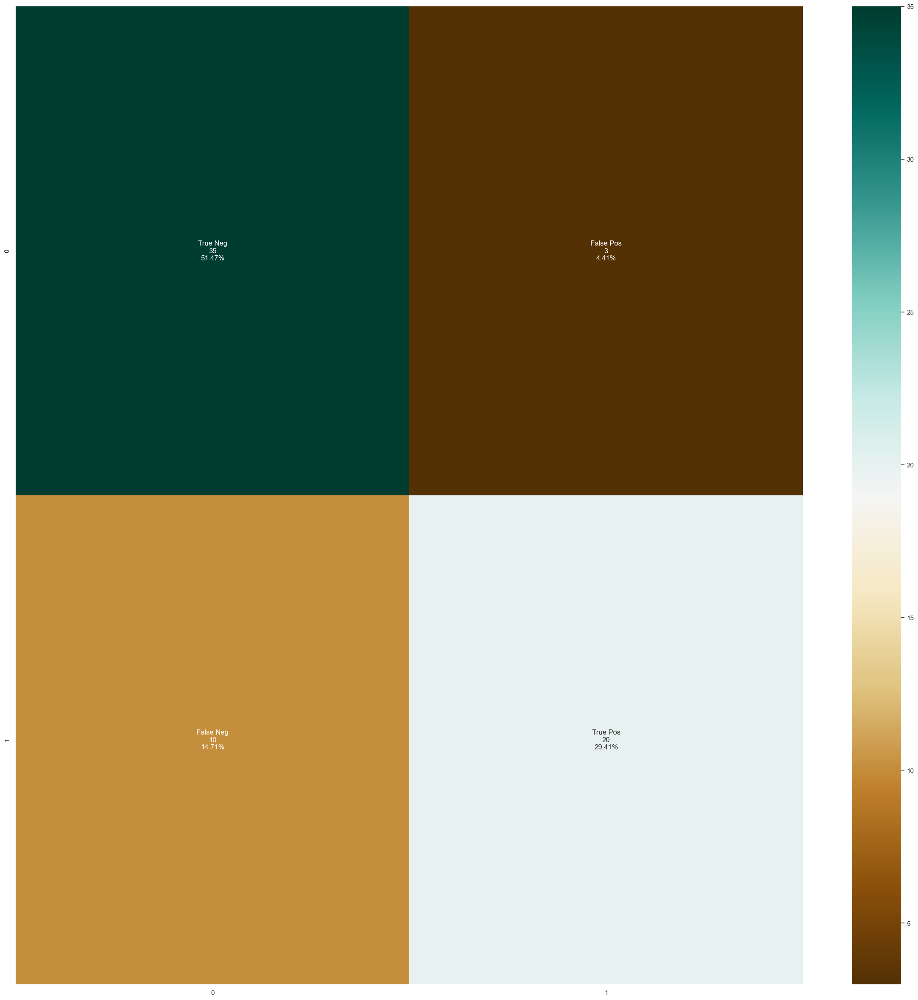

In [130]:
model_evaluation(classifier_Gb)

Accuracy :  79.41%
Cross Validation Score :  91.27%
ROC_AUC Score :  77.72%
Error Rate:  20.59%


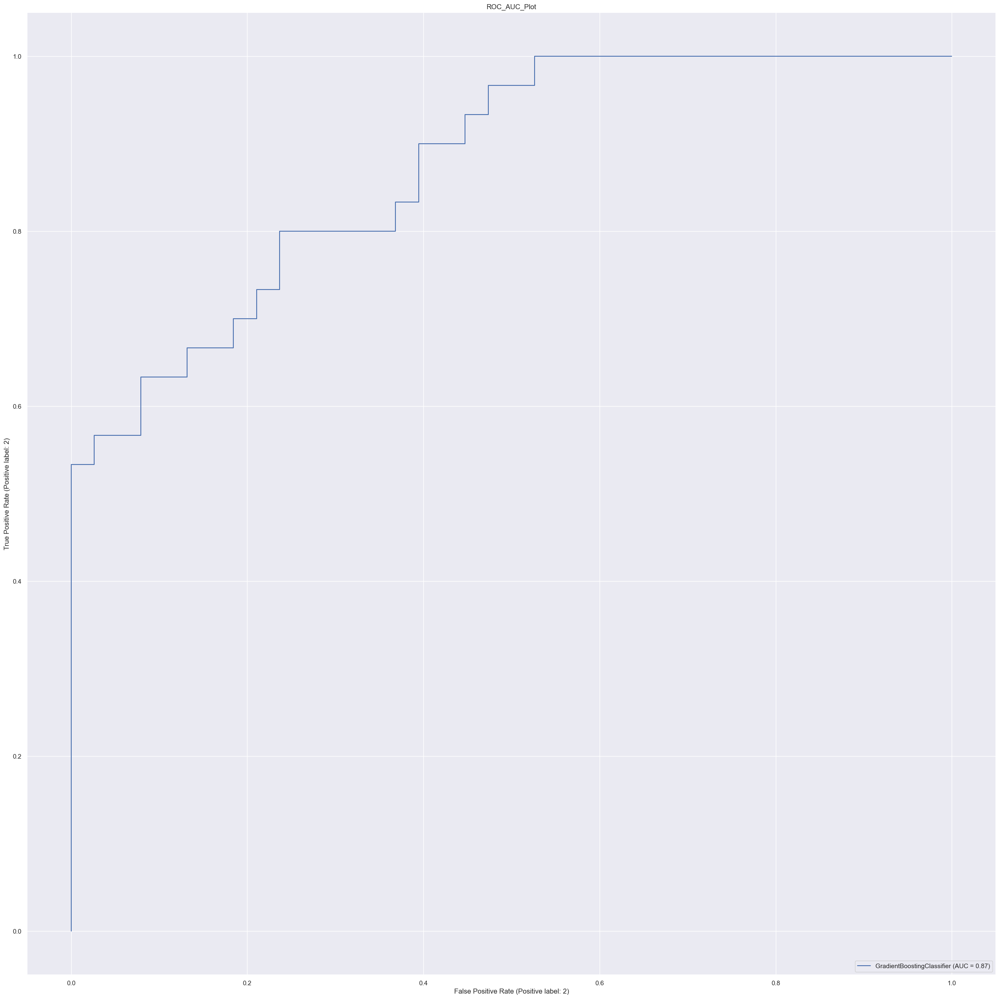

In [123]:
model(gb)

Accuracy :  77.94%
Cross Validation Score :  84.91%
ROC_AUC Score :  77.46%
Error Rate:  22.06%


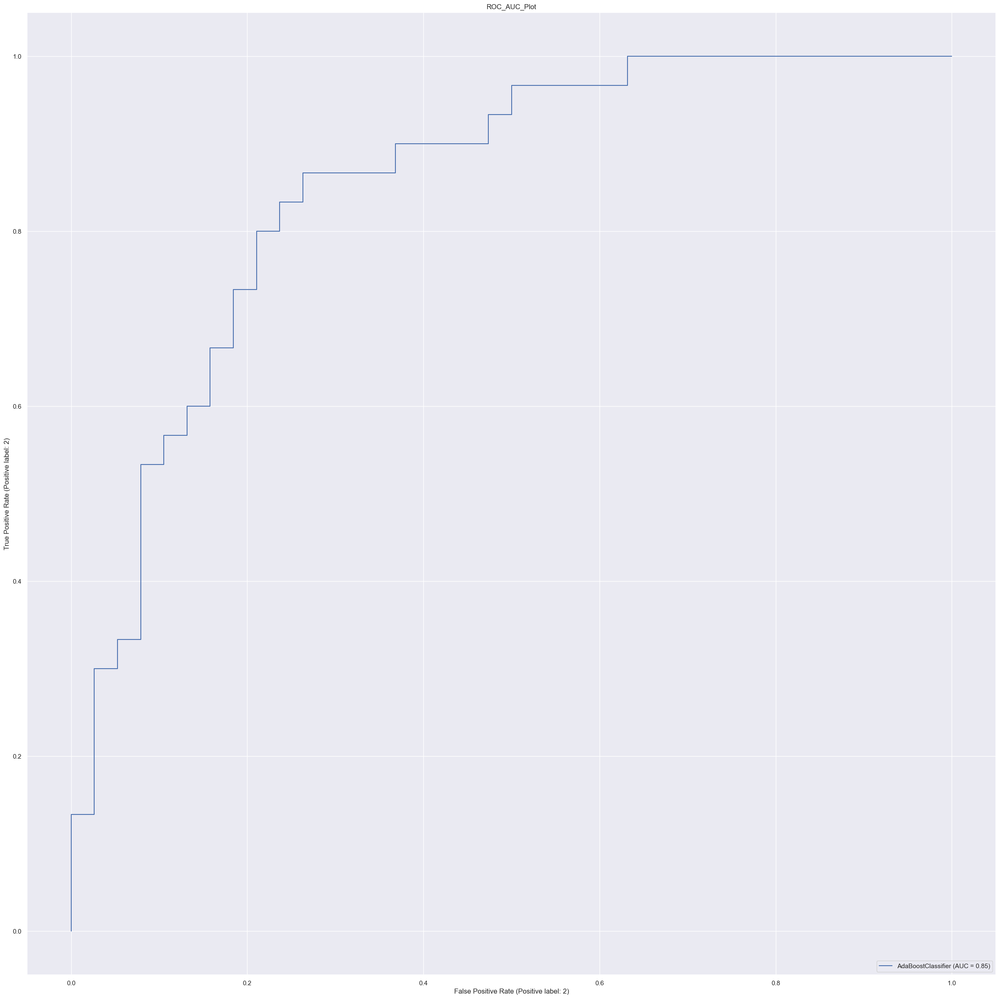

In [97]:
model(ab)

              precision    recall  f1-score   support

           1       0.77      0.87      0.81        38
           2       0.80      0.67      0.73        30

    accuracy                           0.78        68
   macro avg       0.78      0.77      0.77        68
weighted avg       0.78      0.78      0.78        68



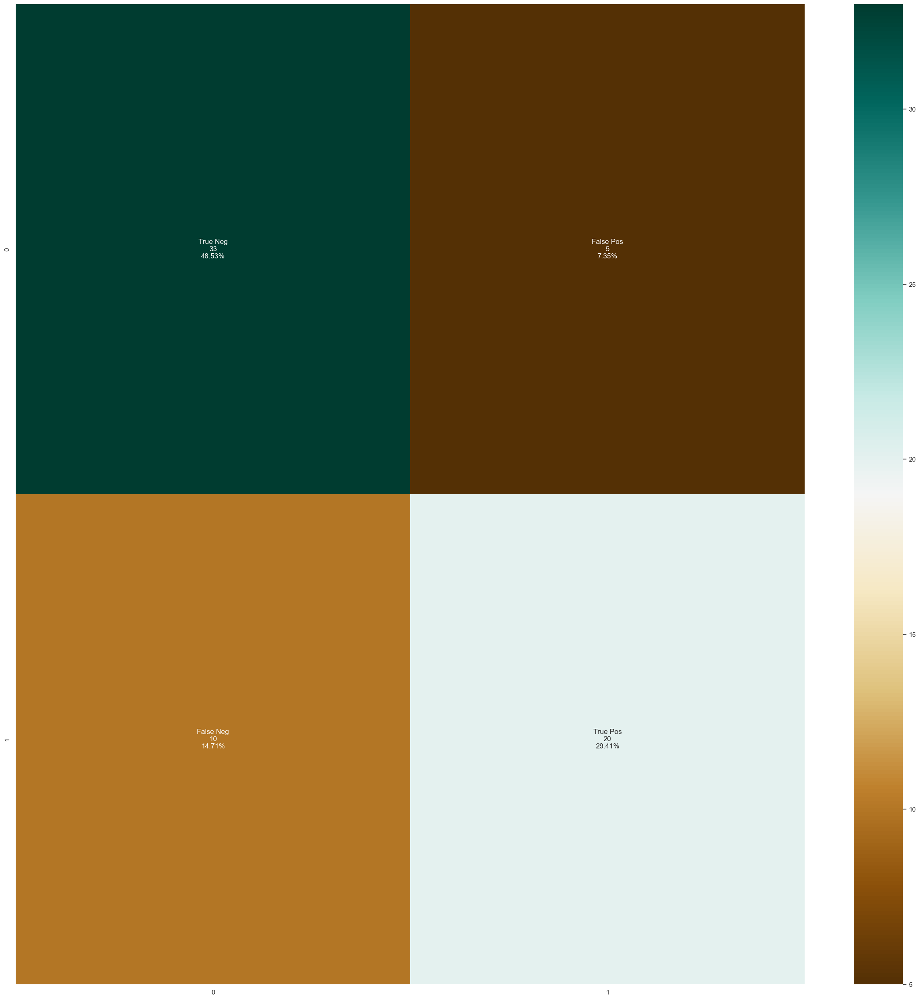

In [303]:
model_evaluation(gb)

              precision    recall  f1-score   support

           1       0.82      0.82      0.82        38
           2       0.77      0.77      0.77        30

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.79      0.79      0.79        68



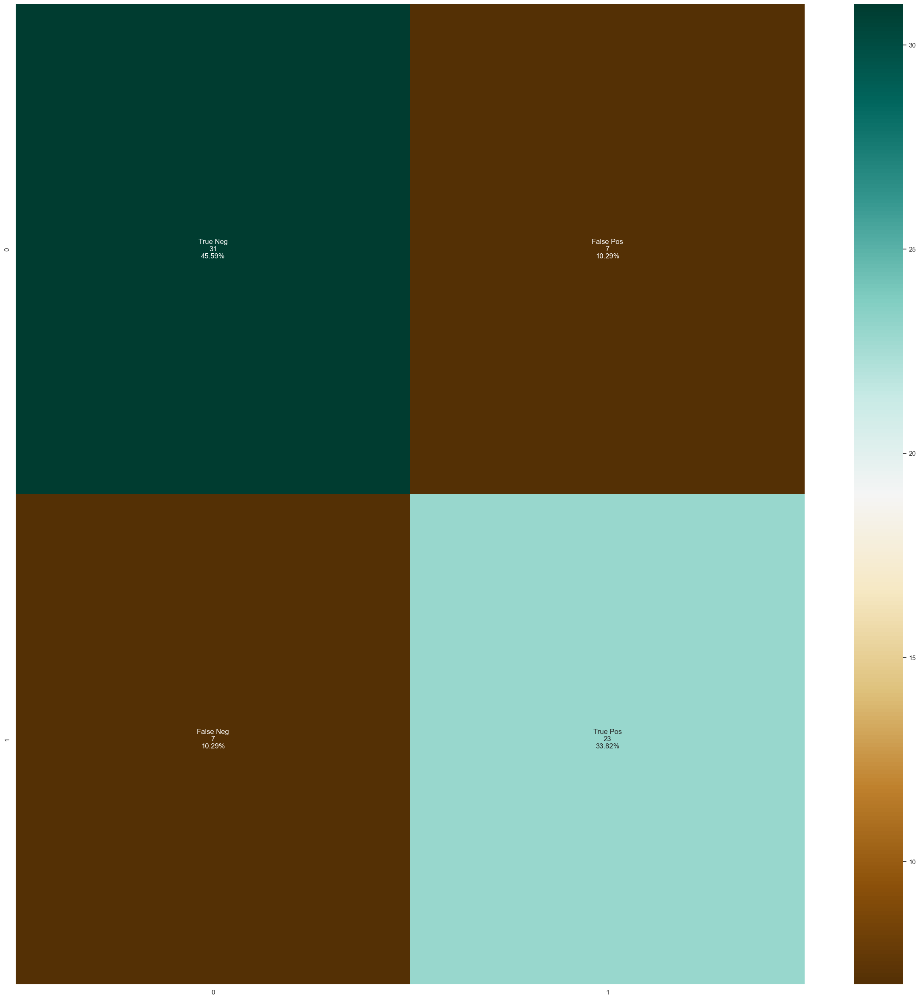

In [304]:
model_evaluation(ab)

# Particle Swarm Optimization

In [131]:
from sklearn.svm import SVC
from niapy.problems import Problem
from niapy.task import Task
from niapy.algorithms.basic import ParticleSwarmOptimization

In [132]:
X_new=dataset.drop(columns=['target'])
y_new=dataset['target']

In [133]:
X=X_new.to_numpy()
y=y_new.to_numpy()

In [134]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1234)

In [135]:
class FeatureSelection(Problem):
    def __init__(self, X_train, y_train, alpha=0.99):
        super().__init__(dimension=X_train.shape[1], lower=0, upper=1)
        self.X_train = X_train
        self.y_train = y_train
       # self.alpha = alpha

    def _evaluate(self, x):
        selected = x > 0.5
        num_selected = selected.sum()
        if num_selected == 0:
            return 1.0
       # accuracy = cross_val_score(SVC(), self.X_train[:, selected], self.y_train, cv=2, n_jobs=-1).mean()
        #score = 1 - accuracy
        num_features = self.X_train.shape[1]
        return num_features
       # return self.alpha * score + (1 - self.alpha) * (num_selected / num_features)

In [136]:
problem = FeatureSelection(X_train, y_train)
task = Task(problem, max_iters=100)
algorithm = ParticleSwarmOptimization( population_size=10, limit=100,seed=1234)
best_features, best_fitness = algorithm.run(task)

In [137]:
dataset_features=dataset.drop(columns=['target'])
best_features

array([0.97669977, 0.38019574, 0.92324623, 0.26169242, 0.31909706,
       0.11809123, 0.24176629, 0.31853393, 0.96407925, 0.2636498 ,
       0.44100612, 0.60987081, 0.8636213 ])

In [138]:
feature_names=dataset_features.columns.to_numpy()

In [139]:
selected_features = best_features > 0.5
print('Number of selected features:', selected_features.sum())

print('Selected features:', ', '.join(feature_names[selected_features].tolist()))

print(selected_features)

Number of selected features: 5
Selected features: age, cp, exang, ca, thal
[ True False  True False False False False False  True False False  True
  True]


In [140]:
df=dataset[['age','cp','exang','ca','thal','target']].copy()

In [141]:
df

,age,cp,exang,ca,thal,target
0,0.854167,1.000000,0,1.000000,0.00,2
1,0.791667,0.666667,0,0.000000,1.00,1
2,0.583333,0.333333,0,0.000000,1.00,2
3,0.729167,1.000000,1,0.333333,1.00,1
4,0.937500,0.333333,1,0.333333,0.00,1
...,...,...,...,...,...,...
265,0.479167,0.666667,0,0.000000,1.00,1
266,0.312500,0.333333,0,0.000000,1.00,1
267,0.562500,0.333333,0,0.000000,0.00,1
268,0.583333,1.000000,0,0.000000,0.75,1


In [142]:
from sklearn.model_selection import train_test_split, GridSearchCV
x = df.drop('target', axis = 1)
Y = df['target']
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x, Y, test_size = 0.25, stratify = Y, random_state = 0)

# Model creation after PSO Algorithm

In [143]:
def model(classifier):
    
    classifier.fit(Xtrain,Ytrain)
    prediction = classifier.predict(Xtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(Ytest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,Xtrain,Ytrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(Ytest,prediction)))
    plot_roc_curve(classifier, Xtest,Ytest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(Ytest,classifier.predict(Xtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(Ytest,classifier.predict(Xtest)))



In [144]:
# normal logistic regression
classifier_lrbal= LogisticRegression(random_state = 0,C=10,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [145]:
classifier=LogisticRegression()

In [146]:
parameter={'penalty':['l1','l2','elasticnet'],'C':[1,2,3,4,5,6,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [163]:
classifier_regressor=GridSearchCV(classifier_lrbal,param_grid=parameter,scoring='accuracy',cv=cv)

In [164]:
classifier_regressor.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=10, class_weight='balanced',
                                          random_state=0, solver='newton-cg'),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [165]:
print(classifier_regressor.best_params_)

{'C': 3, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [166]:
print(classifier_regressor.best_score_)

0.8404761904761904


In [167]:
##prediction
y_pred=classifier_regressor.predict(Xtest)

In [168]:
score=accuracy_score(y_pred,Ytest)
print(score)

0.8529411764705882


In [169]:
# imbalanced and via grid search
print(classification_report(y_pred,Ytest))

              precision    recall  f1-score   support

           1       0.95      0.82      0.88        44
           2       0.73      0.92      0.81        24

    accuracy                           0.85        68
   macro avg       0.84      0.87      0.85        68
weighted avg       0.87      0.85      0.86        68



In [156]:
model(classifier_regressor)

Accuracy :  86.76%


KeyboardInterrupt: 

Accuracy :  83.82%
Cross Validation Score :  90.17%
ROC_AUC Score :  82.37%


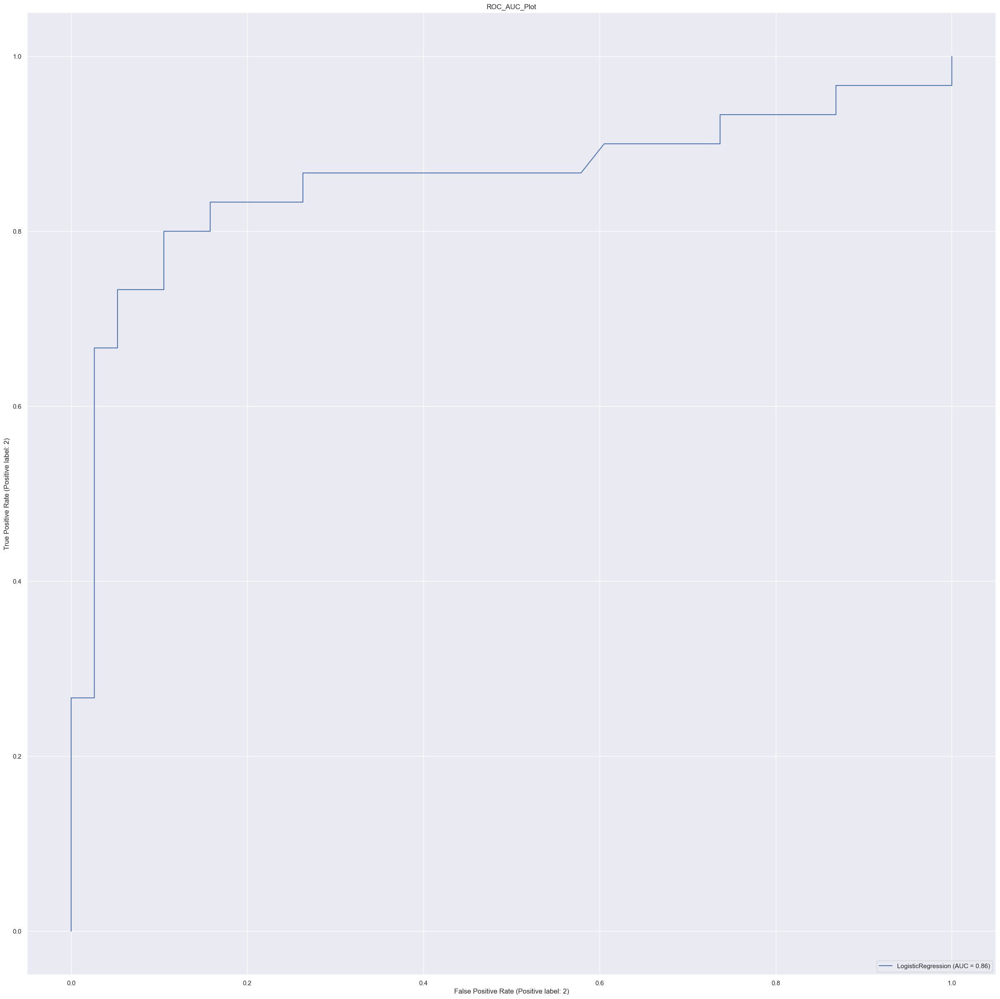

In [157]:
model(classifier)

Accuracy :  85.29%
Cross Validation Score :  89.82%
ROC_AUC Score :  84.04%


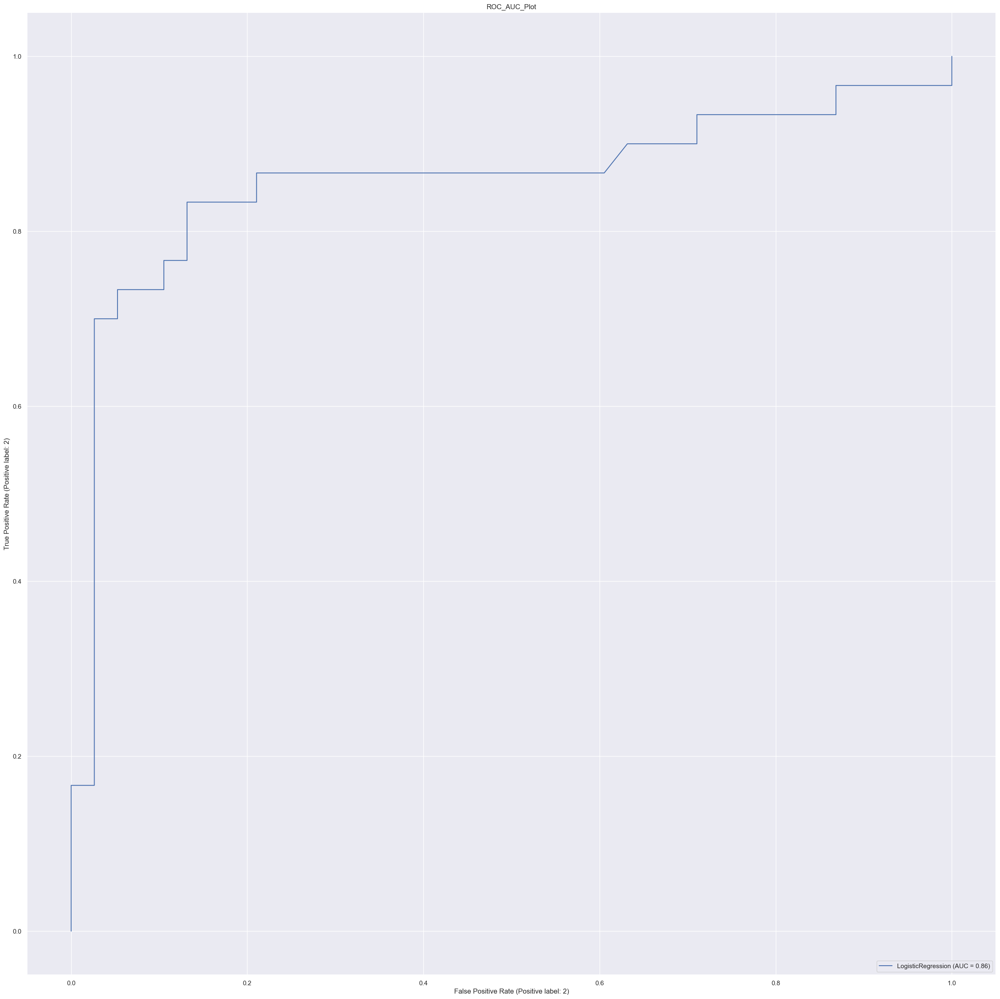

In [158]:
model(classifier_lrbal)

              precision    recall  f1-score   support

           1       0.80      0.95      0.87        38
           2       0.91      0.70      0.79        30

    accuracy                           0.84        68
   macro avg       0.86      0.82      0.83        68
weighted avg       0.85      0.84      0.83        68



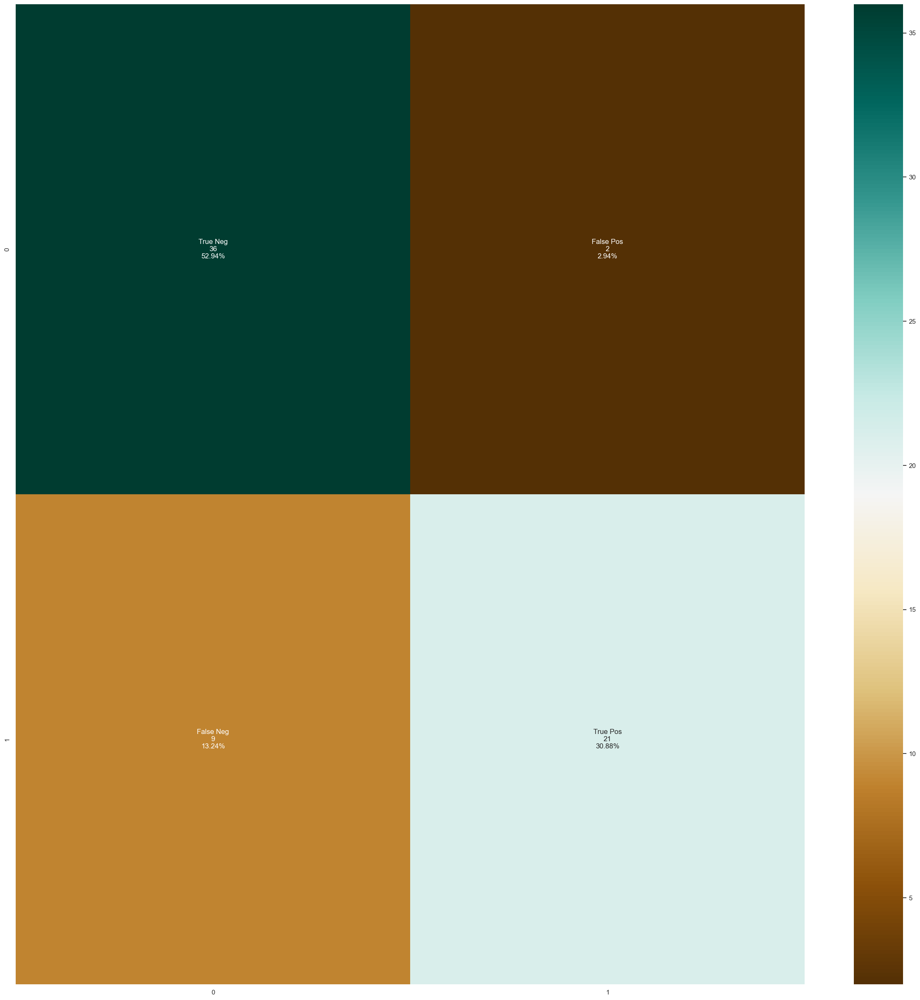

In [159]:
model_evaluation(classifier)

              precision    recall  f1-score   support

           1       0.82      0.95      0.88        38
           2       0.92      0.73      0.81        30

    accuracy                           0.85        68
   macro avg       0.87      0.84      0.85        68
weighted avg       0.86      0.85      0.85        68



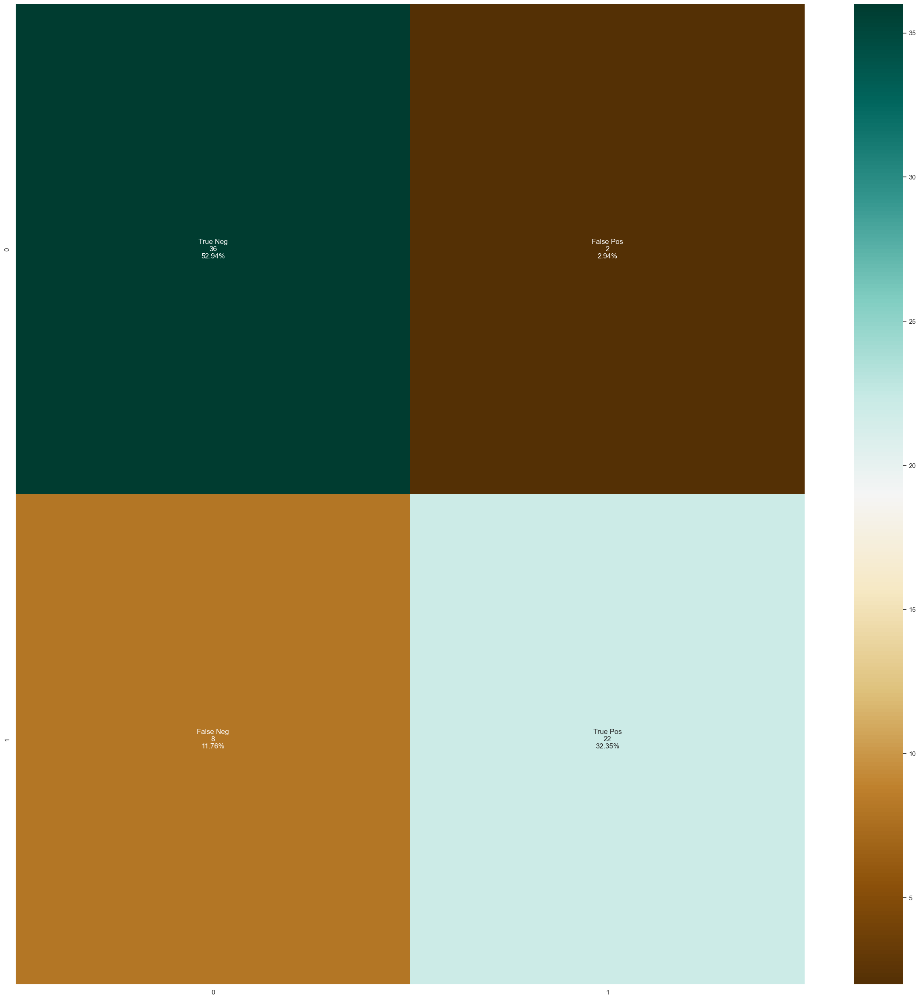

In [160]:
model_evaluation(classifier_lrbal)

              precision    recall  f1-score   support

           1       0.82      0.97      0.89        38
           2       0.96      0.73      0.83        30

    accuracy                           0.87        68
   macro avg       0.89      0.85      0.86        68
weighted avg       0.88      0.87      0.86        68



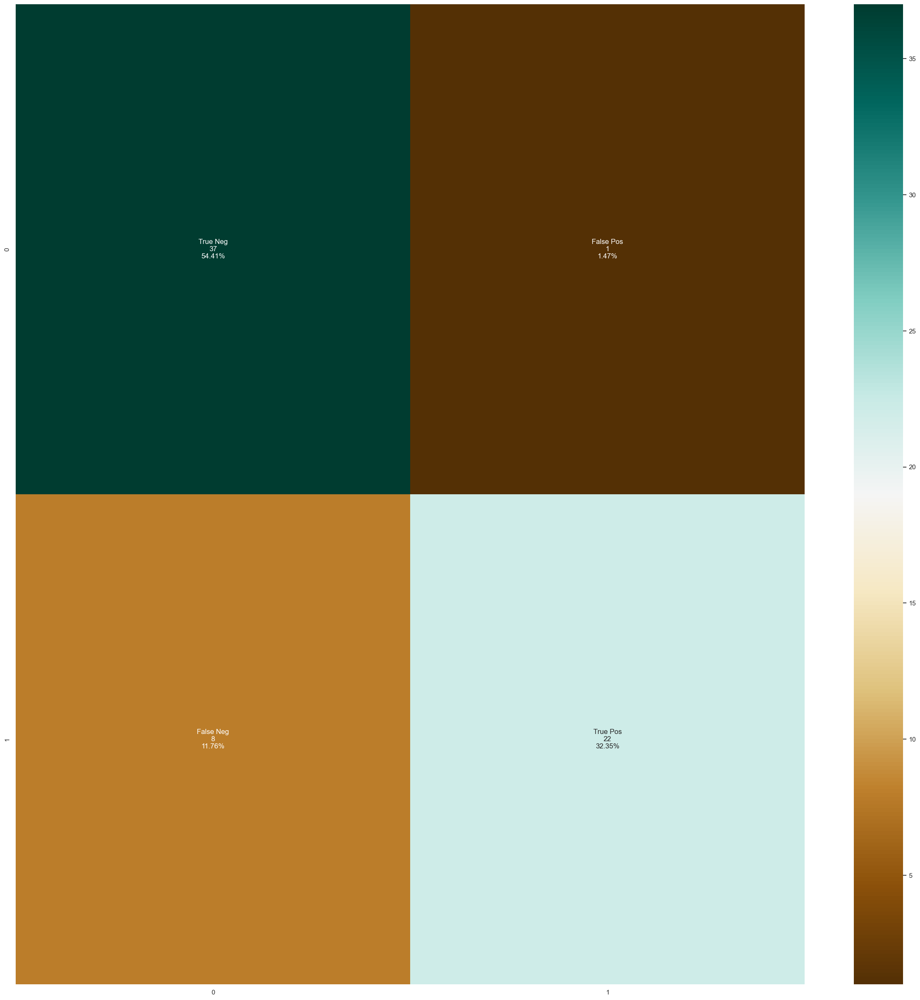

In [161]:
model_evaluation(classifier_regressor)

In [199]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1000,max_depth = 5,min_samples_leaf = 1,class_weight='balanced')

In [200]:
classifier1=DecisionTreeClassifier()

In [201]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [202]:
classifier_decisiontree=GridSearchCV(classifier_dtbalanced,param_grid=parameter1,scoring='accuracy',cv=cv)

In [203]:
classifier_decisiontree.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=5, random_state=1000),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [204]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 4, 'max_features': 'auto', 'splitter': 'best'}


In [205]:
print(classifier_decisiontree.best_score_)

0.8253174603174603


In [206]:
##prediction
y_pred1=classifier_decisiontree.predict(Xtest)

In [207]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8529411764705882
error rate is 0.1470588235294118


In [208]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           1       0.95      0.82      0.88        44
           2       0.73      0.92      0.81        24

    accuracy                           0.85        68
   macro avg       0.84      0.87      0.85        68
weighted avg       0.87      0.85      0.86        68



Accuracy :  82.35%
Cross Validation Score :  81.88%
ROC_AUC Score :  82.11%


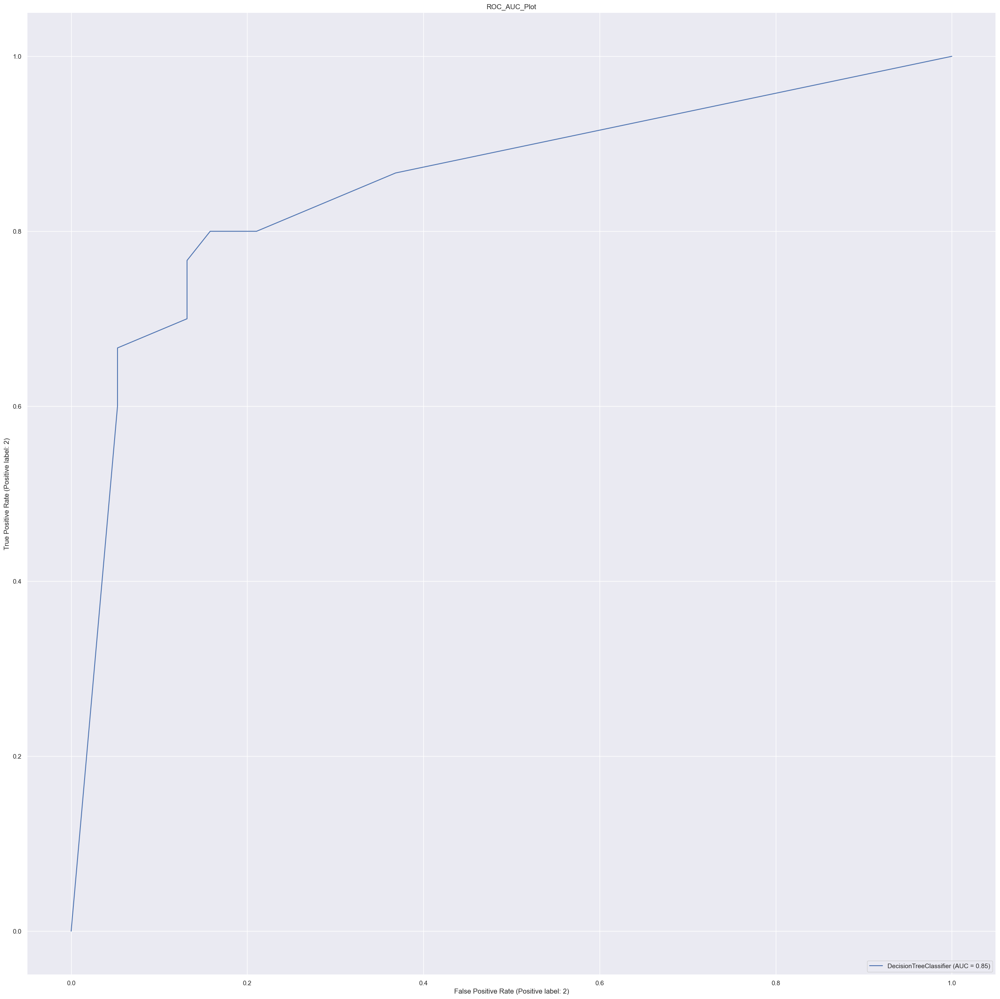

In [209]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

In [210]:
model(classifier_dt)

NameError: name 'classifier_dt' is not defined

Accuracy :  77.94%
Cross Validation Score :  78.04%
ROC_AUC Score :  76.40%


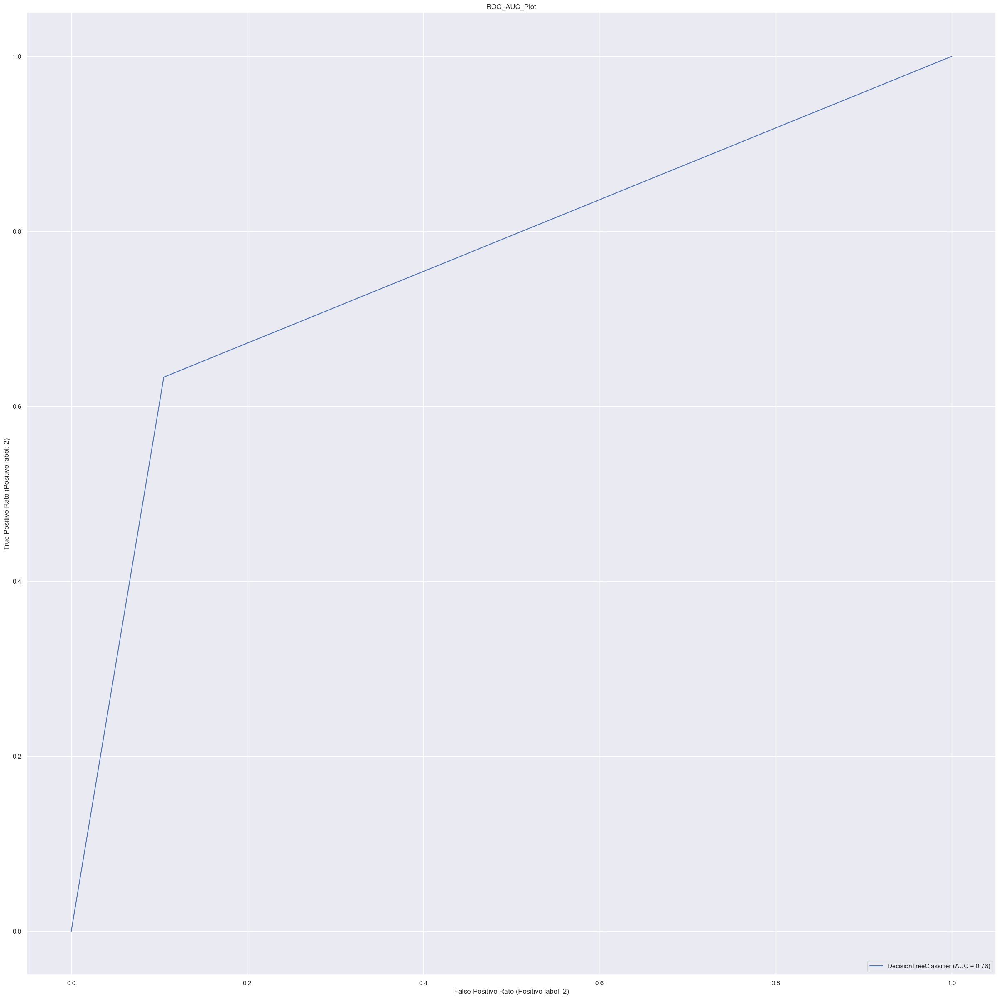

In [211]:
#not balanced and without grid search hyperparameters
model(classifier1)

In [366]:
model_evaluation(classifier_dt)

NameError: name 'classifier_dt' is not defined

In [244]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 100,gamma=100,degree=100,class_weight='balanced')

Accuracy :  82.35%
Cross Validation Score :  90.33%
ROC_AUC Score :  81.40%


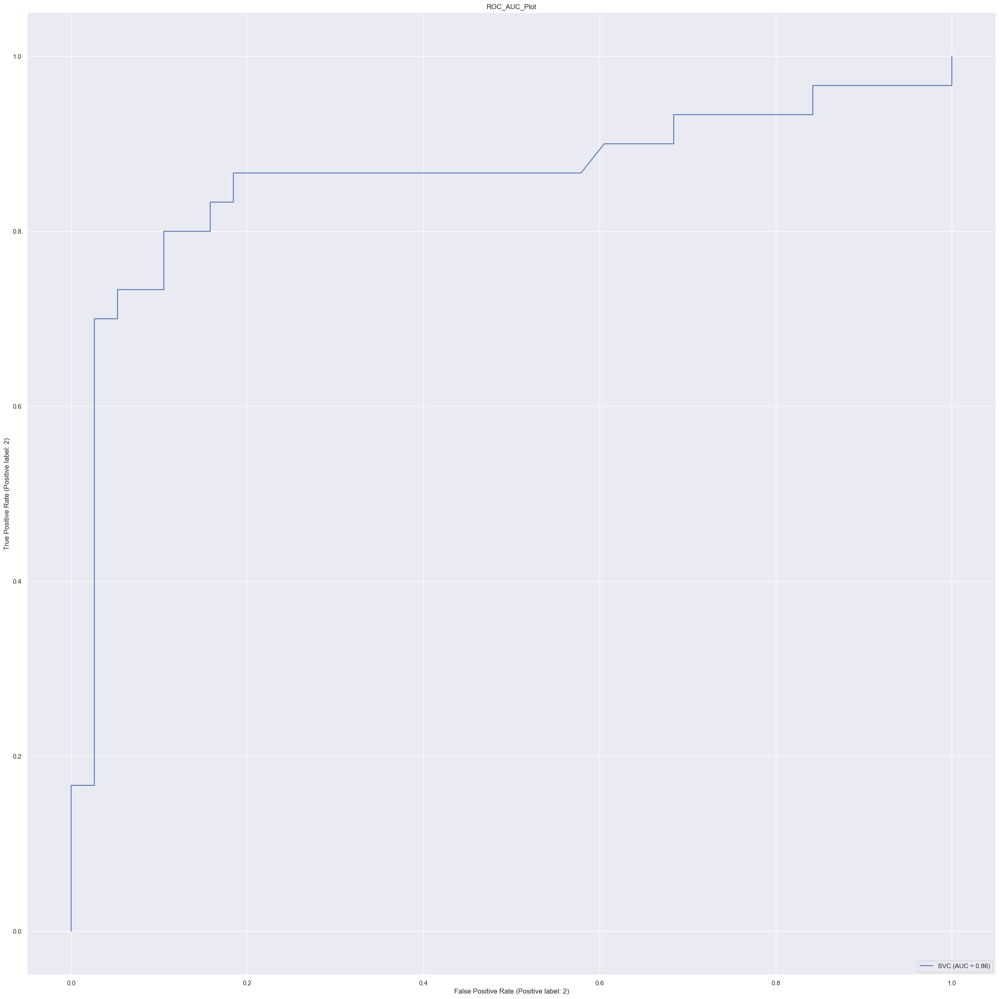

In [245]:
model(classifier_svcbalanced)

In [271]:
classifier_svc = SVC(kernel = 'linear',C = 1000,gamma=100,degree=100)

In [281]:
parameter2 ={'C':[1,100,1000,50,30],'gamma':[0.1, 0.001],'kernel': ['linear','rbf']}

In [291]:
classifier_supervector=GridSearchCV(classifier_svcbalanced,param_grid=parameter2,scoring='accuracy',cv=cv)

In [292]:
classifier_supervector.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=100, class_weight='balanced', degree=100,
                           gamma=100, kernel='linear'),
             param_grid={'C': [1, 100, 1000, 50, 30], 'gamma': [0.1, 0.001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [293]:
print(classifier_supervector.best_params_)

{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}


In [294]:
##prediction
y_pred2=classifier_supervector.predict(Xtest)

In [295]:
print(classifier_supervector.best_score_)

0.8289682539682538


In [296]:
score=accuracy_score(y_pred2,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print(score)
print(error)

0.8235294117647058
0.1470588235294118


In [297]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           1       0.89      0.81      0.85        42
           2       0.73      0.85      0.79        26

    accuracy                           0.82        68
   macro avg       0.81      0.83      0.82        68
weighted avg       0.83      0.82      0.83        68



Accuracy :  83.82%
Cross Validation Score :  90.71%
ROC_AUC Score :  82.37%


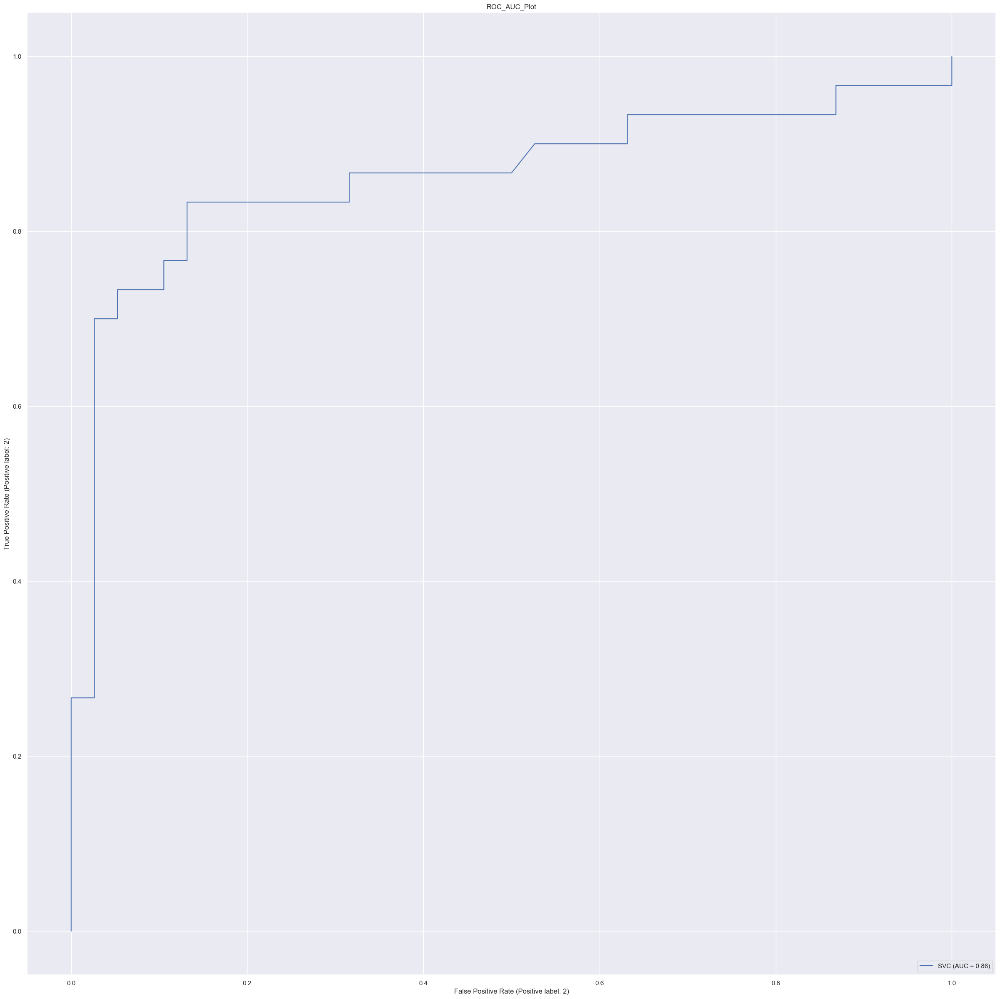

In [298]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

              precision    recall  f1-score   support

           1       0.81      0.89      0.85        38
           2       0.85      0.73      0.79        30

    accuracy                           0.82        68
   macro avg       0.83      0.81      0.82        68
weighted avg       0.83      0.82      0.82        68



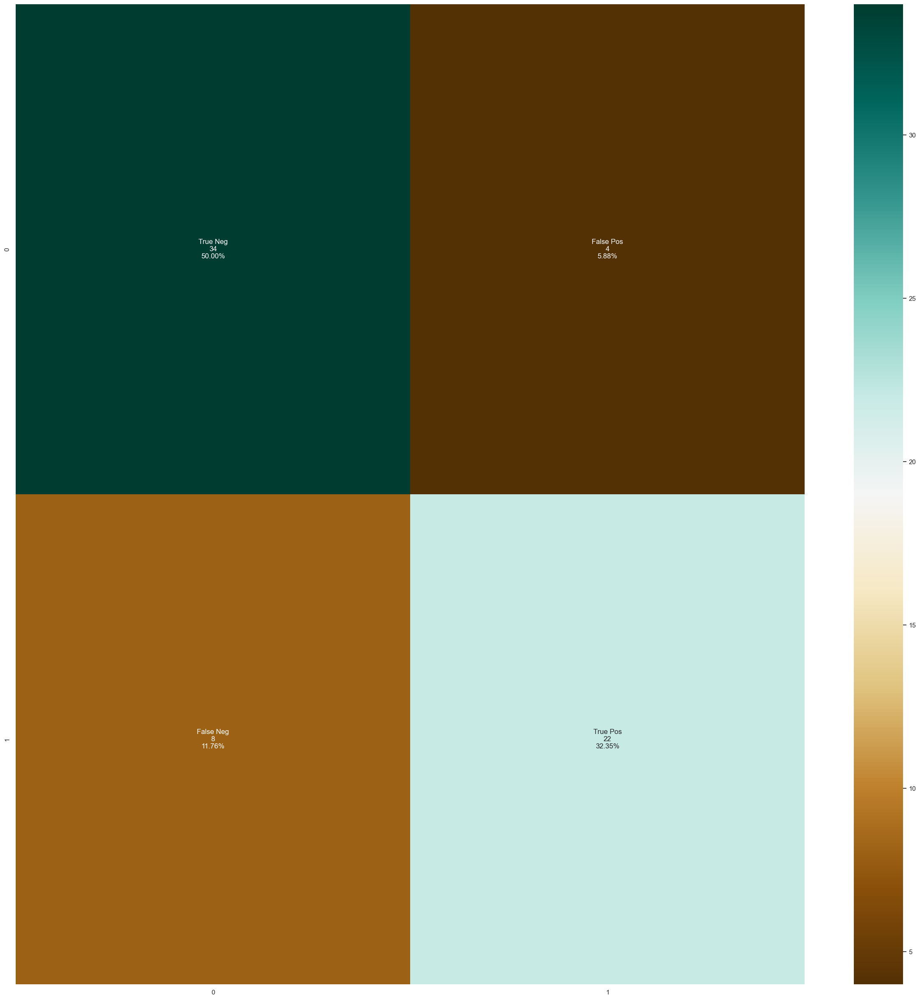

In [290]:
model_evaluation(classifier_svcbalanced)

              precision    recall  f1-score   support

           1       0.77      0.89      0.83        38
           2       0.83      0.67      0.74        30

    accuracy                           0.79        68
   macro avg       0.80      0.78      0.79        68
weighted avg       0.80      0.79      0.79        68



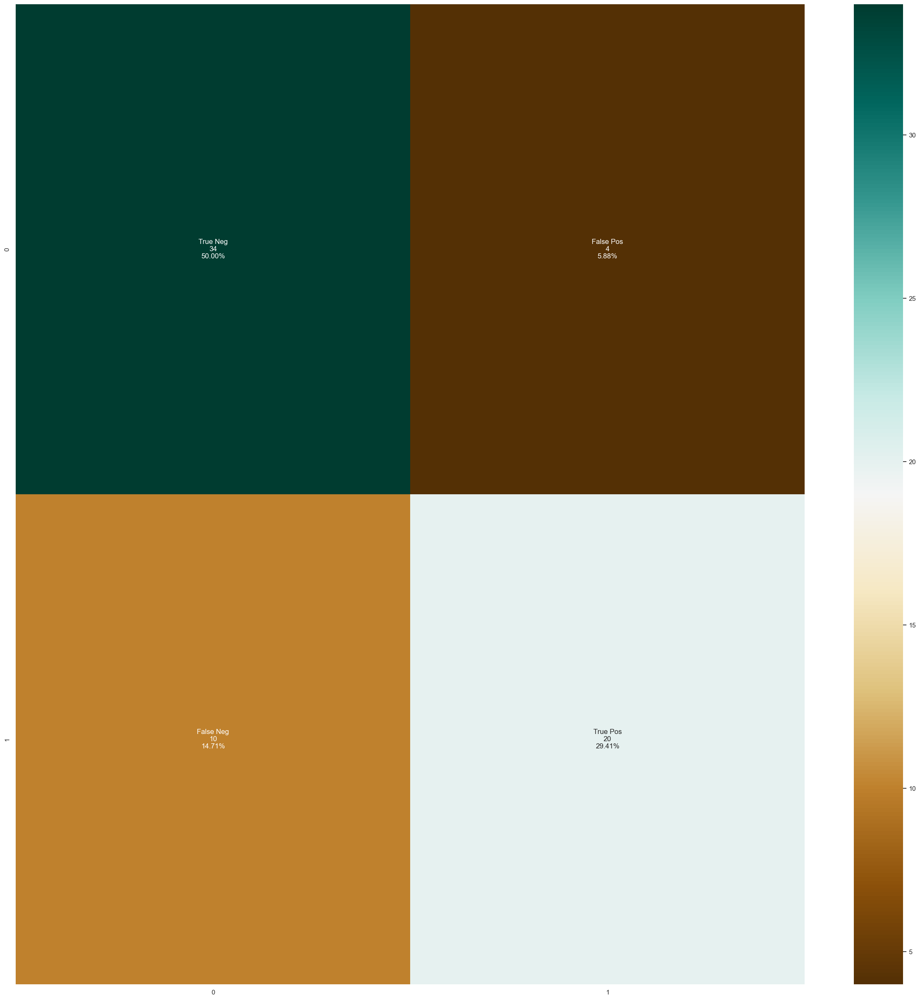

In [382]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           1       0.81      0.92      0.86        38
           2       0.88      0.73      0.80        30

    accuracy                           0.84        68
   macro avg       0.85      0.83      0.83        68
weighted avg       0.84      0.84      0.84        68



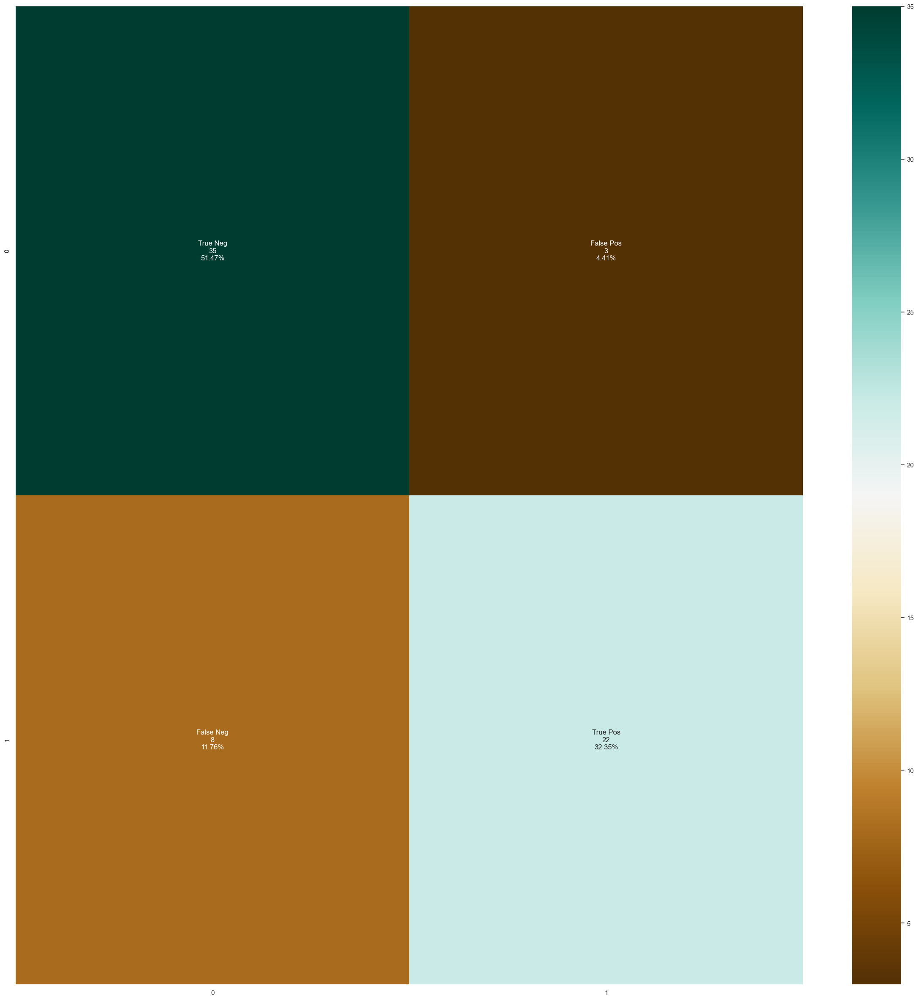

In [383]:
model_evaluation(classifier_supervector)

In [299]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

In [327]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 100,random_state = 10,class_weight='balanced')

In [301]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [302]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [303]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(Xtrain,Ytrain)

RandomForestClassifier(max_depth=2)

In [315]:
classifier_randomsearch=GridSearchCV(classifier_rfbalanced,param_grid,scoring='accuracy',cv=cv)

In [316]:
classifier_randomsearch.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [317]:
print(classifier_randomsearch.best_params_)

{'bootstrap': False, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5}


In [318]:
##prediction
y_pred2=classifier_randomsearch.predict(Xtest)

In [319]:
print(classifier_randomsearch.best_score_)

0.8373809523809524


In [320]:
score=accuracy_score(y_pred2,Ytest)
print(score)

0.8676470588235294


In [321]:
# imbalanced and via grid search
print(classification_report(y_pred2,Ytest))

              precision    recall  f1-score   support

           1       0.95      0.84      0.89        43
           2       0.77      0.92      0.84        25

    accuracy                           0.87        68
   macro avg       0.86      0.88      0.86        68
weighted avg       0.88      0.87      0.87        68



Accuracy :  83.82%
Cross Validation Score :  87.24%
ROC_AUC Score :  82.37%


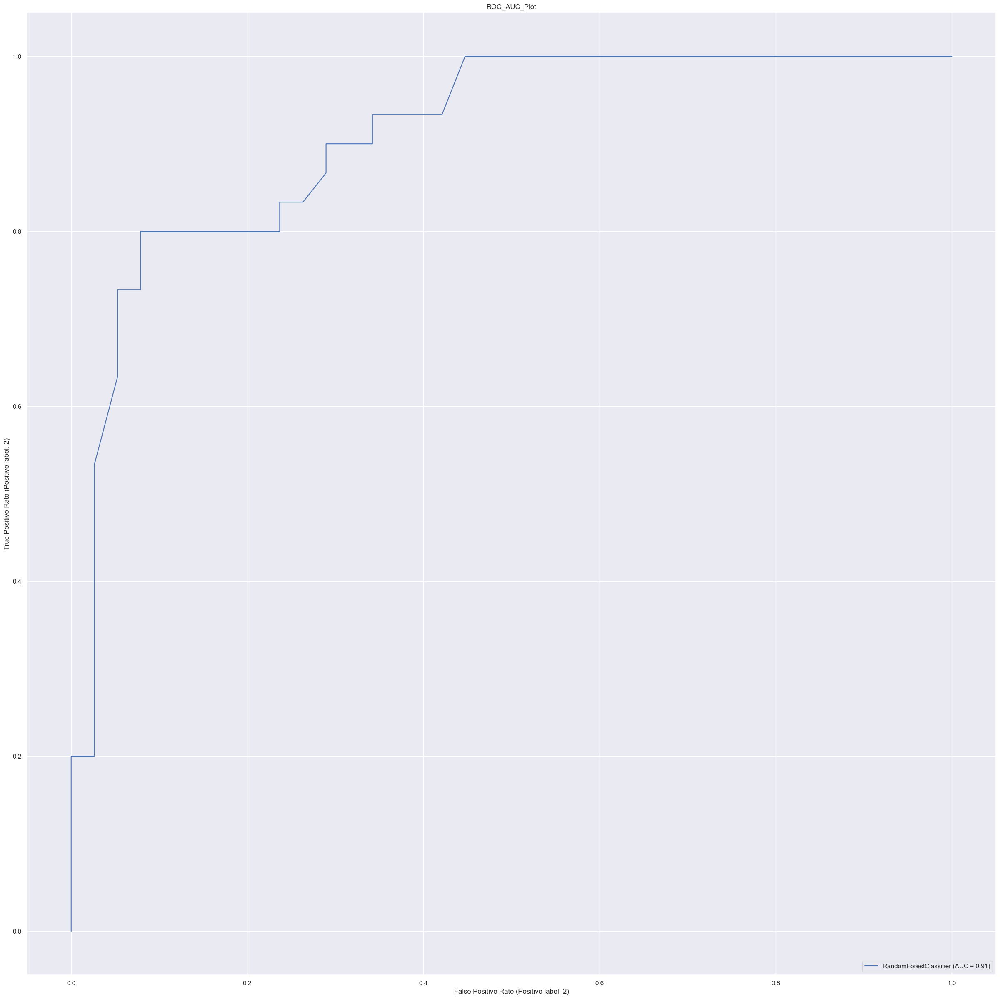

In [328]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  85.29%
Cross Validation Score :  89.85%
ROC_AUC Score :  83.68%


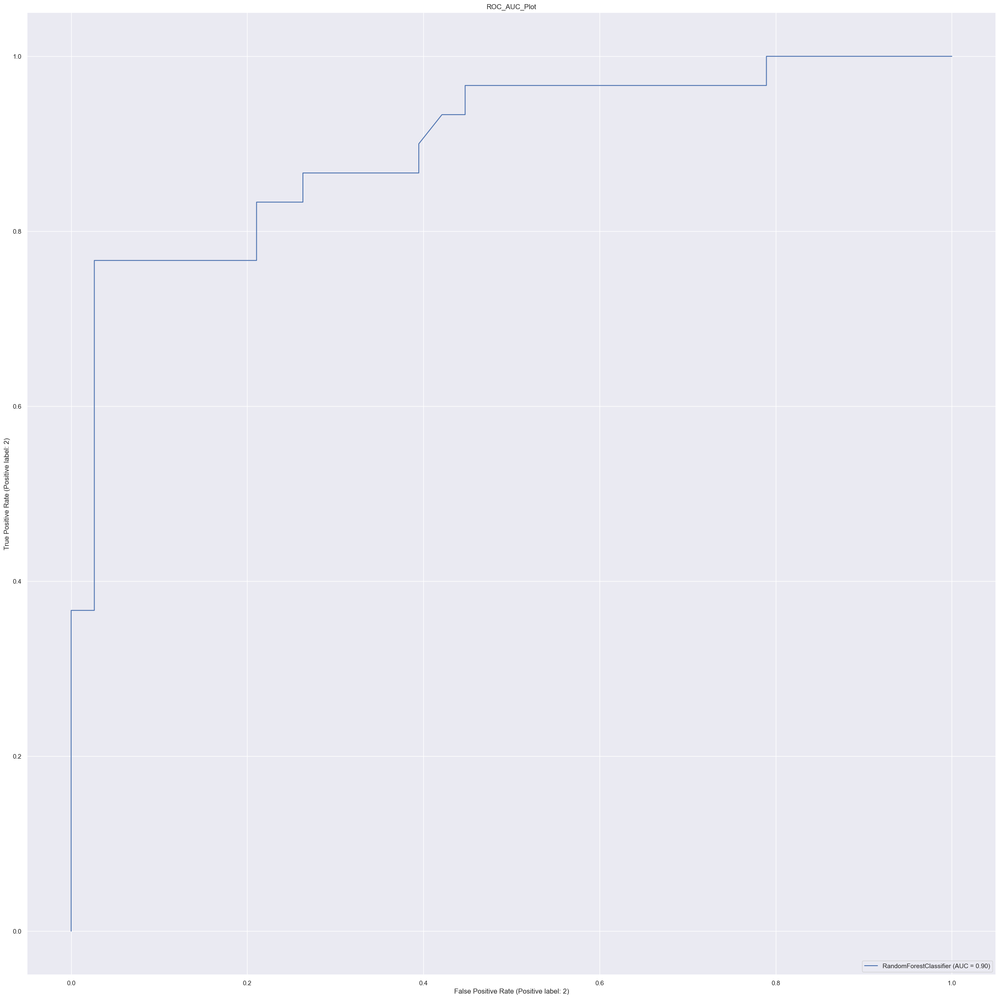

In [314]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           1       0.77      0.95      0.85        38
           2       0.90      0.63      0.75        30

    accuracy                           0.81        68
   macro avg       0.84      0.79      0.80        68
weighted avg       0.83      0.81      0.80        68



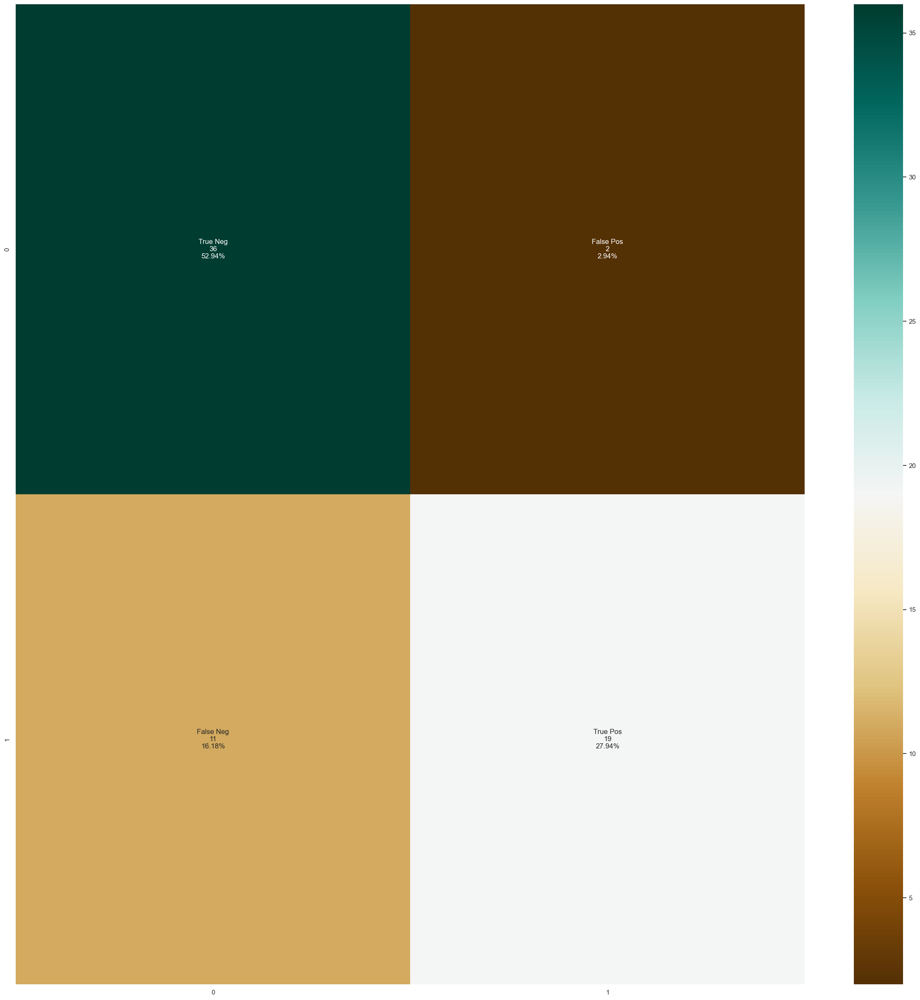

In [398]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           1       0.75      0.95      0.84        38
           2       0.90      0.60      0.72        30

    accuracy                           0.79        68
   macro avg       0.82      0.77      0.78        68
weighted avg       0.82      0.79      0.79        68



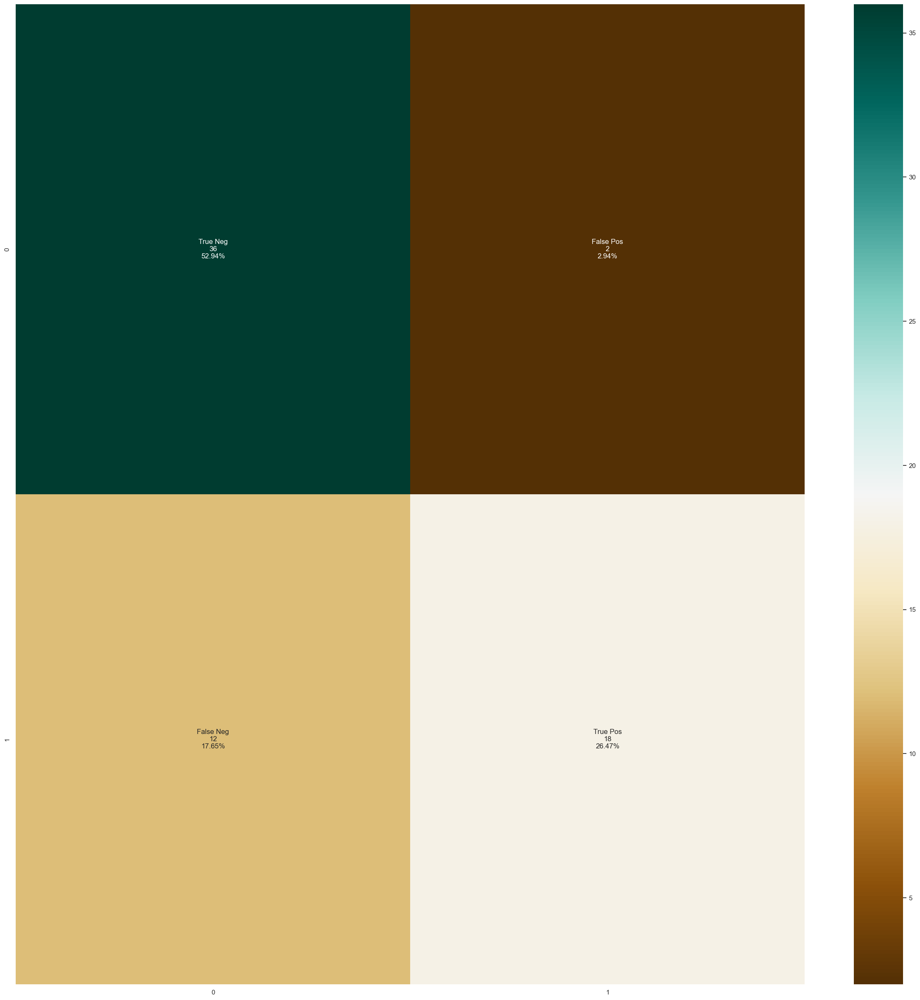

In [399]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           1       0.76      0.89      0.82        38
           2       0.83      0.63      0.72        30

    accuracy                           0.78        68
   macro avg       0.79      0.76      0.77        68
weighted avg       0.79      0.78      0.77        68



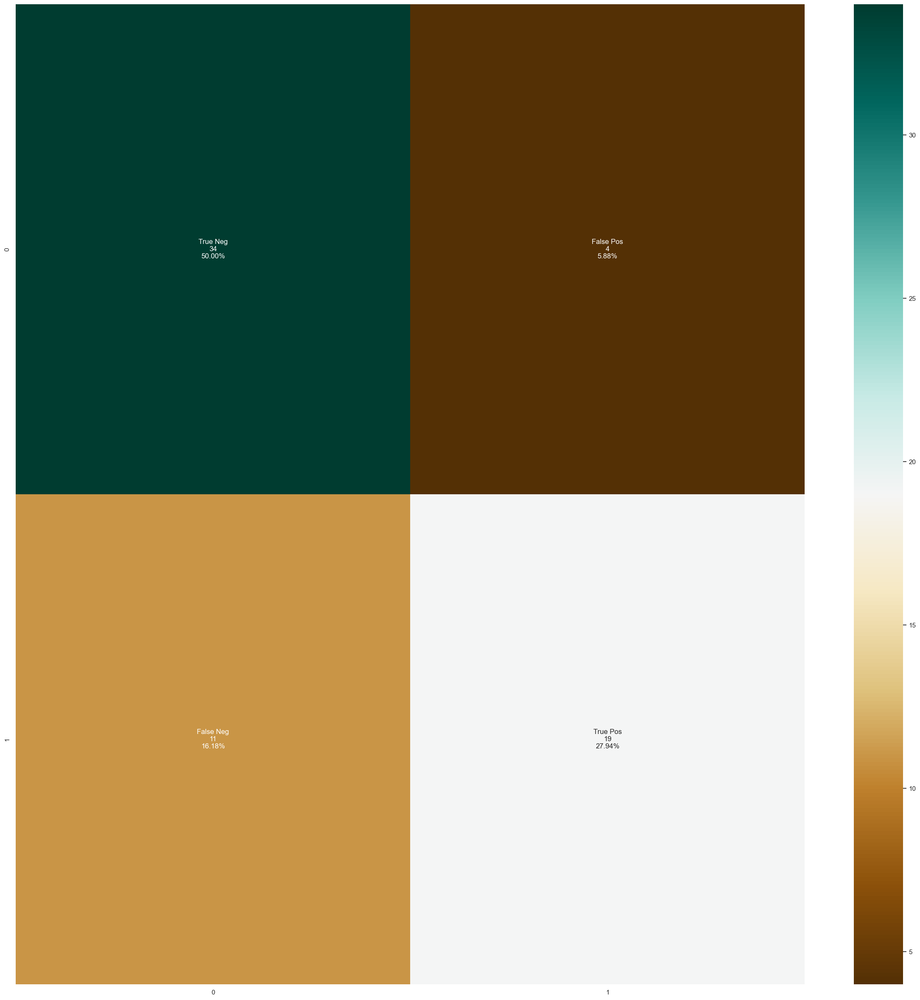

In [400]:
model_evaluation(classifier_randomsearch)

[Text(0.5, 0.8333333333333334, 'X[1] <= 0.833\ngini = 0.489\nsamples = 128\nvalue = [116, 86]'),
 Text(0.25, 0.5, 'X[0] <= 0.573\ngini = 0.234\nsamples = 67\nvalue = [83, 13]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.117\nsamples = 43\nvalue = [60, 4]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.404\nsamples = 24\nvalue = [23, 9]'),
 Text(0.75, 0.5, 'X[3] <= 0.167\ngini = 0.429\nsamples = 61\nvalue = [33, 73]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.486\nsamples = 30\nvalue = [28, 20]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.158\nsamples = 31\nvalue = [5, 53]')]

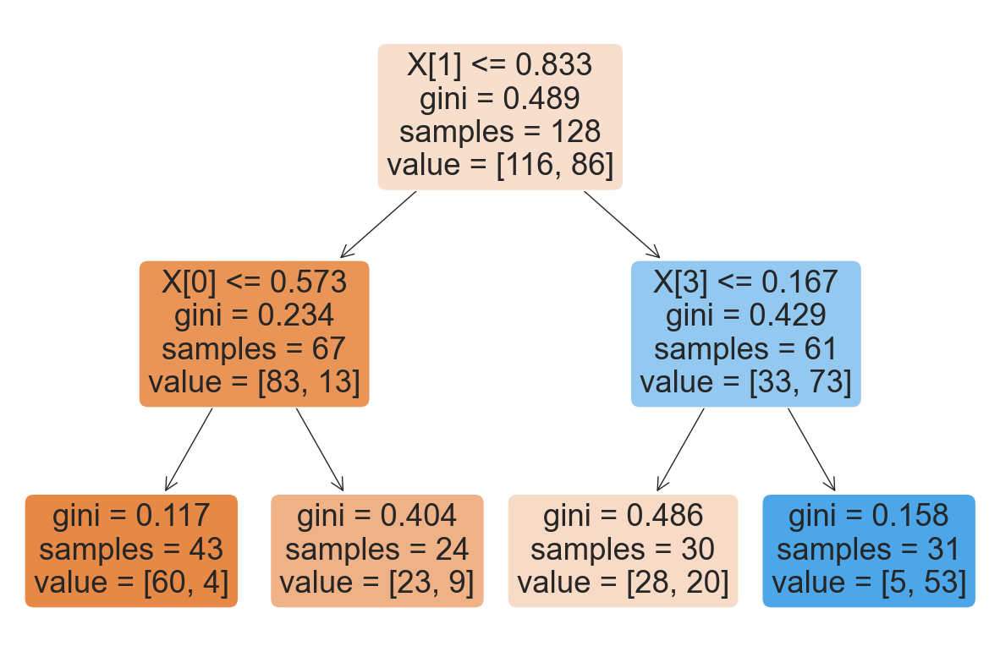

In [329]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

In [330]:
from sklearn.naive_bayes import GaussianNB

In [331]:
classifier_NB = GaussianNB()

Accuracy :  82.35%
Cross Validation Score :  88.57%
ROC_AUC Score :  81.05%


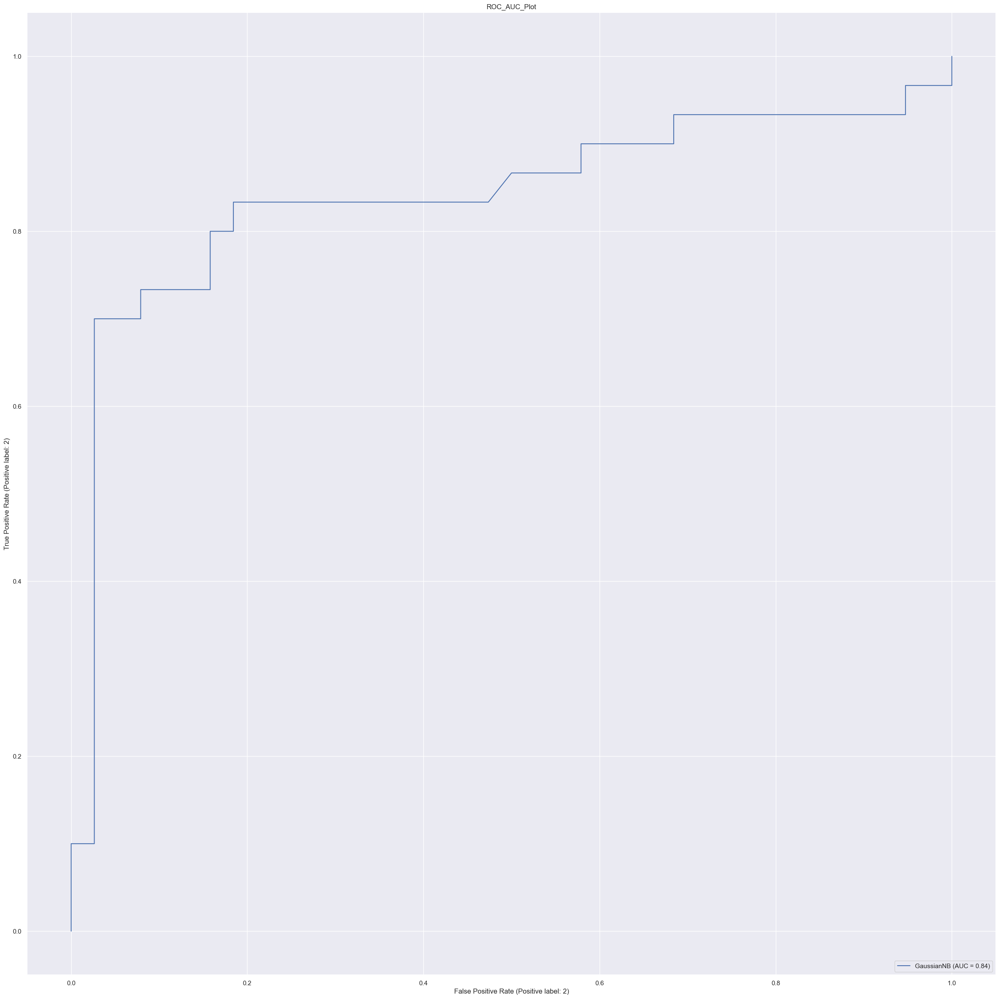

In [332]:
model(classifier_NB)

              precision    recall  f1-score   support

           1       0.80      0.92      0.85        38
           2       0.88      0.70      0.78        30

    accuracy                           0.82        68
   macro avg       0.84      0.81      0.82        68
weighted avg       0.83      0.82      0.82        68



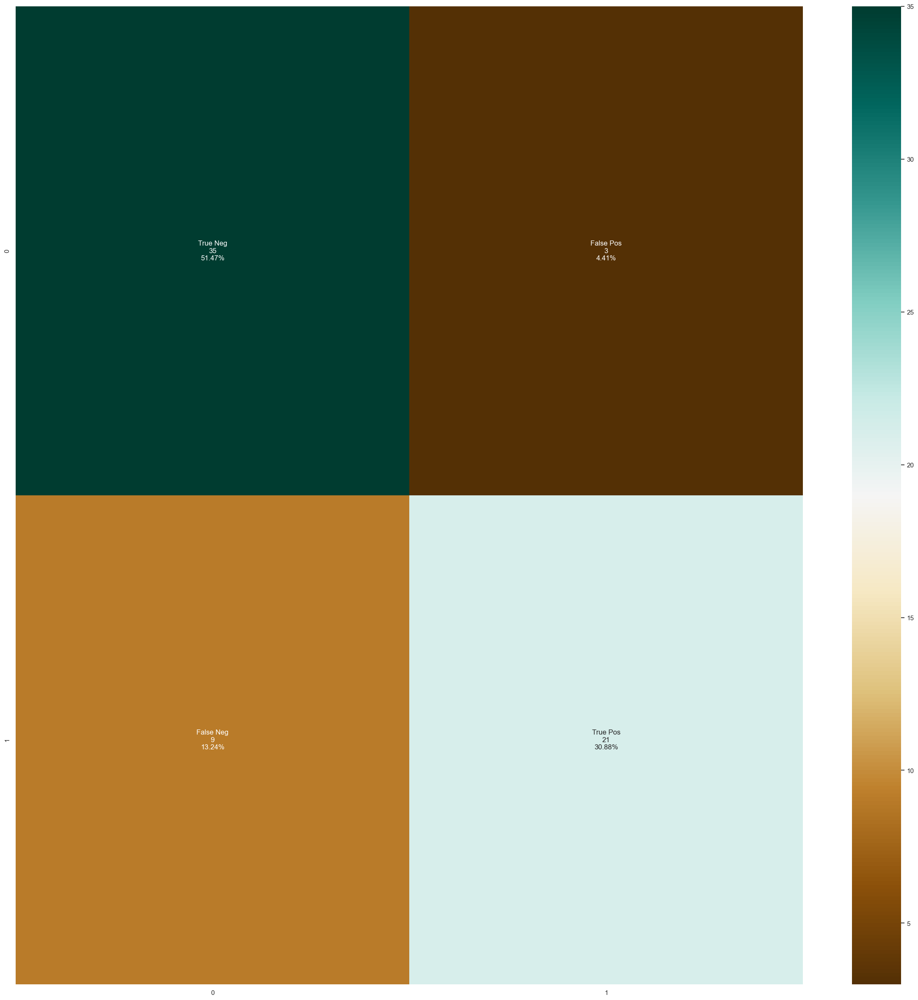

In [335]:
model_evaluation(classifier_NB)

In [369]:
gb = GradientBoostingClassifier(random_state = 10,min_samples_leaf=50,min_samples_split=30,learning_rate=0.3)
ab=AdaBoostClassifier()

In [348]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [358]:
parameters={'learning_rate': [0.1,0.9],
            'subsample':[0.1,0.9],
            'n_estimators':[1,100],
            'max_depth':[4,10],
            'min_samples_split':[50,140],
            'min_samples_leaf':[50,140]
           }

In [359]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [360]:
classifier_Gb.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(min_samples_leaf=50,
                                                  min_samples_split=10,
                                                  random_state=1),
             param_grid={'learning_rate': [0.1, 0.9], 'max_depth': [4, 10],
                         'min_samples_leaf': [50, 140],
                         'min_samples_split': [50, 140],
                         'n_estimators': [1, 100], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [361]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 50, 'min_samples_split': 140, 'n_estimators': 100, 'subsample': 0.9}


In [362]:
print(classifier_Gb.best_score_)

0.8405555555555556


In [363]:
##prediction
y_pred1=classifier_Gb.predict(Xtest)

In [364]:
score=accuracy_score(y_pred1,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8382352941176471
error rate is 0.16176470588235292


In [365]:
# imbalanced and via grid search
print(classification_report(y_pred1,Ytest))

              precision    recall  f1-score   support

           1       0.95      0.80      0.87        45
           2       0.70      0.91      0.79        23

    accuracy                           0.84        68
   macro avg       0.82      0.86      0.83        68
weighted avg       0.86      0.84      0.84        68



              precision    recall  f1-score   support

           1       0.80      0.95      0.87        38
           2       0.91      0.70      0.79        30

    accuracy                           0.84        68
   macro avg       0.86      0.82      0.83        68
weighted avg       0.85      0.84      0.83        68



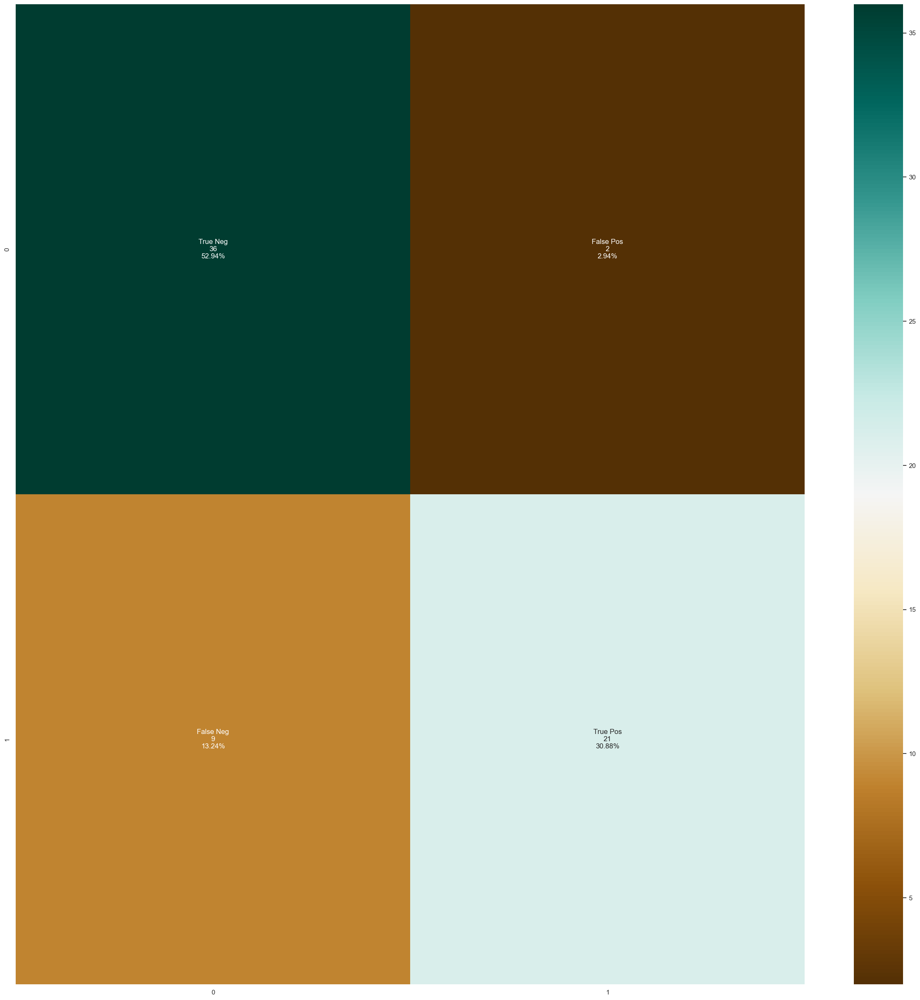

In [345]:
model_evaluation(classifier_Gb)

Accuracy :  82.35%
Cross Validation Score :  90.80%
ROC_AUC Score :  80.70%


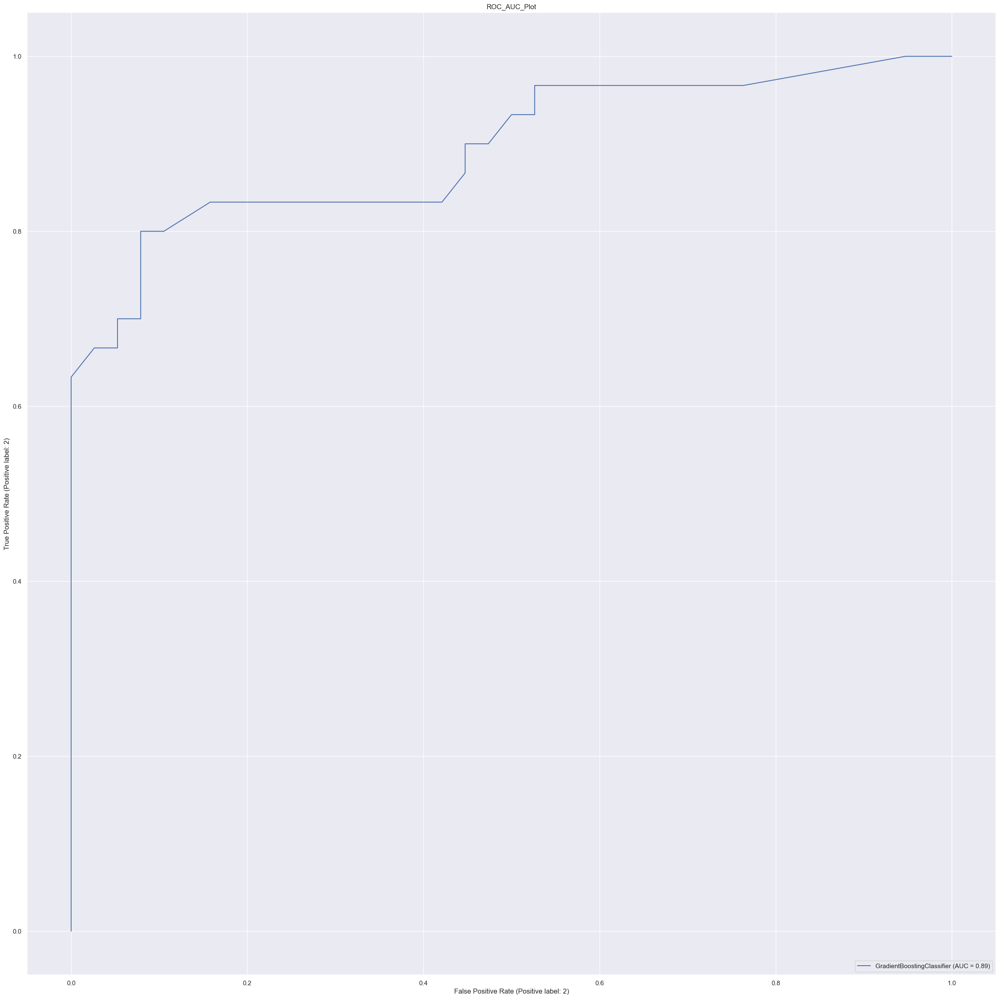

In [370]:
model(gb)

Accuracy :  77.94%
Cross Validation Score :  86.69%
ROC_AUC Score :  76.75%


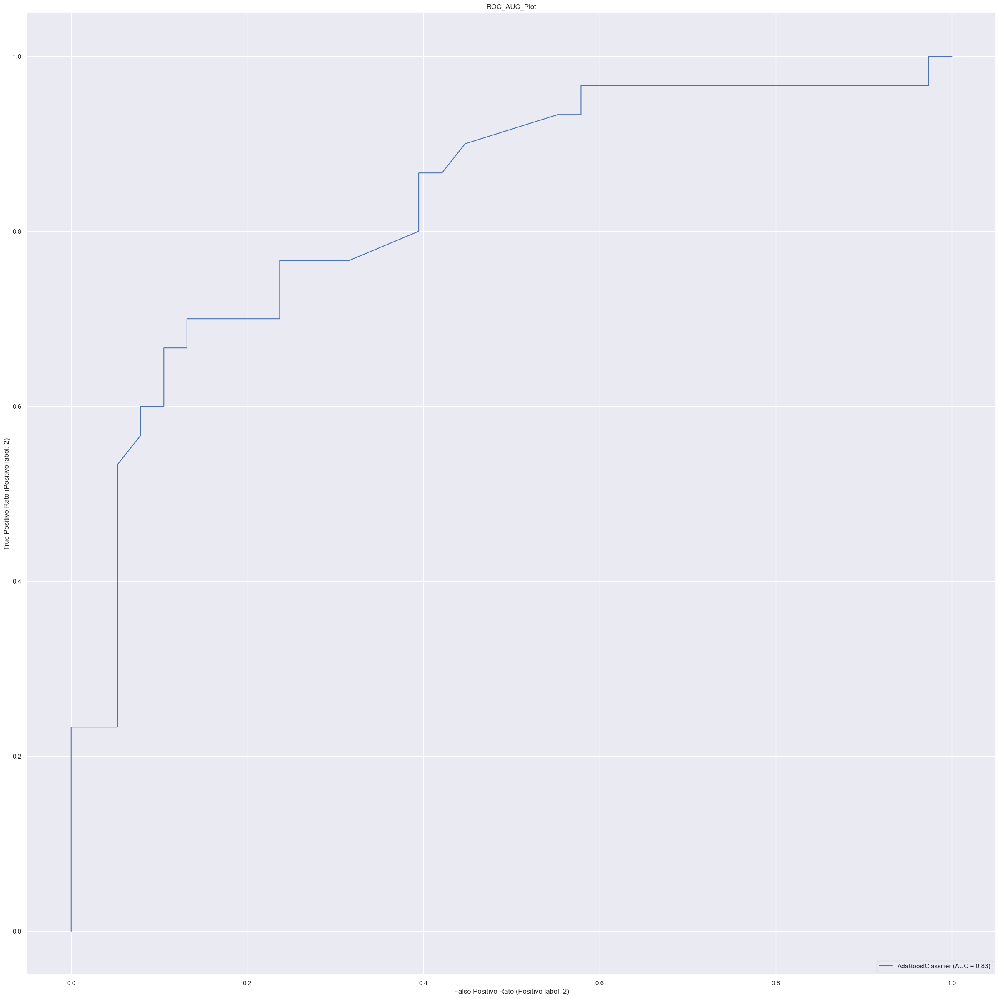

In [422]:
model(ab)

In [371]:
data=dataset[['age','sex','restecg','exang','target','ca','thal']].copy()
data_set=dataset[['cp','thal','oldpeak','exang','thalach','slope','ca','chol','target']].copy()

In [372]:
from sklearn.model_selection import train_test_split, GridSearchCV
xxx = data_set.drop('target', axis = 1)
YYY = data_set['target']
XXXtrain, XXXtest, YYYtrain, YYYtest = train_test_split(xxx, YYY, test_size = 0.25, stratify = YYY, random_state = 0)

In [373]:
xx = data.drop('target', axis = 1)
YY = data['target']
XXtrain, XXtest, YYtrain, YYtest = train_test_split(xx, YY, test_size = 0.25, stratify = YY, random_state = 0)

# Model creation after Forward Feature Selection

In [374]:
def model(classifier):
    
    classifier.fit(XXtrain,YYtrain)
    prediction = classifier.predict(XXtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(YYtest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,XXtrain,YYtrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(YYtest,prediction)))
    plot_roc_curve(classifier, XXtest,YYtest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(YYtest,classifier.predict(XXtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(YYtest,classifier.predict(XXtest)))



# defining model after feature selction from mutual information gain
def model(classifier):
    
    classifier.fit(XXXtrain,YYYtrain)
    prediction = classifier.predict(XXtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(YYYtest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,XXXtrain,YYYtrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(YYYtest,prediction)))
    plot_roc_curve(classifier, XXXtest,YYYtest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(YYYtest,classifier.predict(XXXtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(YYtest,classifier.predict(XXtest)))



# 1.Logistic Regression

In [460]:
# normal logistic regression
classifier_lr = LogisticRegression(random_state = 1,C=1000,class_weight='balanced')

In [449]:
# Classification for GridSearchCV
classifier=LogisticRegression(random_state = 4,C=100,penalty= 'l2',solver='newton-cg')

In [450]:
parameter={'penalty':['l1','l2','elasticnet'],'C':[1,2,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [451]:
classifier_regressor=GridSearchCV(classifier_lr,param_grid=parameter,scoring='accuracy',cv=cv)

In [452]:
classifier_regressor.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=100, class_weight='balanced',
                                          random_state=1),
             param_grid={'C': [1, 2, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [453]:
print(classifier_regressor.best_params_)

{'C': 10, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [454]:
print(classifier_regressor.best_score_)

0.8419047619047618


In [455]:
##prediction
y_pred=classifier_regressor.predict(XXtest)

In [456]:
score=accuracy_score(y_pred,YYtest)
print(score)

0.7941176470588235


In [457]:
# imbalanced and via grid search
print(classification_report(y_pred,YYtest))

              precision    recall  f1-score   support

           1       0.79      0.83      0.81        36
           2       0.80      0.75      0.77        32

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.79      0.79      0.79        68



Accuracy :  82.35%
Cross Validation Score :  88.15%
ROC_AUC Score :  82.11%


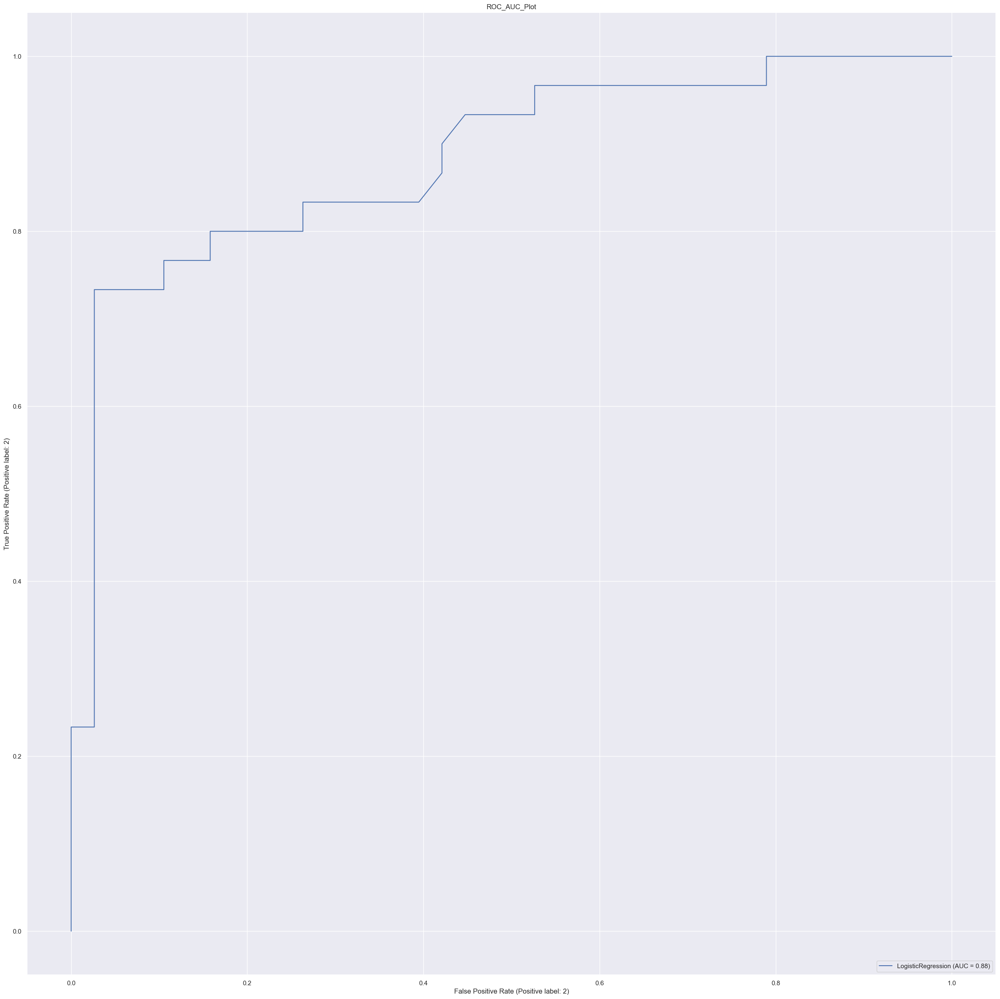

In [458]:
#not balanced and without grid search hyperparameters
model(classifier)

Accuracy :  79.41%
Cross Validation Score :  88.09%
ROC_AUC Score :  79.47%


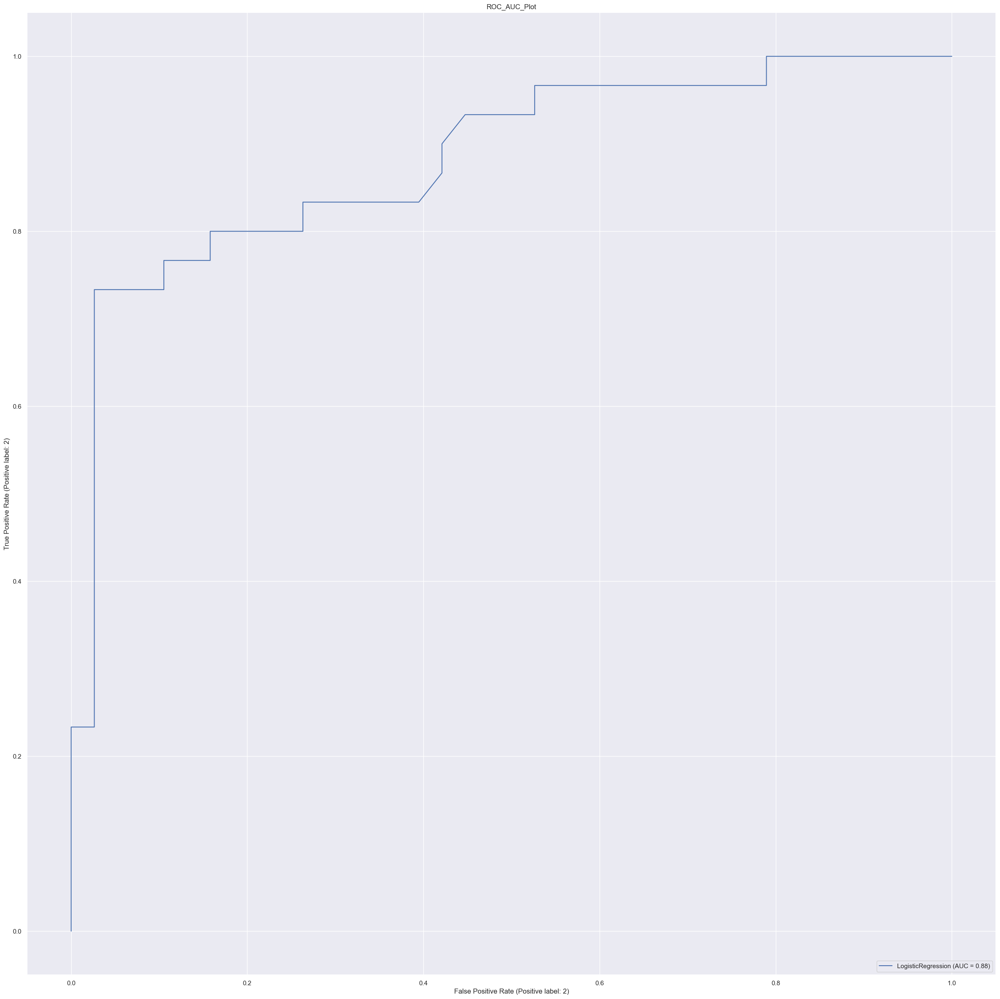

In [461]:
# balanced but without GridSearchCV hyperparameters
model(classifier_lr)

              precision    recall  f1-score   support

           1       0.83      0.79      0.81        38
           2       0.75      0.80      0.77        30

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.80      0.79      0.79        68



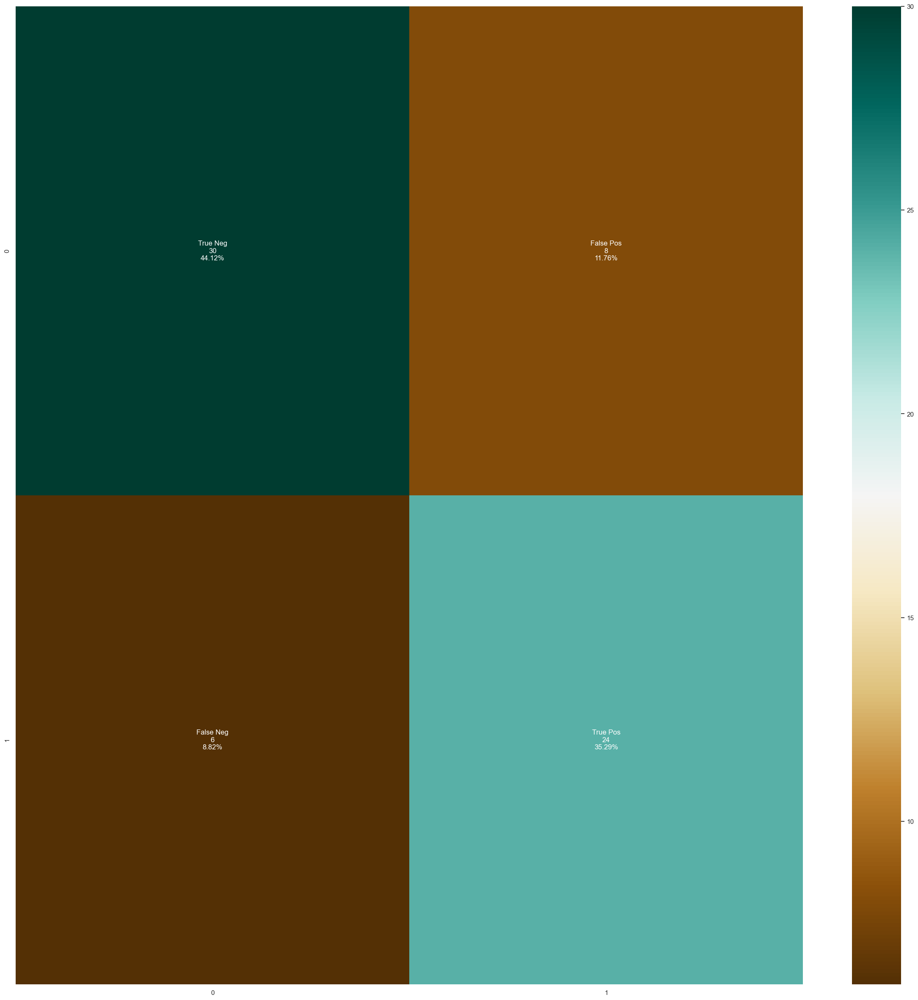

In [407]:
#Report generated after classifier without gridsearchcv 
model_evaluation(classifier_lr)

              precision    recall  f1-score   support

           1       0.84      0.84      0.84        38
           2       0.80      0.80      0.80        30

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68



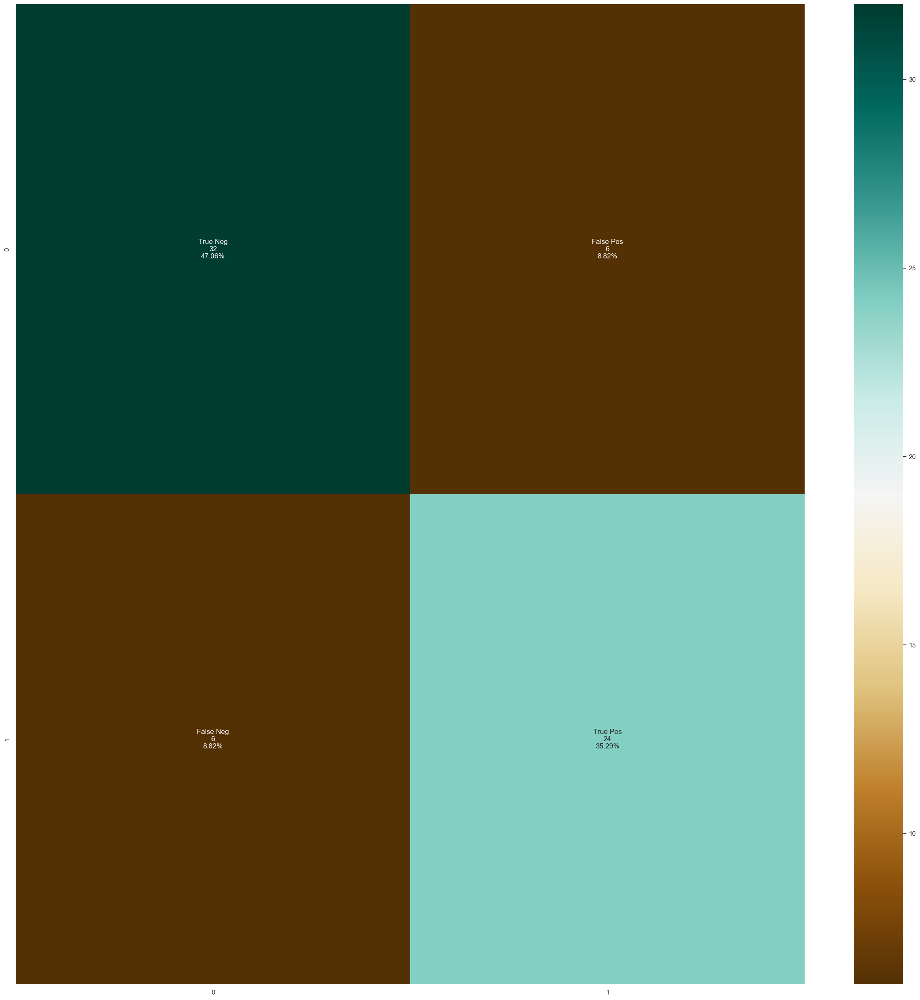

In [408]:
model_evaluation(classifier)

# 2.Decision Tree Classifier

In [462]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1, class_weight='balanced')

In [463]:
classifier1=DecisionTreeClassifier()

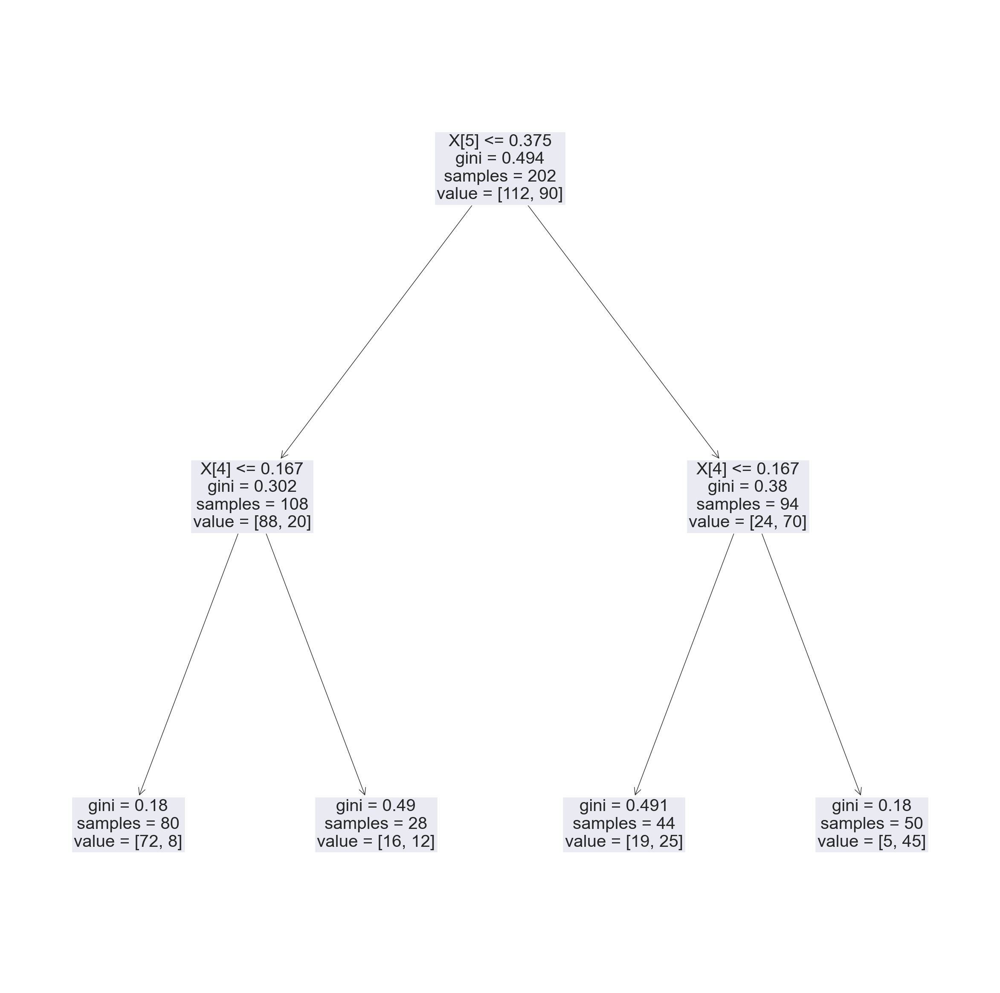

<Figure size 10000x10000 with 0 Axes>

<Figure size 10000x10000 with 0 Axes>

In [464]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(XXtrain,YYtrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=29)
plt.show()
plt.figure(figsize=(100,100))

In [465]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [475]:
classifier_decisiontree=GridSearchCV(classifier_dtbalanced,param_grid=parameter1,scoring='accuracy',cv=cv)

In [476]:
classifier_decisiontree.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=4, random_state=1000),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [477]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'random'}


In [478]:
print(classifier_decisiontree.best_score_)

0.7841269841269842


In [479]:
##prediction
y_pred1=classifier_decisiontree.predict(XXtest)

In [480]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.7941176470588235
error rate is 0.20588235294117652


In [481]:
# imbalanced and via grid search
print(classification_report(y_pred1,YYtest))

              precision    recall  f1-score   support

           1       0.84      0.80      0.82        40
           2       0.73      0.79      0.76        28

    accuracy                           0.79        68
   macro avg       0.79      0.79      0.79        68
weighted avg       0.80      0.79      0.80        68



Accuracy :  85.29%
Cross Validation Score :  78.55%
ROC_AUC Score :  84.39%


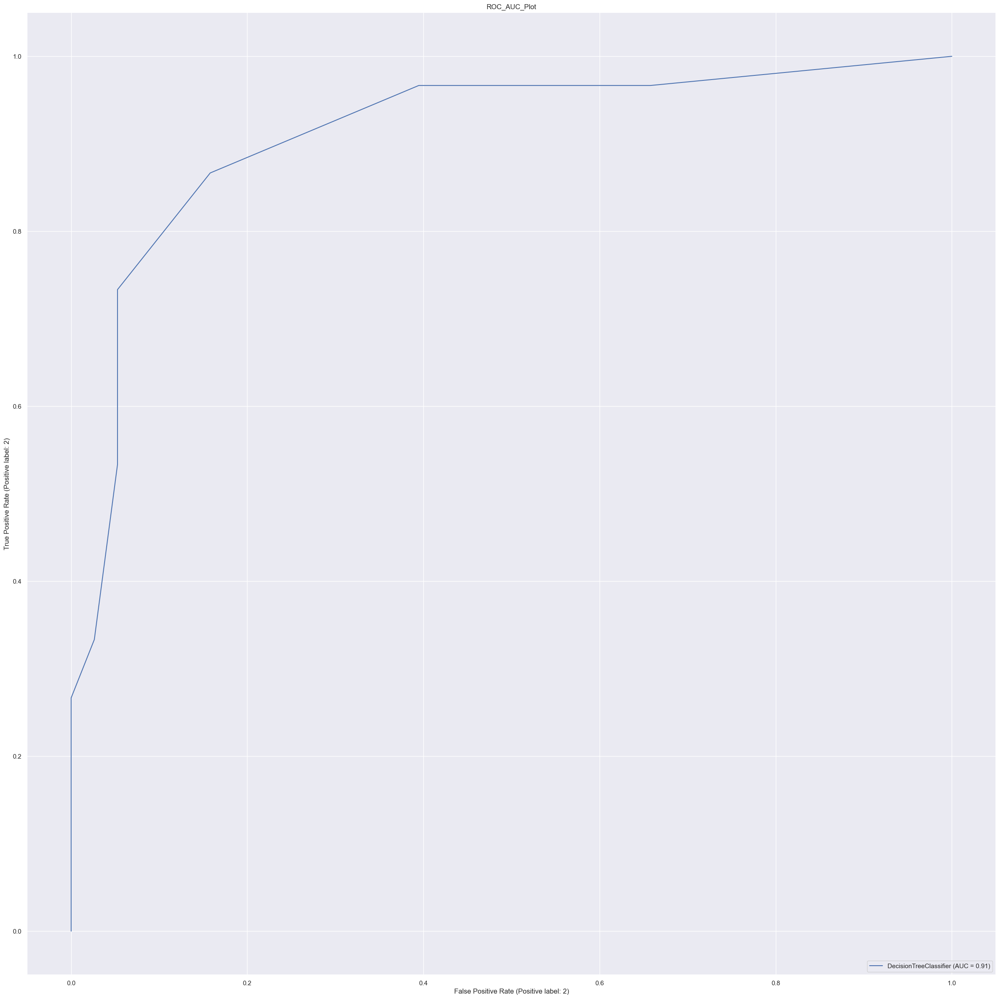

In [473]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  75.00%
Cross Validation Score :  72.81%
ROC_AUC Score :  73.77%


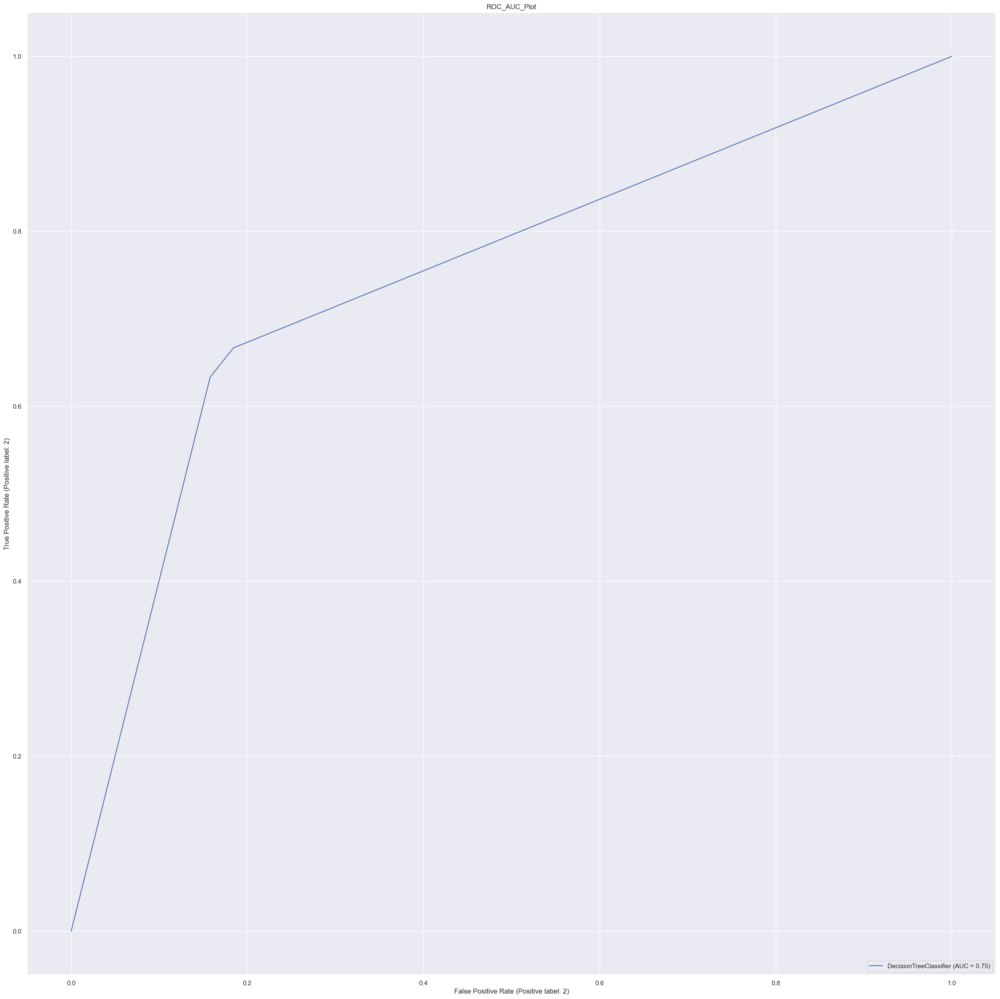

In [474]:
#not balanced and without grid search hyperparameters
model(classifier1)

              precision    recall  f1-score   support

           1       0.74      0.76      0.75        38
           2       0.69      0.67      0.68        30

    accuracy                           0.72        68
   macro avg       0.72      0.71      0.72        68
weighted avg       0.72      0.72      0.72        68



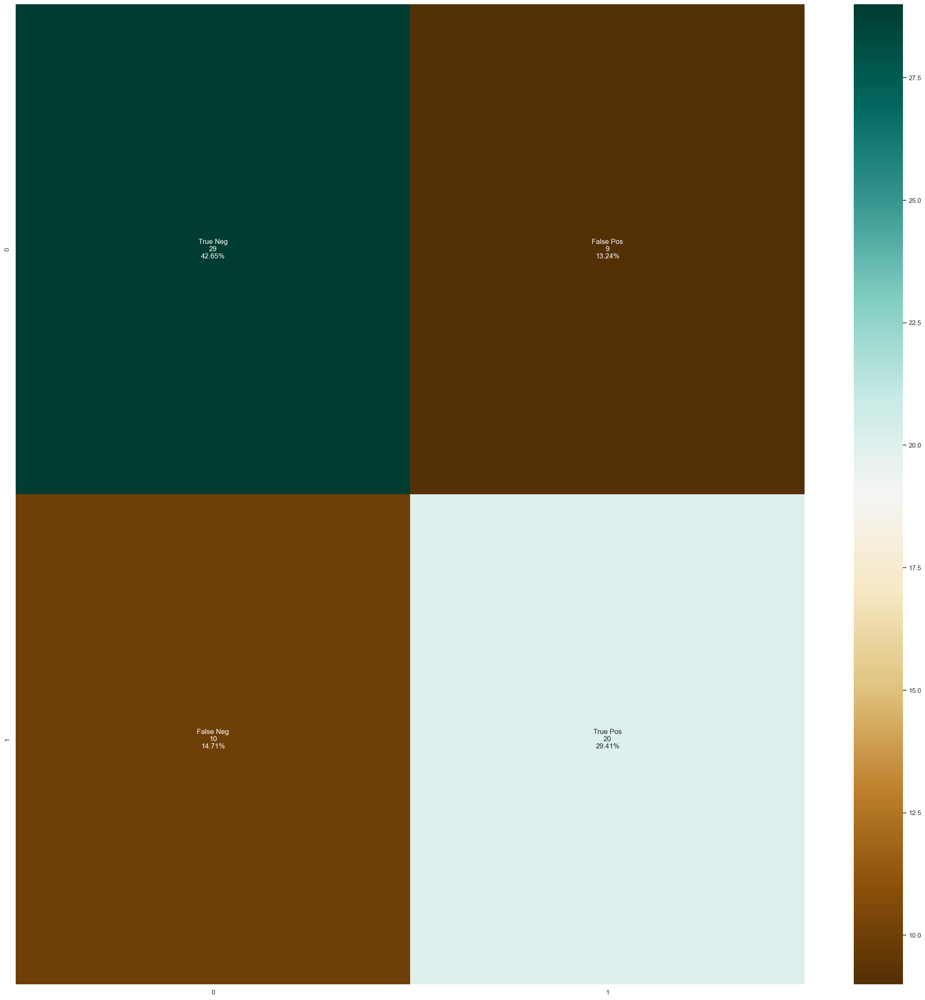

In [455]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

              precision    recall  f1-score   support

           1       0.73      0.79      0.76        38
           2       0.70      0.63      0.67        30

    accuracy                           0.72        68
   macro avg       0.72      0.71      0.71        68
weighted avg       0.72      0.72      0.72        68



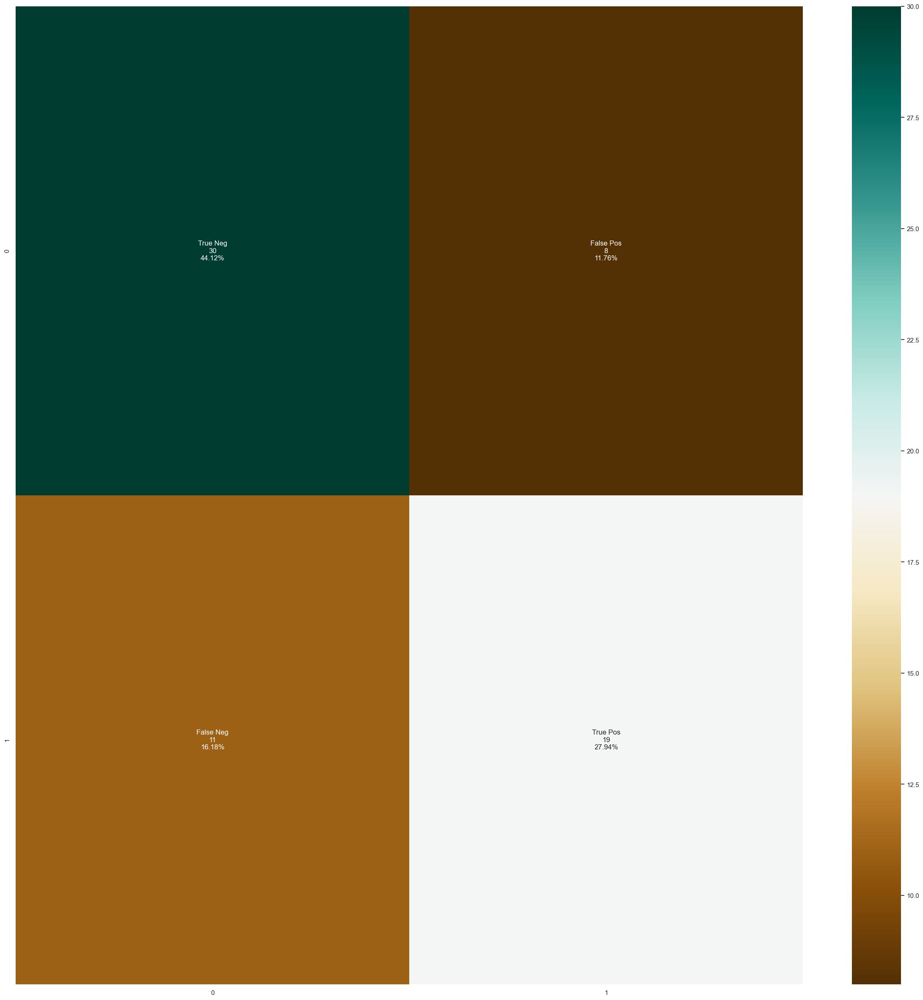

In [456]:
# not balanced and without grid searchtree 
model_evaluation(classifier1)

              precision    recall  f1-score   support

           1       0.85      0.74      0.79        38
           2       0.71      0.83      0.77        30

    accuracy                           0.78        68
   macro avg       0.78      0.79      0.78        68
weighted avg       0.79      0.78      0.78        68



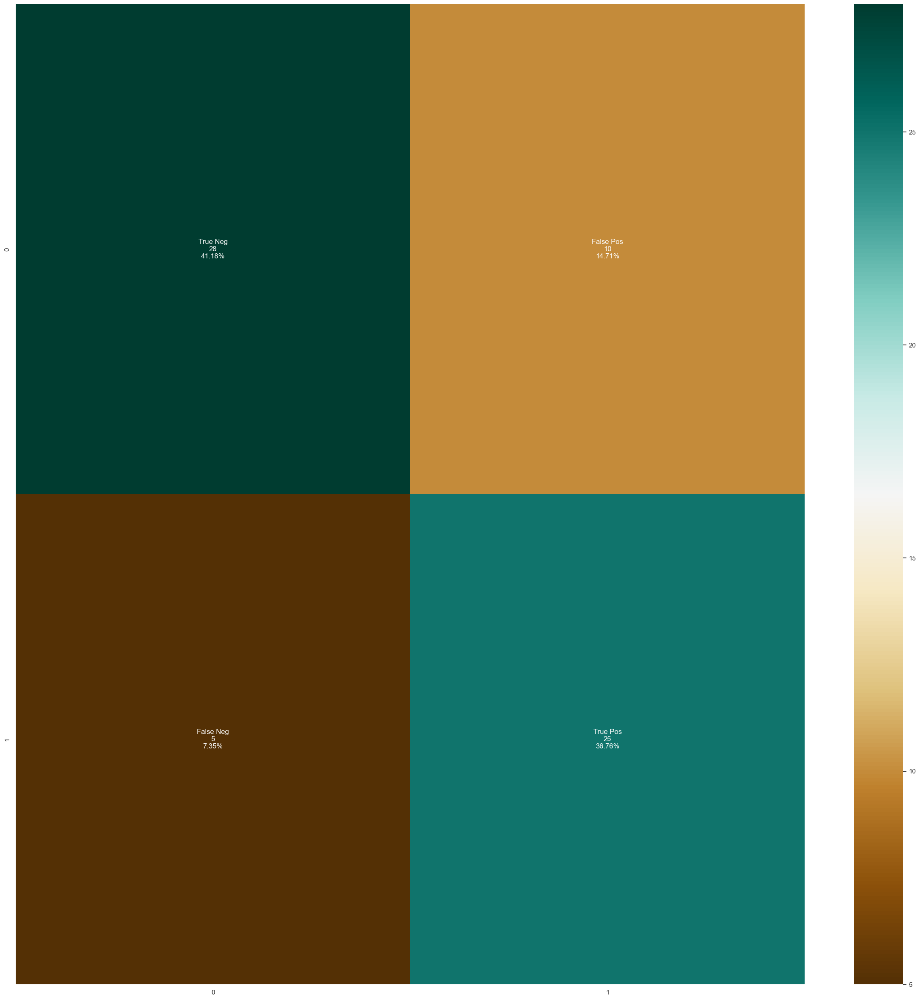

In [457]:
# balanced but not gridsearch applied
model_evaluation(classifier_dtbalanced)

# 3. Super Vector Classifier

In [485]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 100,class_weight='balanced')

In [492]:
classifier_svc = SVC(kernel = 'linear',C = 100)

In [503]:
parameter2 ={'C':[10, 100,50,150],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [504]:
classifier_supervector=GridSearchCV(classifier_svcbalanced,param_grid=parameter2,scoring='accuracy',cv=cv)

In [505]:
classifier_supervector.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=100, class_weight='balanced', kernel='linear'),
             param_grid={'C': [10, 100, 50, 150], 'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [506]:
print(classifier_supervector.best_params_)

{'C': 150, 'gamma': 0.0001, 'kernel': 'rbf'}


In [507]:
##prediction
y_pred2=classifier_supervector.predict(XXtest)

In [508]:
print(classifier_supervector.best_score_)

0.8106349206349208


In [509]:
score=accuracy_score(y_pred2,YYtest)
error=1-accuracy_score(y_pred2,YYtest)
print(score)
print(error)

0.7794117647058824
0.22058823529411764


In [510]:
# imbalanced and via grid search
print(classification_report(y_pred2,YYtest))

              precision    recall  f1-score   support

           1       0.82      0.79      0.81        39
           2       0.73      0.76      0.75        29

    accuracy                           0.78        68
   macro avg       0.77      0.78      0.78        68
weighted avg       0.78      0.78      0.78        68



Accuracy :  77.94%
Cross Validation Score :  87.29%
ROC_AUC Score :  77.81%


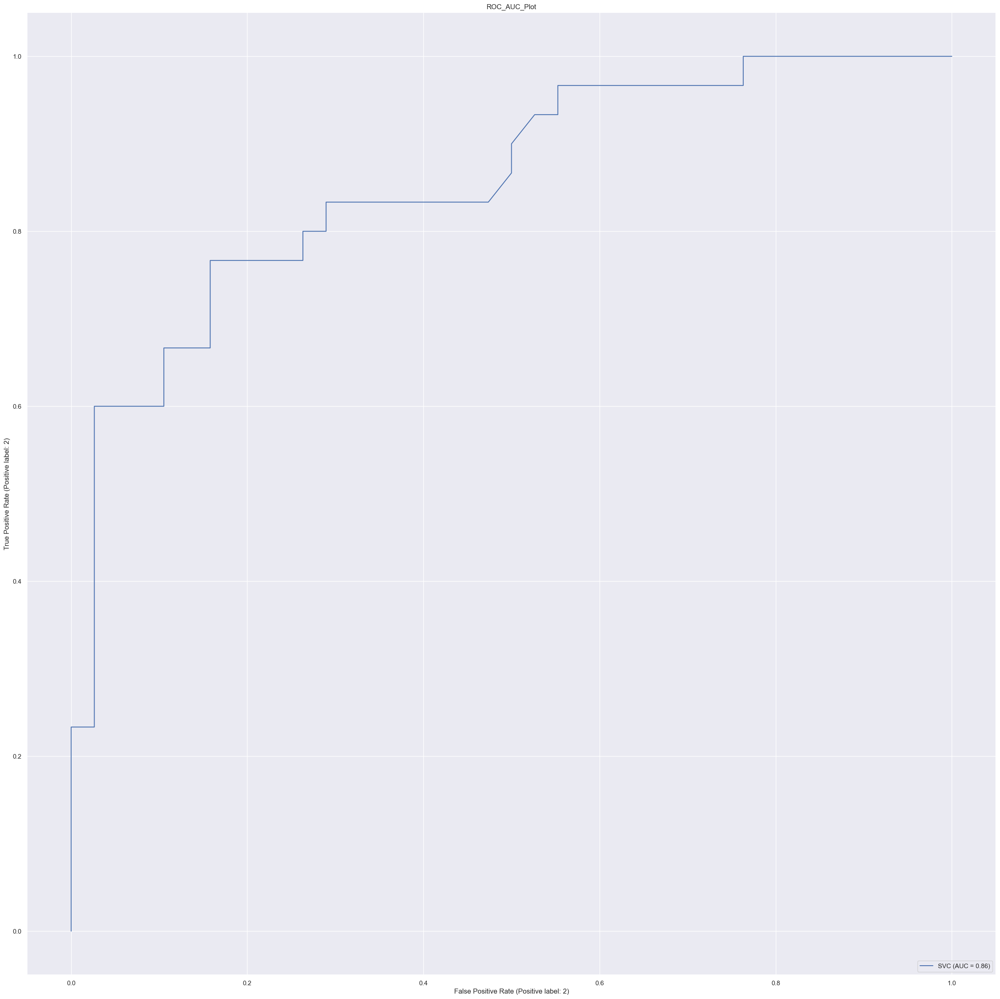

In [511]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

Accuracy :  82.35%
Cross Validation Score :  87.81%
ROC_AUC Score :  81.75%


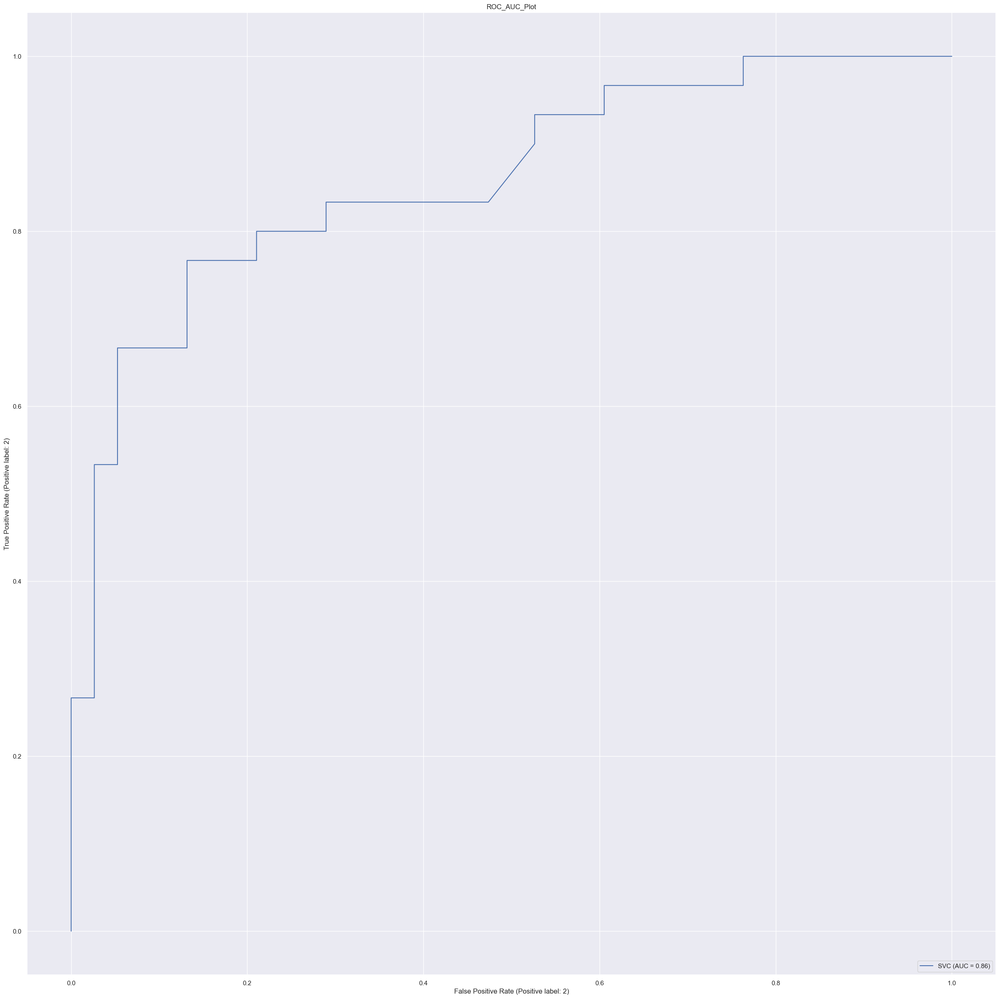

In [493]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

              precision    recall  f1-score   support

           1       0.81      0.79      0.80        38
           2       0.74      0.77      0.75        30

    accuracy                           0.78        68
   macro avg       0.78      0.78      0.78        68
weighted avg       0.78      0.78      0.78        68



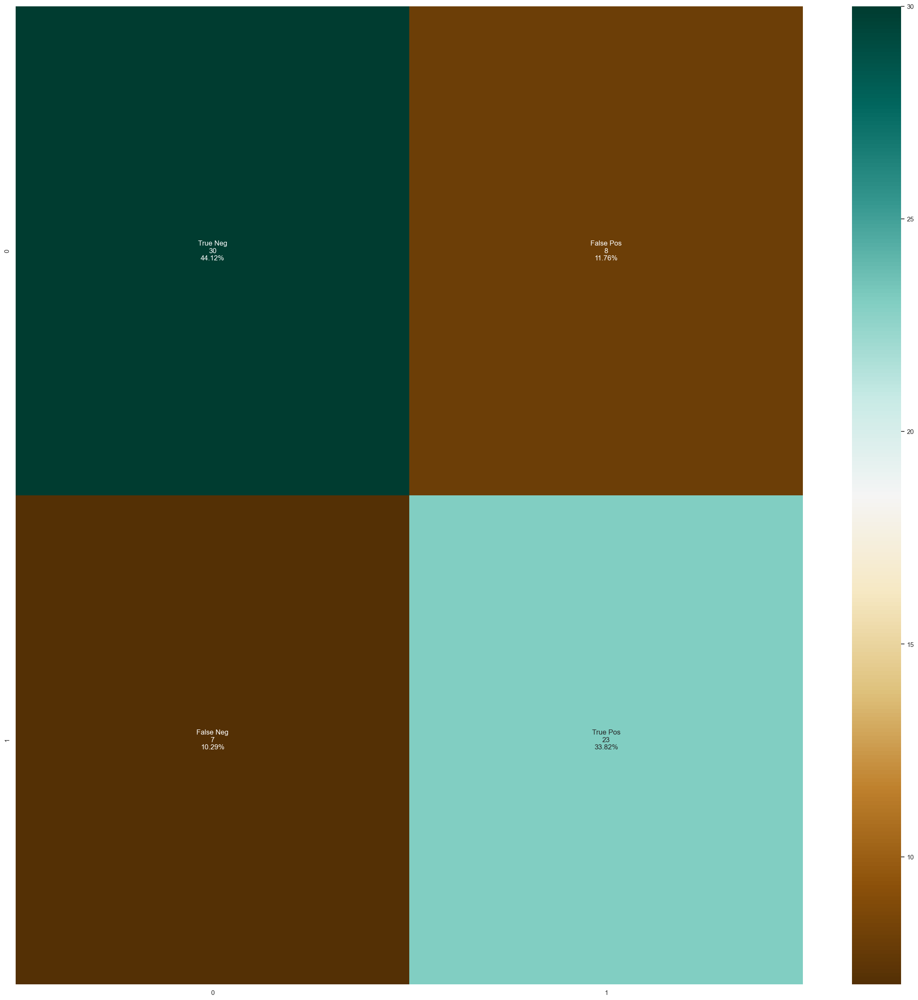

In [502]:
model_evaluation(classifier_svcbalanced)

              precision    recall  f1-score   support

           1       0.76      0.82      0.78        38
           2       0.74      0.67      0.70        30

    accuracy                           0.75        68
   macro avg       0.75      0.74      0.74        68
weighted avg       0.75      0.75      0.75        68



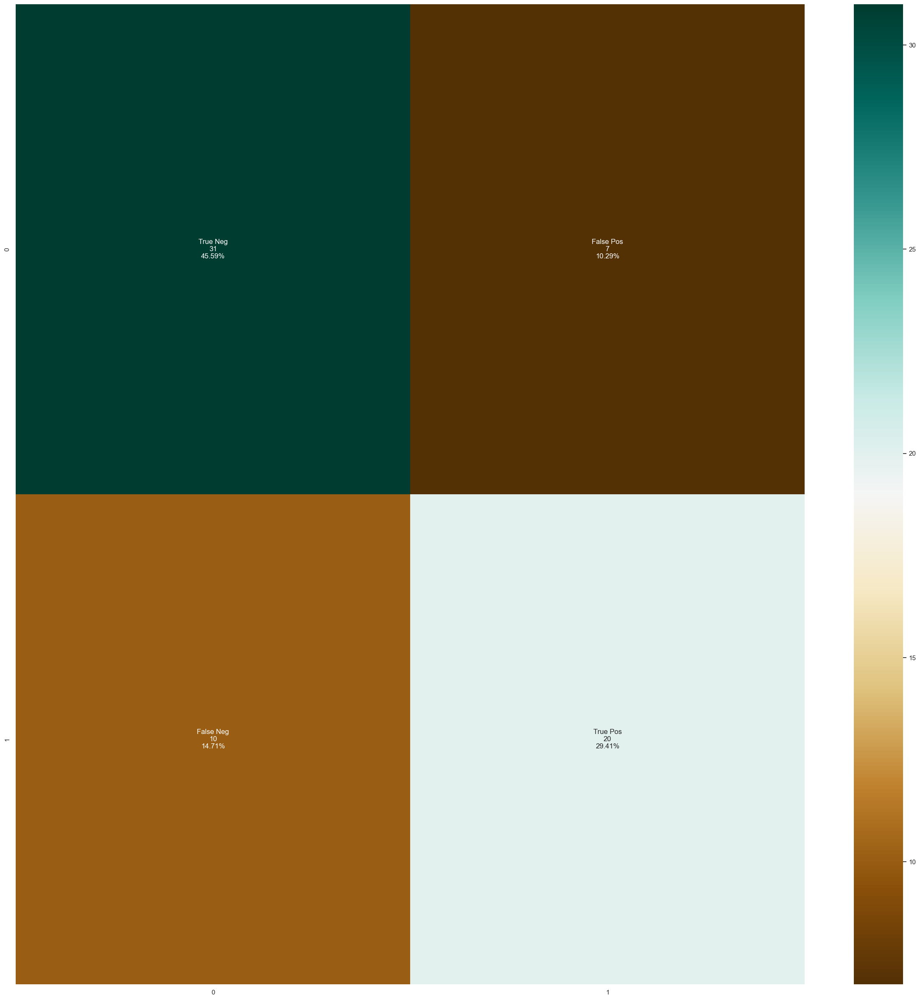

In [474]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           1       0.79      0.82      0.81        38
           2       0.76      0.73      0.75        30

    accuracy                           0.78        68
   macro avg       0.78      0.77      0.78        68
weighted avg       0.78      0.78      0.78        68



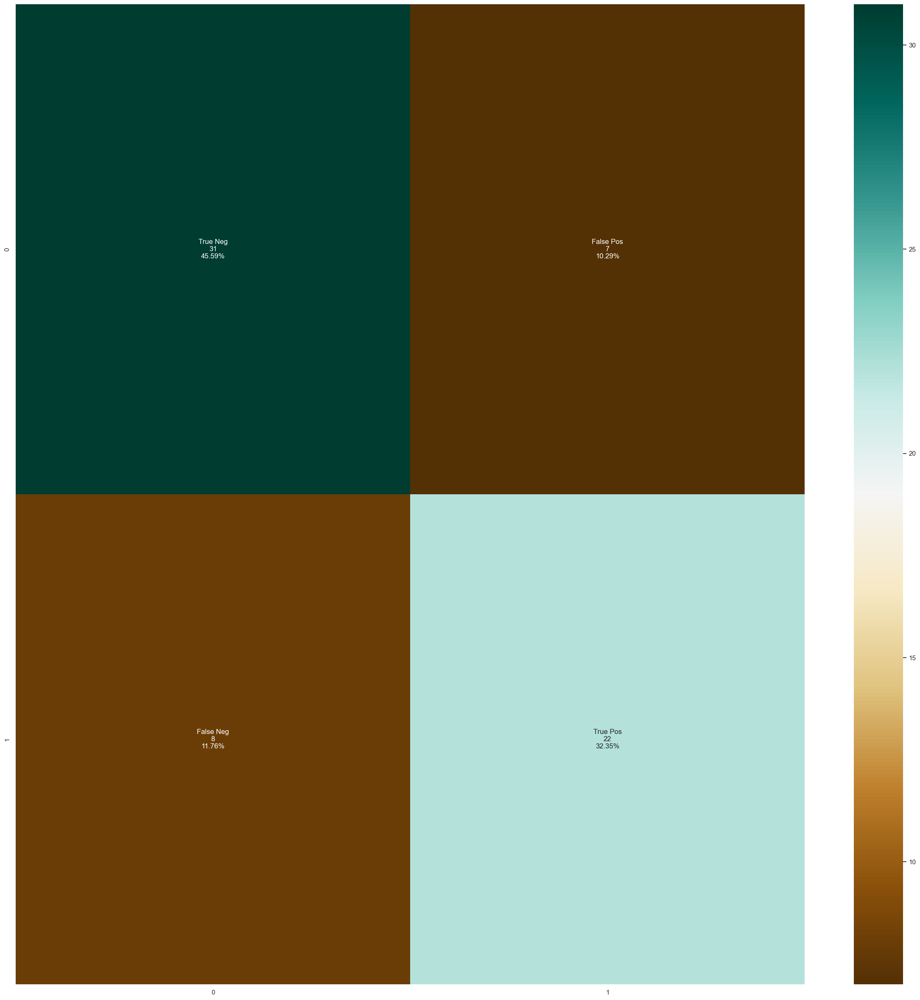

In [475]:
model_evaluation(classifier_supervector)

# 4. Random Forest Classifier

In [527]:
classifier_rf = RandomForestClassifier()

In [513]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,random_state = 0,class_weight='balanced')

In [514]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [515]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [516]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(XXtrain,YYtrain)

RandomForestClassifier(max_depth=2)

In [529]:
classifier_randomsearch=GridSearchCV(classifier_rfbalanced,param_grid,scoring='accuracy',cv=cv)

In [530]:
classifier_randomsearch.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [531]:
print(classifier_randomsearch.best_params_)

{'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2}


In [532]:
##prediction
y_pred2=classifier_randomsearch.predict(XXtest)

In [533]:
print(classifier_randomsearch.best_score_)

0.8075396825396826


In [534]:
score=accuracy_score(y_pred2,YYtest)
print(score)

0.8382352941176471


In [536]:
# imbalanced and via grid search
print(classification_report(y_pred2,YYtest))

              precision    recall  f1-score   support

           1       0.87      0.85      0.86        39
           2       0.80      0.83      0.81        29

    accuracy                           0.84        68
   macro avg       0.83      0.84      0.84        68
weighted avg       0.84      0.84      0.84        68



Accuracy :  83.82%
Cross Validation Score :  88.67%
ROC_AUC Score :  83.42%


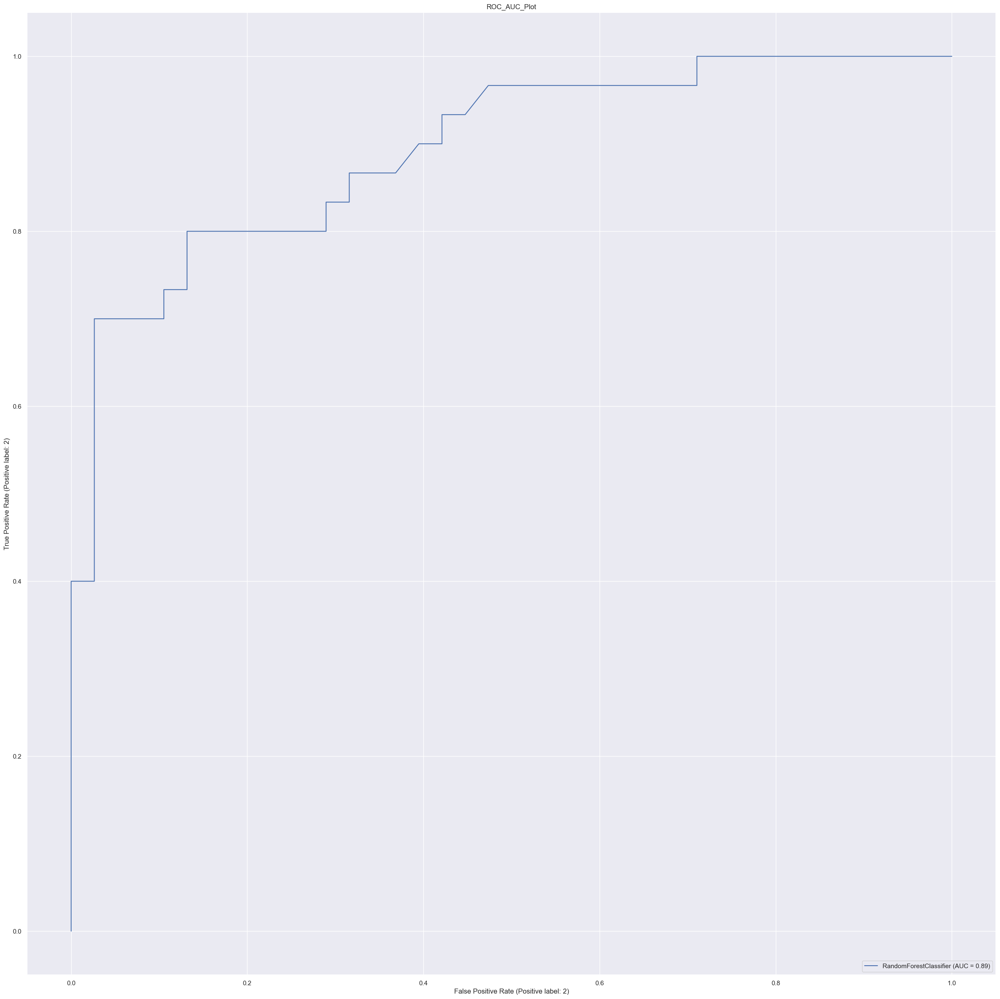

In [537]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  76.47%
Cross Validation Score :  86.53%
ROC_AUC Score :  76.14%


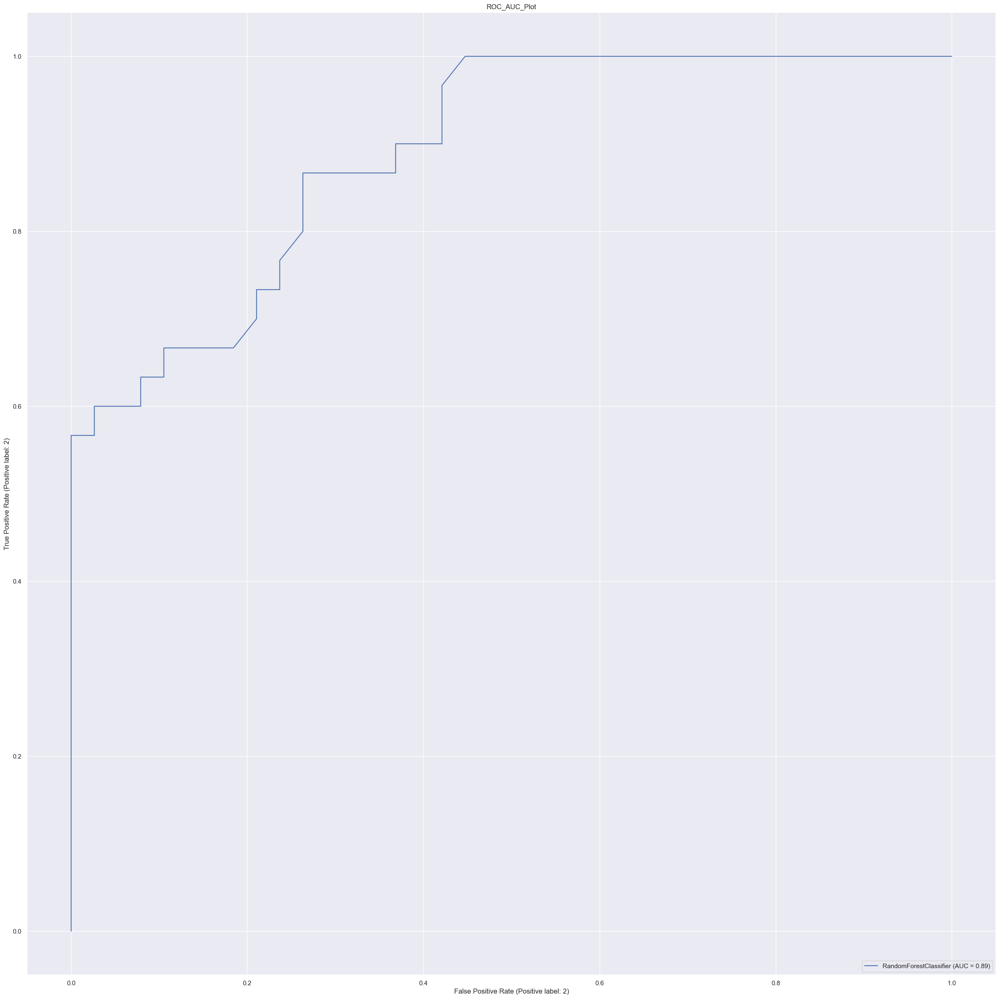

In [538]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           1       0.85      0.87      0.86        38
           2       0.83      0.80      0.81        30

    accuracy                           0.84        68
   macro avg       0.84      0.83      0.84        68
weighted avg       0.84      0.84      0.84        68



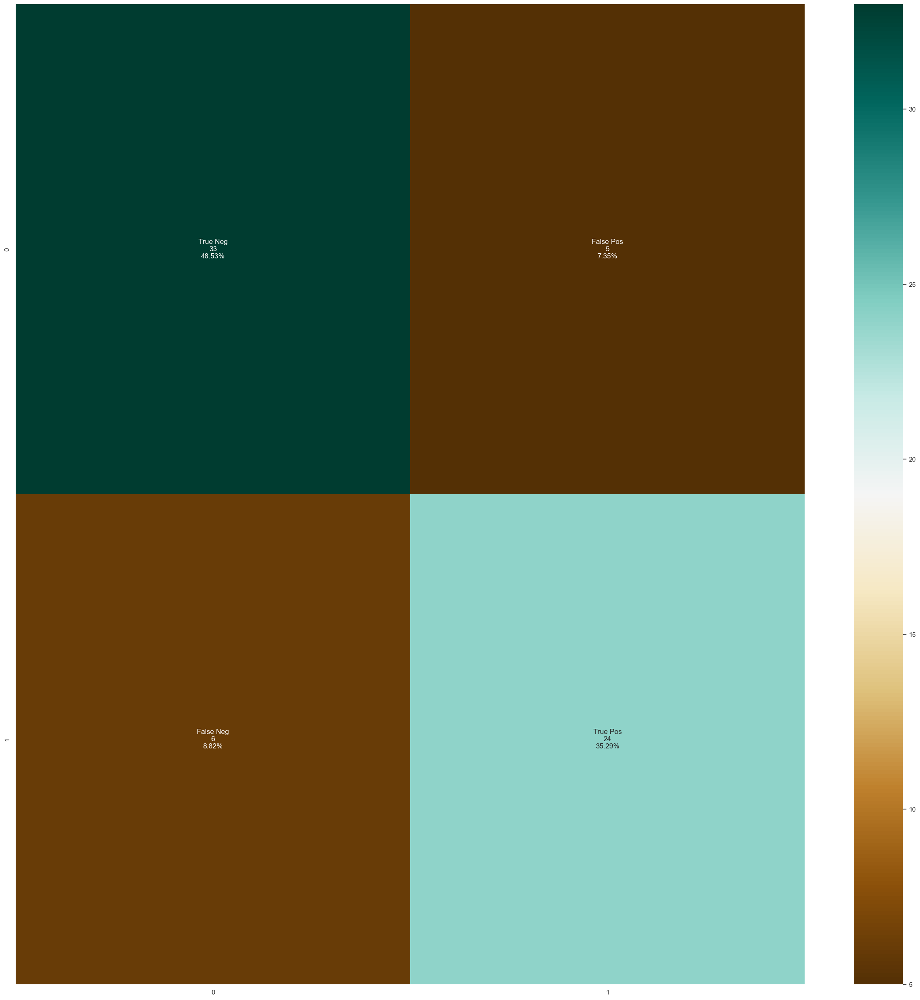

In [539]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           1       0.82      0.87      0.85        38
           2       0.82      0.77      0.79        30

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68



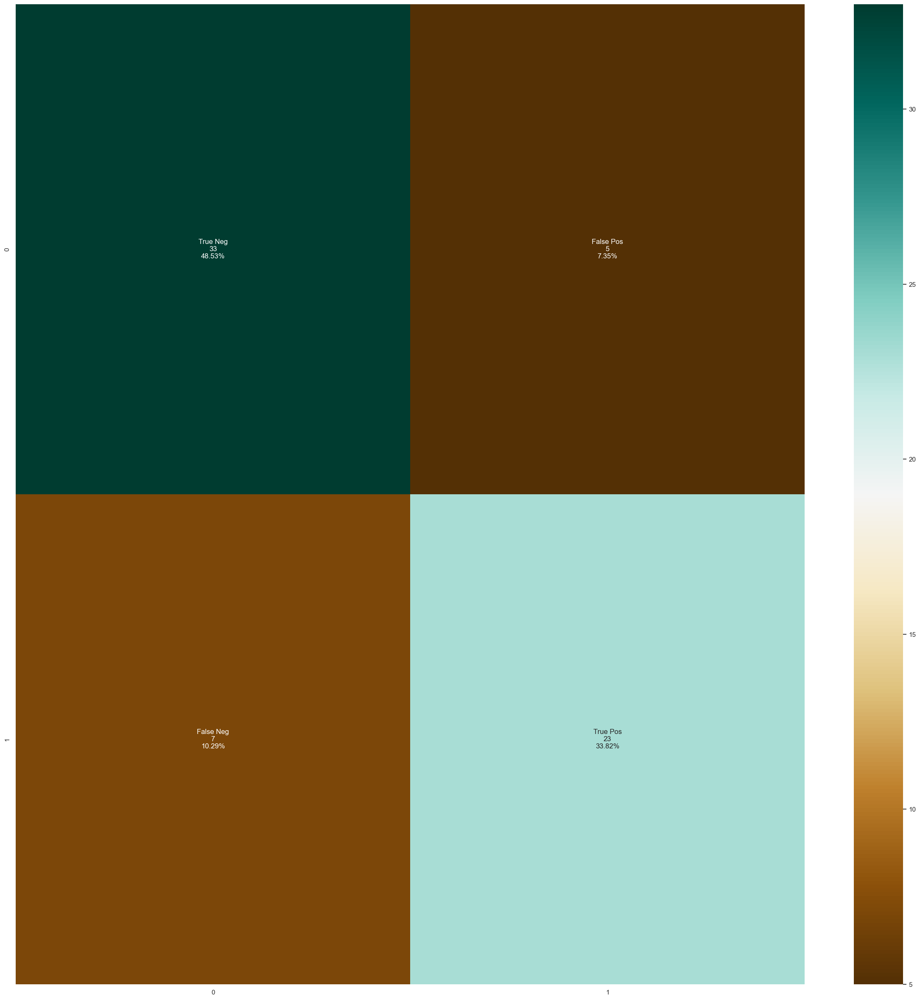

In [526]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           1       0.77      0.87      0.81        38
           2       0.80      0.67      0.73        30

    accuracy                           0.78        68
   macro avg       0.78      0.77      0.77        68
weighted avg       0.78      0.78      0.78        68



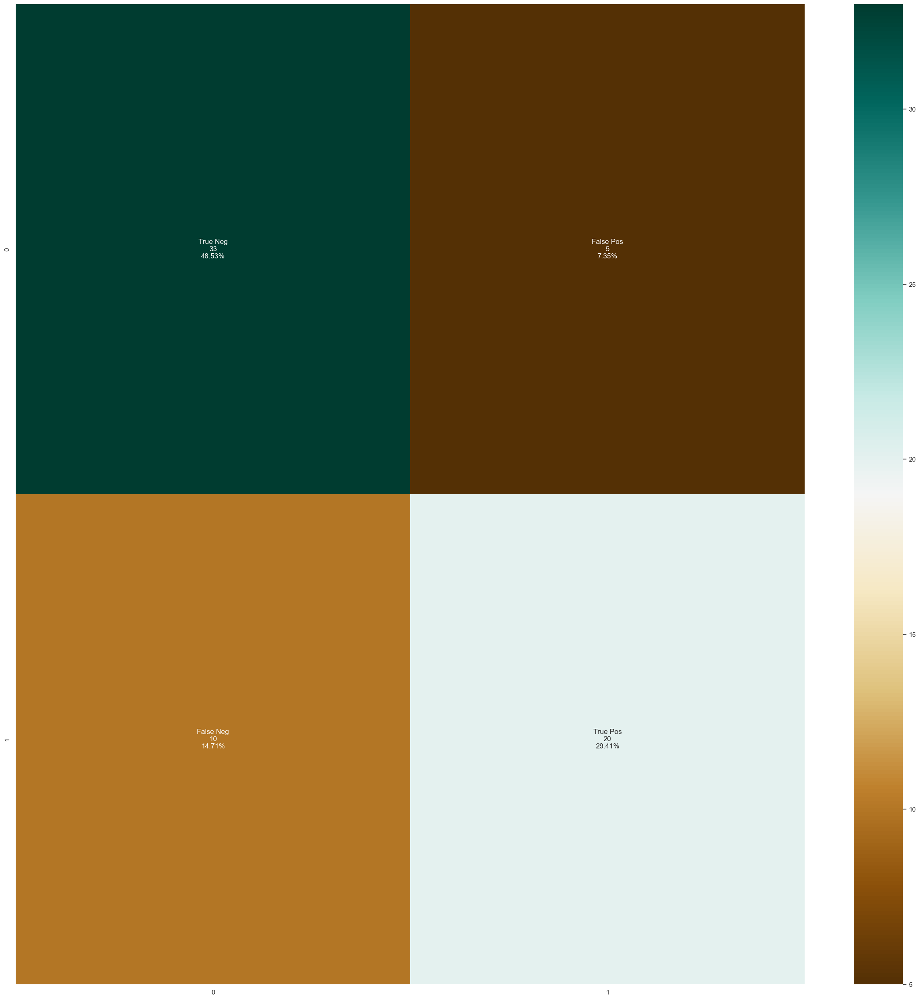

In [492]:
model_evaluation(classifier_randomsearch)

[Text(0.5, 0.8333333333333334, 'X[5] <= 0.375\ngini = 0.498\nsamples = 129\nvalue = [107, 95]'),
 Text(0.25, 0.5, 'X[1] <= 0.5\ngini = 0.329\nsamples = 68\nvalue = [80, 21]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.293\nsamples = 39\nvalue = [46, 10]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.369\nsamples = 29\nvalue = [34, 11]'),
 Text(0.75, 0.5, 'X[0] <= 0.274\ngini = 0.392\nsamples = 61\nvalue = [27, 74]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.49\nsamples = 37\nvalue = [25, 33]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.089\nsamples = 24\nvalue = [2, 41]')]

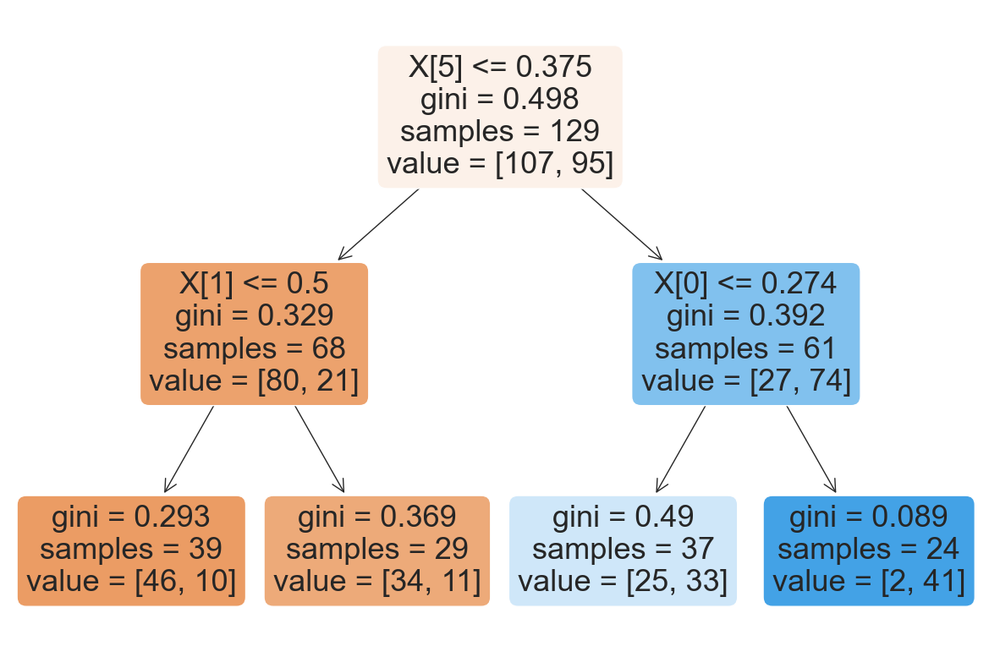

In [493]:
fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

# 5. Naive Bayes

In [540]:
classifier_NB = GaussianNB()

Accuracy :  76.47%
Cross Validation Score :  88.59%
ROC_AUC Score :  76.14%


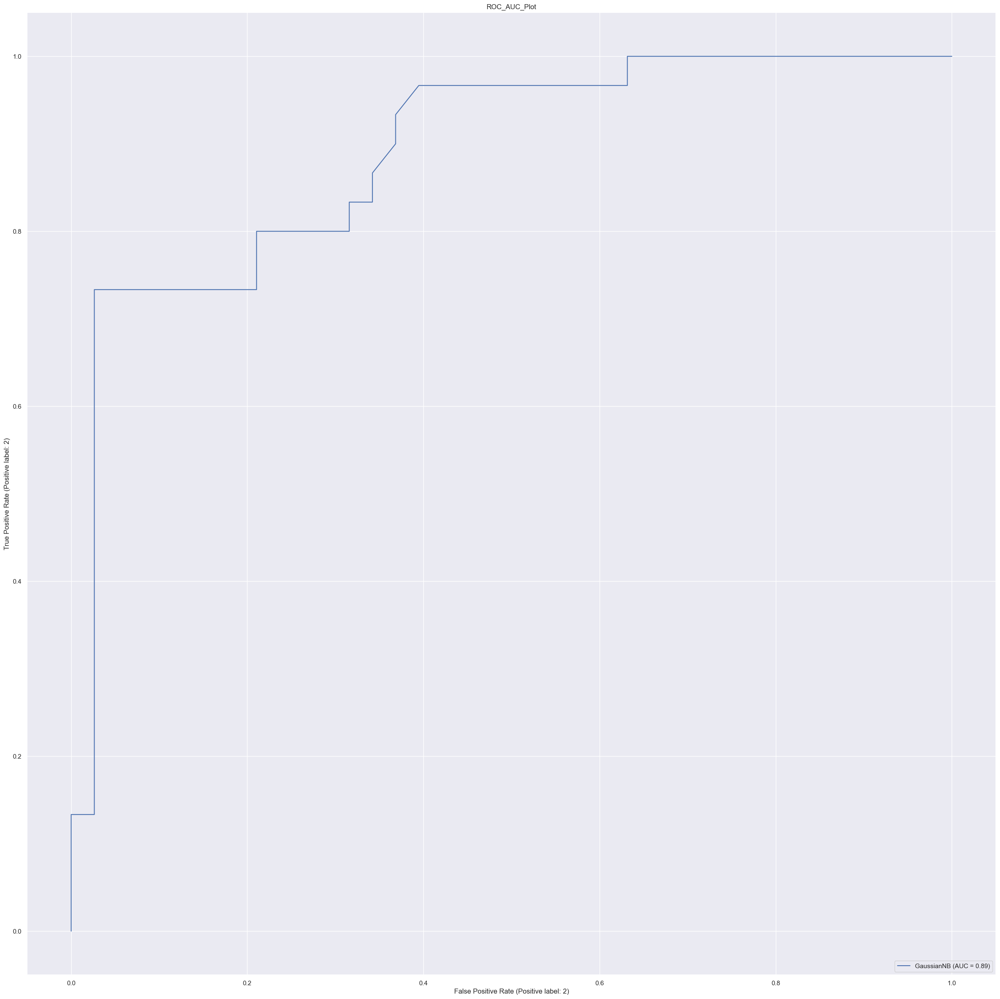

In [541]:
model(classifier_NB)

              precision    recall  f1-score   support

           1       0.79      0.79      0.79        38
           2       0.73      0.73      0.73        30

    accuracy                           0.76        68
   macro avg       0.76      0.76      0.76        68
weighted avg       0.76      0.76      0.76        68



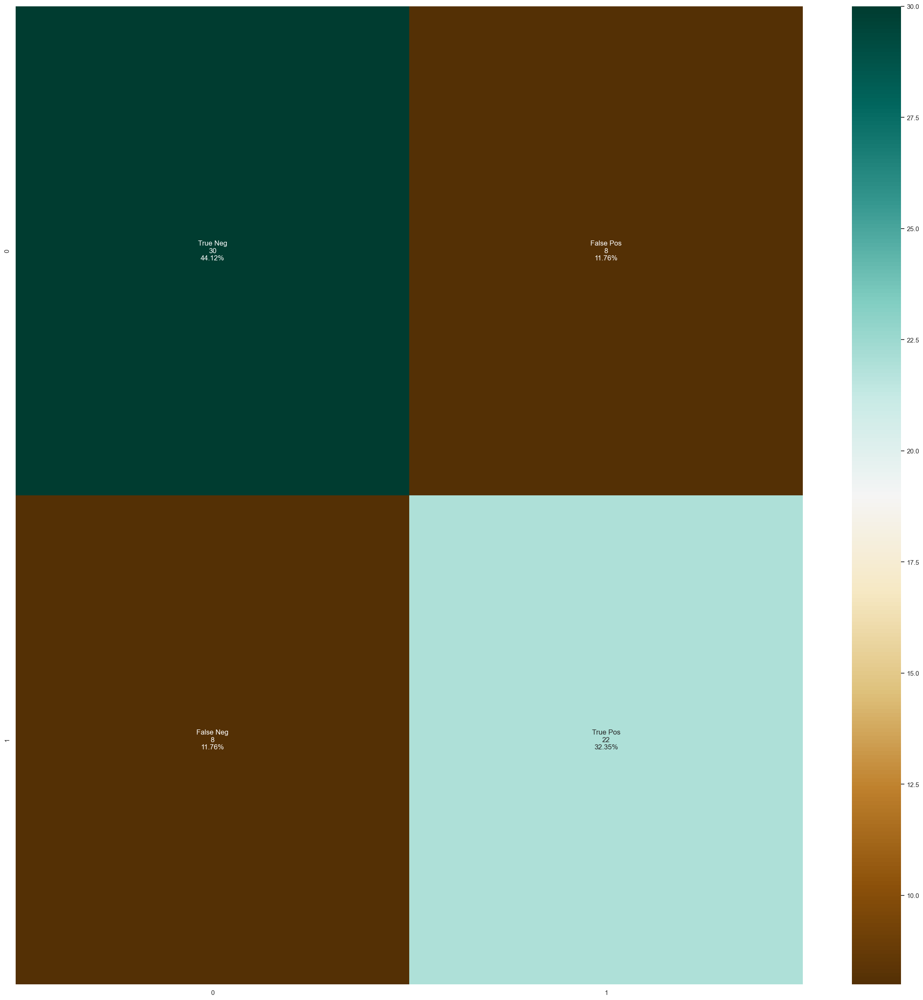

In [542]:
model_evaluation(classifier_NB)

# 6.Gradient Boosting and AdaBoost Classifier

In [558]:
gb = GradientBoostingClassifier(random_state = 1,min_samples_leaf=50,min_samples_split=10)
ab=AdaBoostClassifier()

In [559]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [560]:
parameters={'learning_rate': [0.1,0.9],
            'subsample':[0.1,0.9],
            'n_estimators':[1,200],
            'max_depth':[1,100],
            'min_samples_split':[50,140],
            'min_samples_leaf':[50,140]
           }

In [561]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [562]:
classifier_Gb.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(min_samples_leaf=50,
                                                  min_samples_split=10,
                                                  random_state=1),
             param_grid={'learning_rate': [0.1, 0.9], 'max_depth': [1, 100],
                         'min_samples_leaf': [50, 140],
                         'min_samples_split': [50, 140],
                         'n_estimators': [1, 200], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [563]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.1, 'max_depth': 100, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 200, 'subsample': 0.9}


In [564]:
print(classifier_Gb.best_score_)

0.8088888888888888


In [565]:
##prediction
y_pred1=classifier_Gb.predict(XXtest)

In [566]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.7647058823529411
error rate is 0.23529411764705888


In [567]:
# imbalanced and via grid search
print(classification_report(y_pred1,YYtest))

              precision    recall  f1-score   support

           1       0.76      0.81      0.78        36
           2       0.77      0.72      0.74        32

    accuracy                           0.76        68
   macro avg       0.76      0.76      0.76        68
weighted avg       0.76      0.76      0.76        68



              precision    recall  f1-score   support

           1       0.81      0.76      0.78        38
           2       0.72      0.77      0.74        30

    accuracy                           0.76        68
   macro avg       0.76      0.76      0.76        68
weighted avg       0.77      0.76      0.77        68



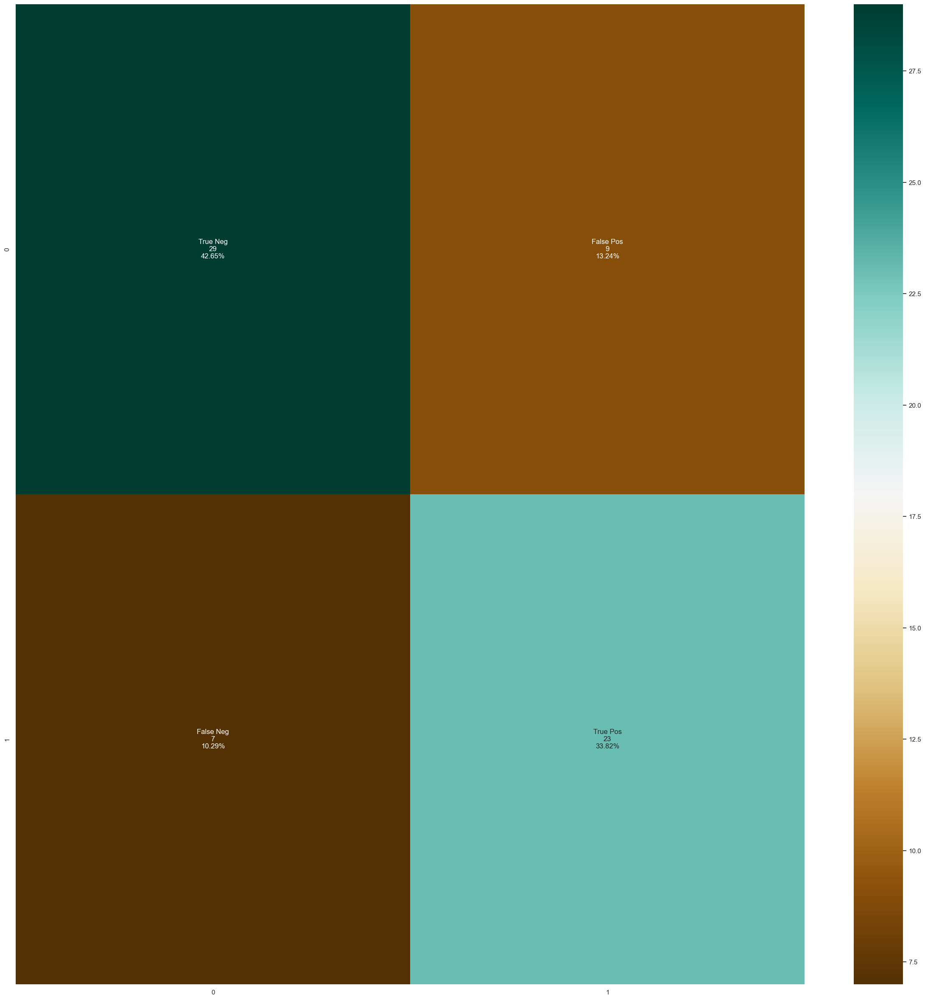

In [568]:
model_evaluation(classifier_Gb)

Accuracy :  77.94%
Cross Validation Score :  88.31%
ROC_AUC Score :  77.81%


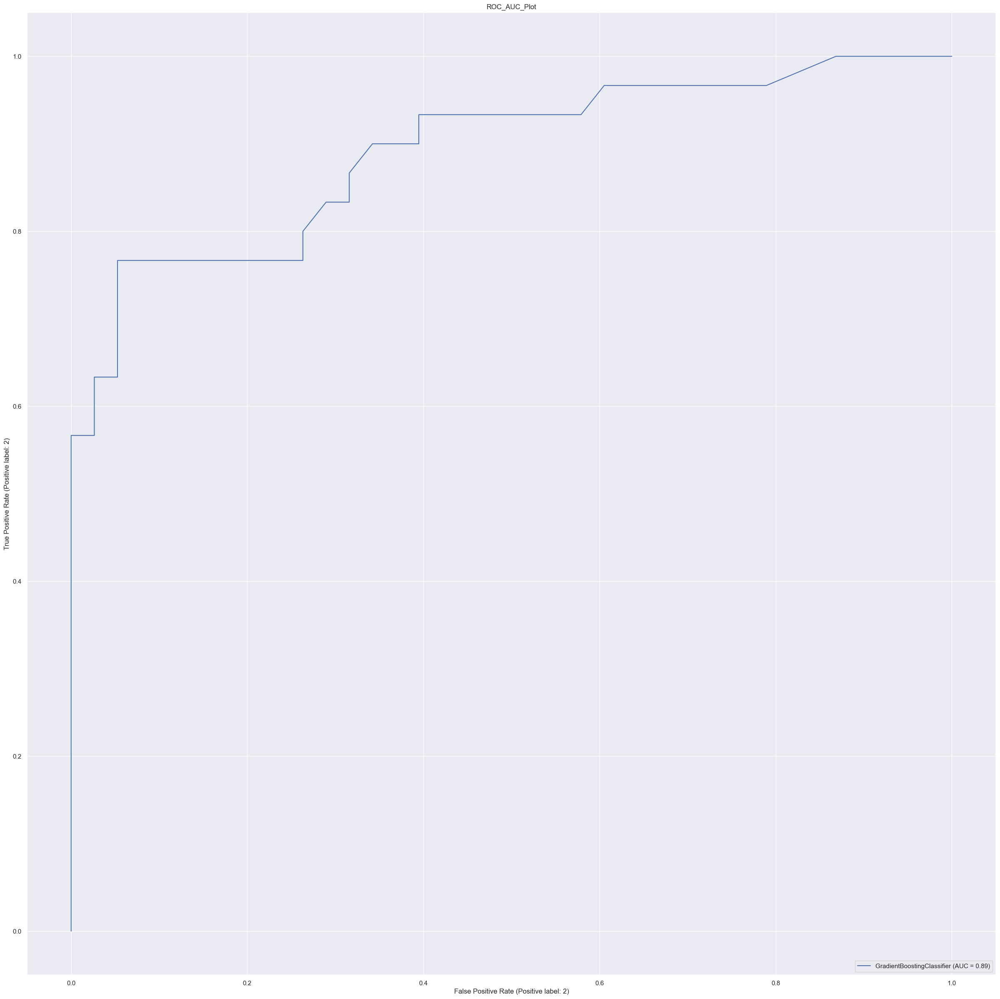

In [569]:
model(gb)

Accuracy :  79.41%
Cross Validation Score :  83.75%
ROC_AUC Score :  80.18%


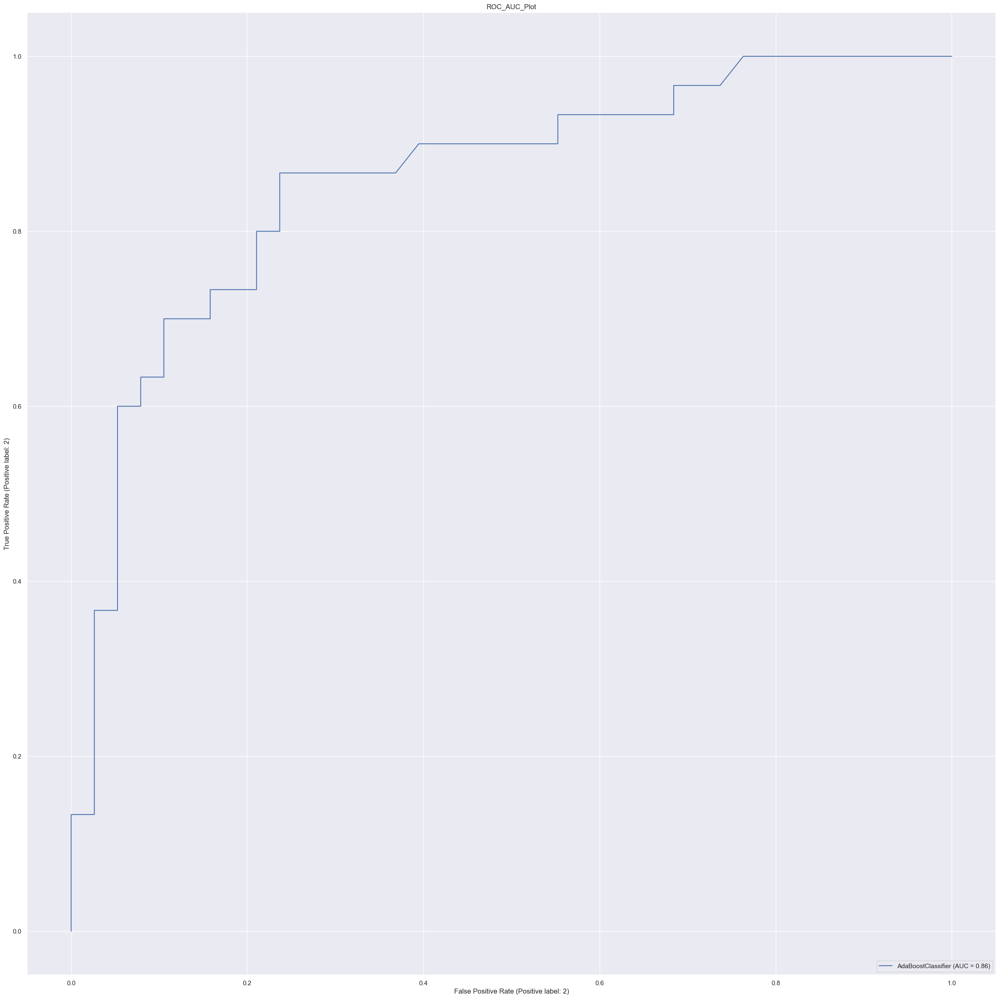

In [555]:
model(ab)

              precision    recall  f1-score   support

           1       0.84      0.84      0.84        38
           2       0.80      0.80      0.80        30

    accuracy                           0.82        68
   macro avg       0.82      0.82      0.82        68
weighted avg       0.82      0.82      0.82        68



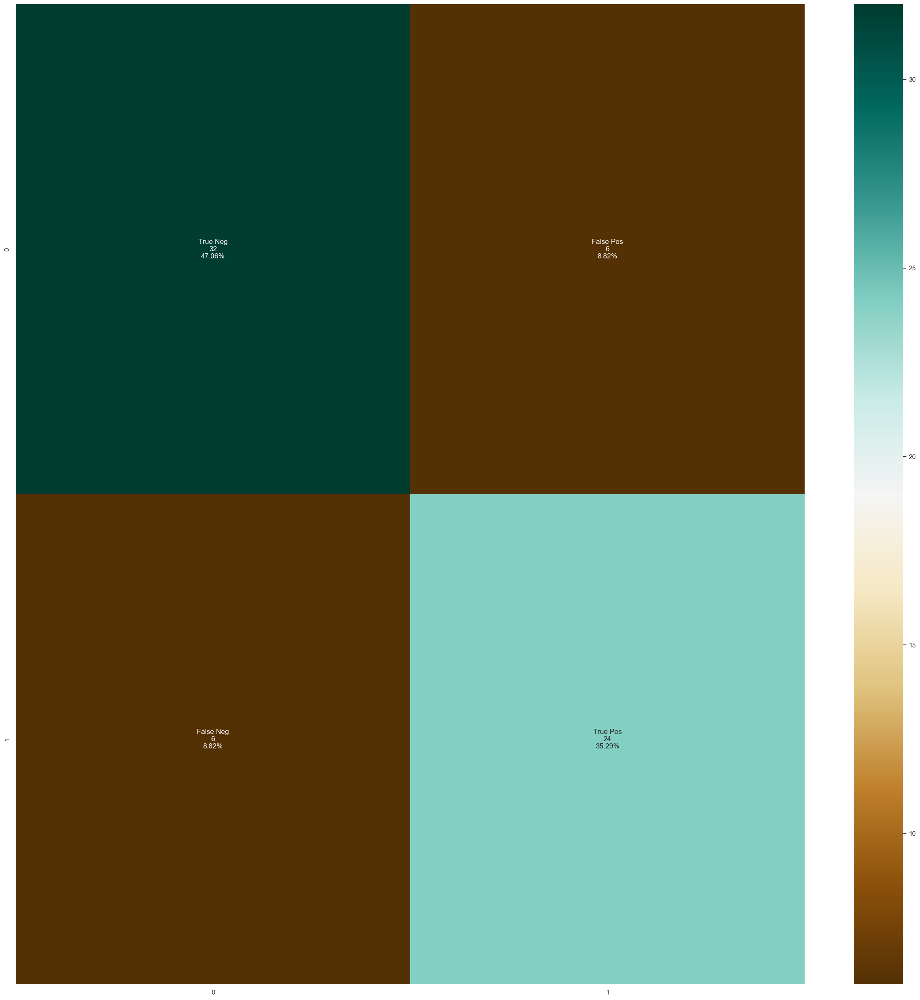

In [556]:
model_evaluation(gb)

              precision    recall  f1-score   support

           1       0.88      0.74      0.80        38
           2       0.72      0.87      0.79        30

    accuracy                           0.79        68
   macro avg       0.80      0.80      0.79        68
weighted avg       0.81      0.79      0.79        68



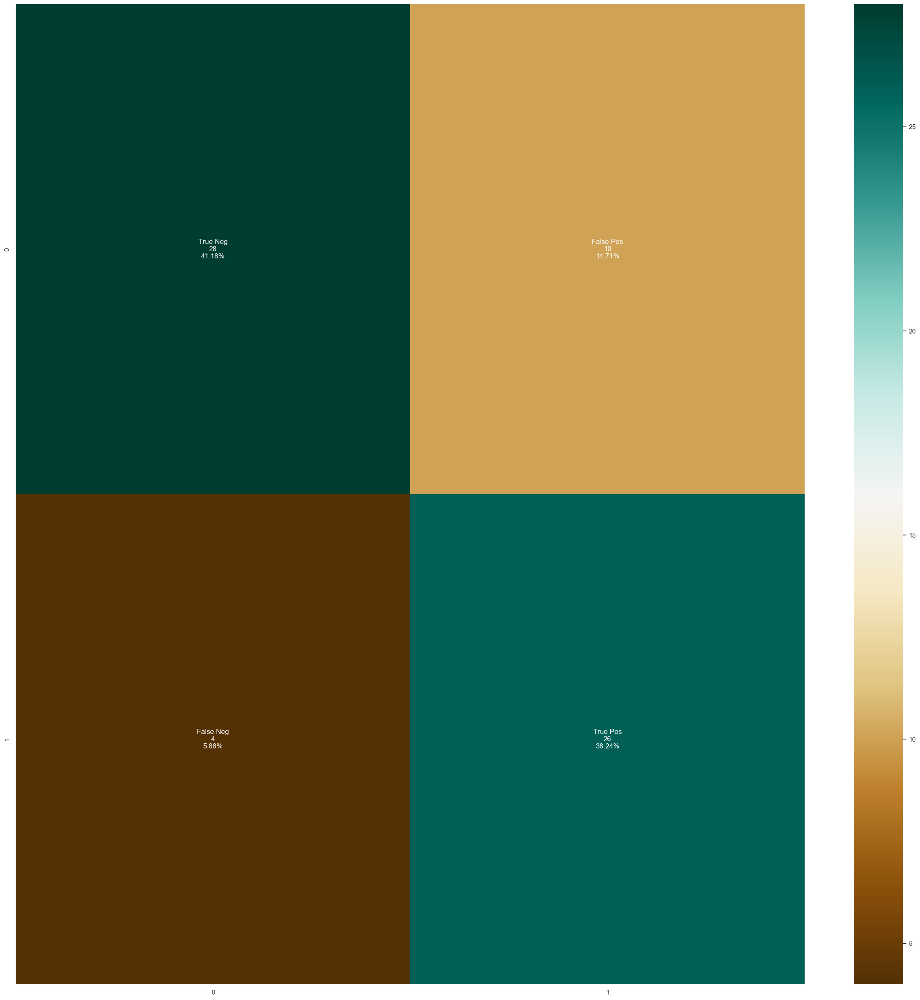

In [557]:
model_evaluation(ab)